In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/tusimple/test_label_new.json
/kaggle/input/tusimple/TUSimple/test_label.json
/kaggle/input/tusimple/TUSimple/test_set/readme.md
/kaggle/input/tusimple/TUSimple/test_set/test_tasks_0627.json
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/20.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/6.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/5.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/8.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/10.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/9.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/1.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/16.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/7.jpg
/kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/13.jpg
/kaggle/inpu

In [3]:
# ============================================================
# Cell 1: Setup, Environment Checks, and TuSimple Data Probe
# ============================================================

import os, sys, json, math, random, glob, time
from pathlib import Path

import numpy as np
import pandas as pd

# --- Torch & CUDA info
import torch
import torch.backends.cudnn as cudnn

def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    cudnn.deterministic = False
    cudnn.benchmark = True

seed_everything(42)

device = "cuda" if torch.cuda.is_available() else "cpu"
gpu_info = []
if torch.cuda.is_available():
    try:
        for i in range(torch.cuda.device_count()):
            gpu_info.append({
                "index": i,
                "name": torch.cuda.get_device_name(i),
                "capability": torch.cuda.get_device_capability(i),
                "total_memory_GB": round(torch.cuda.get_device_properties(i).total_memory / (1024**3), 2),
            })
    except Exception as e:
        gpu_info = [str(e)]
else:
    gpu_info = ["CPU only"]

print("==== Environment ====")
print("Python:", sys.version.split()[0])
print("Torch:", torch.__version__)
print("CUDA version (Torch):", torch.version.cuda if torch.cuda.is_available() else None)
print("cuDNN:", cudnn.version() if torch.cuda.is_available() else None)
print("Device(s):", gpu_info)
print()

# ------------------------------------------------------------
# Locate TuSimple dataset (handles common Kaggle mirrors)
# ------------------------------------------------------------
CANDIDATES = [
    "/kaggle/input/tusimple/TUSimple",
    "/kaggle/input/tusimple",           # some mirrors drop the extra folder
    "/kaggle/input/TUSimple",
    "/kaggle/input"
]

def looks_like_tusimple_root(path: str) -> bool:
    if not os.path.isdir(path):
        return False
    # Any of these present is a good sign
    markers = [
        "train_set", "test_set", "clips", "test_label.json",
        "label_data_0313.json", "label_data_0531.json", "label_data_0601.json"
    ]
    present = [os.path.exists(os.path.join(path, m)) for m in markers]
    return any(present)

def guess_base_dir() -> str:
    # 1) direct candidates
    for p in CANDIDATES:
        if looks_like_tusimple_root(p):
            return p
    # 2) deep search
    for root, dirs, files in os.walk("/kaggle/input"):
        if "TUSimple" in dirs and looks_like_tusimple_root(os.path.join(root, "TUSimple")):
            return os.path.join(root, "TUSimple")
        # Fallback: any folder with train_set or test_set
        if "train_set" in dirs or "test_set" in dirs:
            return root
    return None

BASE_DIR = guess_base_dir()
assert BASE_DIR is not None, "TuSimple base directory not found under /kaggle/input. Please add the dataset input."
print("==== TuSimple Base Dir ====")
print(BASE_DIR)
print()

# Build expected paths
def p(*xs): return os.path.join(*xs)

paths = {
    "base_dir": BASE_DIR,
    "train_jsons": [
        p(BASE_DIR, "train_set", "label_data_0313.json"),
        p(BASE_DIR, "train_set", "label_data_0531.json"),
        p(BASE_DIR, "train_set", "label_data_0601.json"),
    ],
    "train_jsons_alt": [
        p(BASE_DIR, "label_data_0313.json"),
        p(BASE_DIR, "label_data_0531.json"),
        p(BASE_DIR, "label_data_0601.json"),
    ],
    "seg_label_dir": p(BASE_DIR, "train_set", "seg_label"),
    "seg_split_trainval": p(BASE_DIR, "train_set", "seg_label", "train_val.json"),
    "seg_split_test": p(BASE_DIR, "train_set", "seg_label", "test.json"),
    "test_label": p(BASE_DIR, "test_label.json"),
    "test_label_new": p(BASE_DIR, "test_label_new.json"),
    "test_tasks": p(BASE_DIR, "test_set", "test_tasks_0627.json"),
    "test_clips_dir": p(BASE_DIR, "test_set", "clips"),
}

def file_exists(x): return os.path.isfile(x)
def dir_exists(x): return os.path.isdir(x)

# Check for original JSON labels
json_found = all(file_exists(x) for x in paths["train_jsons"])
if not json_found:
    # Some mirrors place label_data_*.json at base (not under train_set/)
    if all(file_exists(x) for x in paths["train_jsons_alt"]):
        paths["train_jsons"] = paths["train_jsons_alt"]
        json_found = True

def count_json_lines(fp: str) -> int:
    try:
        with open(fp, "r") as f:
            return sum(1 for _ in f)
    except Exception:
        return 0

json_counts = {}
if json_found:
    for fp in paths["train_jsons"]:
        json_counts[os.path.basename(fp)] = count_json_lines(fp)

# Probe segmentation labels (PNG masks)
seg_mask_count = 0
if dir_exists(paths["seg_label_dir"]):
    # Count PNG masks (approximate; this may take ~1–2s)
    for r, d, fs in os.walk(paths["seg_label_dir"]):
        seg_mask_count += sum(1 for fn in fs if fn.lower().endswith(".png"))

dataset_mode = "unknown"
if json_found:
    dataset_mode = "json"
elif seg_mask_count > 0:
    dataset_mode = "seg_mask"

assert dataset_mode != "unknown", (
    "Neither original JSON labels nor segmentation masks found.\n"
    f"Checked seg_label_dir={paths['seg_label_dir']}\n"
    f"Checked train_jsons={paths['train_jsons']}"
)

# Optional: peek the seg splits
seg_trainval_len = None
seg_test_len = None
if file_exists(paths["seg_split_trainval"]):
    try:
        with open(paths["seg_split_trainval"], "r") as f:
            seg_trainval = json.load(f)
        seg_trainval_len = len(seg_trainval) if isinstance(seg_trainval, list) else None
    except Exception:
        seg_trainval_len = None

if file_exists(paths["seg_split_test"]):
    try:
        with open(paths["seg_split_test"], "r") as f:
            seg_test = json.load(f)
        seg_test_len = len(seg_test) if isinstance(seg_test, list) else None
    except Exception:
        seg_test_len = None

# Save a small config for later cells
CONFIG = {
    "seed": 42,
    "device": device,
    "dataset_mode": dataset_mode,     # 'json' preferred; 'seg_mask' fallback
    "paths": paths,
    "env": {
        "python": sys.version.split()[0],
        "torch": torch.__version__,
        "cuda": torch.version.cuda if torch.cuda.is_available() else None,
        "cudnn": cudnn.version() if torch.cuda.is_available() else None,
        "gpus": gpu_info,
    },
    # Common training/eval settings we’ll reuse
    "training_resolution": [368, 640],   # (H, W): typical for TuSimple
    "eval": {
        "metric": "tusimple_official",
        "tp_threshold": 0.85,            # lane-wise accuracy threshold
        "tolerance_px": 20               # per-row pixel tolerance
    }
}

os.makedirs("/kaggle/working", exist_ok=True)
with open("/kaggle/working/config_tusimple.json", "w") as f:
    json.dump(CONFIG, f, indent=2)

# Human-readable summary
print("==== TuSimple Dataset Probe Summary ====")
print(f"Dataset mode           : {dataset_mode}  (json_found={json_found}, seg_masks≈{seg_mask_count})")
print(f"Train JSONs present    : {json_found}")
if json_found:
    for k, v in json_counts.items():
        print(f"  - {k:>20s} : {v} lines")
else:
    print("  - Using segmentation-mask fallback (PNG) with split files if available.")
print(f"Seg splits available   : train_val.json={file_exists(paths['seg_split_trainval'])} "
      f"({seg_trainval_len if seg_trainval_len is not None else 'n/a'} items), "
      f"test.json={file_exists(paths['seg_split_test'])} "
      f"({seg_test_len if seg_test_len is not None else 'n/a'} items)")
print(f"Test label present     : {file_exists(paths['test_label']) or file_exists(paths['test_label_new'])}")
print(f"Test tasks present     : {file_exists(paths['test_tasks'])}")
print(f"Test clips dir exists  : {dir_exists(paths['test_clips_dir'])}")
print(f"Config saved to        : /kaggle/working/config_tusimple.json")

# Quick peek at a few test images (non-blocking, just paths)
def sample_files(root: str, ext: str = ".jpg", k: int = 5):
    out = []
    if not dir_exists(root): 
        return out
    for r, d, fs in os.walk(root):
        for fn in fs:
            if fn.lower().endswith(ext):
                out.append(os.path.join(r, fn))
                if len(out) >= k:
                    return out
    return out

test_samples = sample_files(paths["test_clips_dir"], ".jpg", 5)
if test_samples:
    print("Sample test images:")
    for s in test_samples:
        print("  ", s)
print("✓ Cell 1 complete.")

==== Environment ====
Python: 3.11.13
Torch: 2.6.0+cu124
CUDA version (Torch): 12.4
cuDNN: 90300
Device(s): [{'index': 0, 'name': 'Tesla T4', 'capability': (7, 5), 'total_memory_GB': 14.74}, {'index': 1, 'name': 'Tesla T4', 'capability': (7, 5), 'total_memory_GB': 14.74}]

==== TuSimple Base Dir ====
/kaggle/input/tusimple/TUSimple

==== TuSimple Dataset Probe Summary ====
Dataset mode           : json  (json_found=True, seg_masks≈6408)
Train JSONs present    : True
  - label_data_0313.json : 2858 lines
  - label_data_0531.json : 358 lines
  - label_data_0601.json : 410 lines
Seg splits available   : train_val.json=True (n/a items), test.json=True (n/a items)
Test label present     : True
Test tasks present     : True
Test clips dir exists  : True
Config saved to        : /kaggle/working/config_tusimple.json
Sample test images:
   /kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/20.jpg
   /kaggle/input/tusimple/TUSimple/test_set/clips/0531/1492628880603080608/6.j

In [4]:
# ============================================================
# Cell 2: Parse TuSimple labels → Consolidated DataFrame
# ============================================================

import os, json
from pathlib import Path
import numpy as np
import pandas as pd

# Load config from Cell 1
CFG_PATH = "/kaggle/working/config_tusimple.json"
assert os.path.isfile(CFG_PATH), "Missing config_tusimple.json; run Cell 1 first."
with open(CFG_PATH, "r") as f:
    CONFIG = json.load(f)

BASE_DIR = CONFIG["paths"]["base_dir"]
paths = CONFIG["paths"]
dataset_mode = CONFIG["dataset_mode"]

print("Using base dir:", BASE_DIR)
print("Dataset mode  :", dataset_mode)

# --------------------------
# Helpers
# --------------------------
def try_resolve_image_path(base_dir: str, raw_file: str) -> str | None:
    """
    TuSimple 'raw_file' is usually relative to dataset root: 'clips/xxxx/.../20.jpg'.
    Some mirrors move images under 'train_set/clips/'. Try a few candidates.
    """
    candidates = [
        os.path.join(base_dir, raw_file),
        os.path.join(base_dir, "train_set", raw_file),
        os.path.join(base_dir, "clips", *Path(raw_file).parts[1:]) if raw_file.startswith("clips") else None,
        os.path.join(base_dir, "train_set", "clips", *Path(raw_file).parts[1:]) if raw_file.startswith("clips") else None,
    ]
    for c in candidates:
        if c and os.path.isfile(c):
            return c
    return None

def sort_lanes_left_to_right(lanes: list[list[int]]) -> list[list[int]]:
    """
    Sort by the median x among visible points (>=0). Lanes with no visible
    points keep their relative order at the far left.
    """
    scored = []
    for idx, lane in enumerate(lanes):
        xs = [x for x in lane if x is not None and x >= 0]
        if len(xs) == 0:
            score = -1e9  # push to far left, keep stable by (score, idx)
        else:
            score = float(np.median(xs))
        scored.append((score, idx, lane))
    scored.sort(key=lambda t: (t[0], t[1]))
    return [lane for _, _, lane in scored]

def normalize_lane_points(lane_row: list[int]) -> list[int | None]:
    """
    Replace TuSimple sentinel (-2 or <0) with None for easier downstream ops.
    Keep non-negative x as is.
    """
    out = []
    for x in lane_row:
        if x is None:
            out.append(None)
        elif isinstance(x, (int, float)) and x >= 0:
            out.append(int(x))
        else:
            out.append(None)
    return out

def parse_jsonl(fp: str) -> list[dict]:
    rows = []
    with open(fp, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            d = json.loads(line)
            rows.append(d)
    return rows

# --------------------------
# Parse original JSON labels
# --------------------------
assert dataset_mode == "json", "This notebook detected seg-mask fallback earlier; rerun Cell 1 or adjust dataset."

train_jsons = paths["train_jsons"]
for fp in train_jsons:
    assert os.path.isfile(fp), f"Missing expected label file: {fp}"

parsed_sets = []
for fp in train_jsons:
    part = os.path.basename(fp)  # e.g., label_data_0313.json
    js = parse_jsonl(fp)
    for obj in js:
        raw_file = obj.get("raw_file")
        h_samples = obj.get("h_samples", [])
        lanes = obj.get("lanes", [])
        # Normalize lanes
        lanes_norm = [normalize_lane_points(l) for l in lanes]
        # Drop lanes that are fully None (in case they exist)
        lanes_norm = [l for l in lanes_norm if any(v is not None for v in l)]
        # Sort left->right
        lanes_sorted = sort_lanes_left_to_right(lanes_norm)
        img_path = try_resolve_image_path(BASE_DIR, raw_file)
        parsed_sets.append({
            "source_file": part,
            "raw_file": raw_file,
            "img_path": img_path,
            "h_samples": h_samples,
            "lanes": lanes_sorted,
            "num_lanes": len(lanes_sorted),
        })

df = pd.DataFrame(parsed_sets)
print("Parsed rows:", len(df))
missing_img = df["img_path"].isna().sum()
print("Missing image paths:", int(missing_img))
if missing_img > 0:
    # Show a couple for debugging
    display(df[df["img_path"].isna()].head(3))

# --------------------------
# Canonical split
#   VAL = 0531.json (358)
#   TRAIN = 0313.json + 0601.json (3268)
# --------------------------
def map_split(src: str) -> str:
    if "0531" in src:
        return "val"
    elif "0313" in src or "0601" in src:
        return "train"
    return "train"

df["split"] = df["source_file"].map(map_split)

# Sanity checks & quick stats
total = len(df)
by_split = df["split"].value_counts(dropna=False).to_dict()
hs_lengths = df["h_samples"].map(lambda x: len(x) if isinstance(x, list) else None)
lane_counts = df["num_lanes"].value_counts().sort_index()

print("\n==== Consolidated Summary ====")
print(f"Total labeled frames : {total}")
print(f"By split             : {by_split}")
print(f"h_samples length     : unique lengths = {sorted(hs_lengths.dropna().unique().tolist())[:10]} "
      f"(showing up to 10)")
print("Lane count histogram :")
for k, v in lane_counts.items():
    print(f"  lanes={k}: {v}")

# Ensure at least one sample per split has a valid path
for sp in ["train", "val"]:
    ok = df[(df["split"] == sp) & df["img_path"].notna()]
    print(f"{sp} samples with files: {len(ok)}")

# Save consolidated table (parquet for speed, and a small CSV preview)
PARQUET_PATH = "/kaggle/working/tusimple_consolidated.parquet"
CSV_PREVIEW = "/kaggle/working/tusimple_preview.csv"

df.to_parquet(PARQUET_PATH, index=False)
df.sample(10, random_state=42)[["split", "source_file", "raw_file", "img_path", "num_lanes"]].to_csv(
    CSV_PREVIEW, index=False
)

# Update config with paths and split info
CONFIG["dataframe_path"] = PARQUET_PATH
CONFIG["split_scheme"] = "val=0531, train=0313+0601"
with open(CFG_PATH, "w") as f:
    json.dump(CONFIG, f, indent=2)

print("\nSaved:")
print(" - Parquet:", PARQUET_PATH)
print(" - Preview CSV:", CSV_PREVIEW)
print("✓ Cell 2 complete.")


Using base dir: /kaggle/input/tusimple/TUSimple
Dataset mode  : json
Parsed rows: 3626
Missing image paths: 0

==== Consolidated Summary ====
Total labeled frames : 3626
By split             : {'train': 3268, 'val': 358}
h_samples length     : unique lengths = [48, 56] (showing up to 10)
Lane count histogram :
  lanes=2: 5
  lanes=3: 933
  lanes=4: 2449
  lanes=5: 239
train samples with files: 3268
val samples with files: 358

Saved:
 - Parquet: /kaggle/working/tusimple_consolidated.parquet
 - Preview CSV: /kaggle/working/tusimple_preview.csv
✓ Cell 2 complete.


In [5]:
# ============================================================
# Cell 3: TuSimple Metrics Re-Implementation (+ sanity tests)
# - Computes image-level and dataset-level:
#     * Accuracy (C / S)
#     * F1, FP, FN with lane-wise TP threshold (default 0.85)
# - Matching policy:
#     * Build a GT x Pred matrix of lane-wise accuracies
#     * Greedy 1-1 matching by highest accuracy (common practice)
#     * Only pairs with acc >= threshold counted as TP for F1
# - Provides a clean API we’ll reuse later for model evaluation.
# ============================================================

import os, json, math
from typing import List, Tuple, Optional, Dict
import numpy as np
import pandas as pd

# Load consolidated DF (from Cell 2) + CONFIG
CFG_PATH = "/kaggle/working/config_tusimple.json"
with open(CFG_PATH, "r") as f:
    CONFIG = json.load(f)

PARQUET_PATH = CONFIG["dataframe_path"]
df = pd.read_parquet(PARQUET_PATH)

TP_THRESH = CONFIG["eval"]["tp_threshold"]
TOL_PX    = CONFIG["eval"]["tolerance_px"]

# --------------------------
# Utilities
# --------------------------
def _to_none(x):
    """Normalize label sentinel to None."""
    if x is None:
        return None
    try:
        xv = int(x)
    except Exception:
        return None
    return xv if xv >= 0 else None

def _align_lengths(gt_lane: List[Optional[int]], pred_lane: List[Optional[int]], n: int):
    """
    Ensure both lists are length n (len(h_samples)), padding with None if needed.
    """
    def pad_to(xs, L):
        if len(xs) >= L: 
            return xs[:L]
        return xs + [None] * (L - len(xs))
    return pad_to(gt_lane, n), pad_to(pred_lane, n)

def lane_point_counts(
    gt_lane: List[Optional[int]],
    pred_lane: List[Optional[int]],
    h_samples: List[int],
    tol_px: int = 20
) -> Tuple[int, int]:
    """
    Count (correct, total) for one GT lane vs one predicted lane, using TuSimple row grid.
    A row is 'correct' if both have valid x and |dx| <= tol_px.
    Total = number of valid GT points (rows where GT has x != None).
    """
    n = len(h_samples)
    gt_lane, pred_lane = _align_lengths(gt_lane, pred_lane, n)
    correct = 0
    total = 0
    for gx, px in zip(gt_lane, pred_lane):
        if gx is not None:
            total += 1
            if px is not None and abs(px - gx) <= tol_px:
                correct += 1
    return correct, total

def lane_accuracy(
    gt_lane: List[Optional[int]],
    pred_lane: List[Optional[int]],
    h_samples: List[int],
    tol_px: int = 20
) -> float:
    c, s = lane_point_counts(gt_lane, pred_lane, h_samples, tol_px)
    return 0.0 if s == 0 else c / s

def greedy_match_accuracy_matrix(
    A: np.ndarray
) -> List[Tuple[int, int, float]]:
    """
    Greedy maximum-accuracy matching.
    Input:
      A: (G x P) matrix of lane-wise accuracies in [0,1].
    Output:
      list of tuples (gi, pj, acc) for matched pairs.
    """
    A = A.copy()
    G, P = A.shape
    used_g = set()
    used_p = set()
    matches = []
    # Flatten indices with scores
    pairs = [ (A[g, p], g, p) for g in range(G) for p in range(P) ]
    pairs.sort(key=lambda t: t[0], reverse=True)
    for acc, g, p in pairs:
        if g in used_g or p in used_p:
            continue
        if acc <= 0:
            break
        used_g.add(g); used_p.add(p)
        matches.append((g, p, float(acc)))
    return matches

def evaluate_image(
    h_samples: List[int],
    gt_lanes: List[List[Optional[int]]],
    pred_lanes: List[List[Optional[int]]],
    tol_px: int = 20,
    tp_threshold: float = 0.85,
) -> Dict[str, float]:
    """
    Evaluate one image.
    Returns dict with: C, S, TP, FP, FN, acc_img, precision, recall, f1
    """
    # Short-circuits
    G = len(gt_lanes)
    P = len(pred_lanes)
    # Build accuracy + correct-points matrices
    acc_mat = np.zeros((G, P), dtype=np.float32) if (G>0 and P>0) else np.zeros((0,0), dtype=np.float32)
    corr_mat = np.zeros((G, P), dtype=np.int32)   if (G>0 and P>0) else np.zeros((0,0), dtype=np.int32)
    tot_per_gt = np.zeros((G,), dtype=np.int32)

    for gi in range(G):
        # Compute total GT points for denominator S (per-lane)
        tot = 0
        for gx in gt_lanes[gi]:
            if gx is not None:
                tot += 1
        tot_per_gt[gi] = tot

    for gi in range(G):
        for pj in range(P):
            c, s = lane_point_counts(gt_lanes[gi], pred_lanes[pj], h_samples, tol_px)
            corr_mat[gi, pj] = c
            acc_mat[gi, pj] = 0.0 if s == 0 else c / s

    # Greedy 1-1 matching
    matches = greedy_match_accuracy_matrix(acc_mat)

    # Points-based accuracy: sum correct points over matched pairs; denominator = sum of GT points (all lanes)
    C_img = 0
    for (gi, pj, _) in matches:
        C_img += int(corr_mat[gi, pj])
    S_img = int(tot_per_gt.sum())  # all GT points across lanes
    acc_img = 0.0 if S_img == 0 else C_img / S_img

    # F1/FP/FN with lane-wise TP threshold
    TP = sum(1 for (_, _, a) in matches if a >= tp_threshold)
    FN = max(G - TP, 0)
    FP = max(P - TP, 0)

    precision = 0.0 if (TP + FP) == 0 else TP / (TP + FP)
    recall    = 0.0 if (TP + FN) == 0 else TP / (TP + FN)
    f1        = 0.0 if (precision + recall) == 0 else 2 * precision * recall / (precision + recall)

    return {
        "C": float(C_img),
        "S": float(S_img),
        "acc_img": float(acc_img),
        "TP": float(TP),
        "FP": float(FP),
        "FN": float(FN),
        "precision": float(precision),
        "recall": float(recall),
        "f1": float(f1),
        "G": float(G),
        "P": float(P),
    }

def evaluate_dataset(
    gts: List[Dict],
    preds: Dict[str, Dict],
    tol_px: int = 20,
    tp_threshold: float = 0.85,
    verbose_every: int = 0
) -> Dict[str, float]:
    """
    gts: list of dicts with keys: 'raw_file', 'h_samples', 'lanes' (GT)
         lanes is list of lists of x or None for each y
    preds: dict mapping raw_file -> {'h_samples': [...], 'lanes': [...]}
           predictions must be at the same h_samples (we'll enforce)
    Returns aggregate metrics.
    """
    C_total, S_total = 0.0, 0.0
    TP_total, FP_total, FN_total = 0.0, 0.0, 0.0
    n_img = 0

    for i, gt in enumerate(gts):
        raw_file = gt["raw_file"]
        h_gt = gt["h_samples"]
        gt_lanes = [ [_to_none(x) for x in lane] for lane in gt["lanes"] ]

        pred = preds.get(raw_file, None)
        if pred is None:
            # no prediction => all FN
            G = len(gt_lanes)
            # S still includes gt points
            S_img = sum(1 for lane in gt_lanes for x in lane if x is not None)
            C_total += 0.0
            S_total += float(S_img)
            TP_total += 0.0
            FP_total += 0.0
            FN_total += float(G)
            n_img += 1
            continue

        # Enforce same h_samples (TuSimple rule). If mismatch, resample pred to GT rows by nearest y index.
        h_pred = pred.get("h_samples", [])
        pred_lanes = pred.get("lanes", [])
        if h_pred != h_gt:
            # Map pred to GT rows by nearest indices
            # Build index map from GT row id -> closest pred row id
            idx_map = []
            for y in h_gt:
                # find closest in h_pred
                if len(h_pred) == 0:
                    idx_map.append(None)
                else:
                    j = int(np.argmin([abs(y - yp) for yp in h_pred]))
                    idx_map.append(j)
            # remap each pred lane
            remapped = []
            for lane in pred_lanes:
                lane = [_to_none(x) for x in lane]
                lane = lane[:len(h_pred)]
                new_lane = []
                for jj in idx_map:
                    if jj is None or jj >= len(lane) or jj < 0:
                        new_lane.append(None)
                    else:
                        new_lane.append(lane[jj])
                remapped.append(new_lane)
            pred_lanes = remapped

        # Evaluate
        res = evaluate_image(h_gt, gt_lanes, pred_lanes, tol_px=tol_px, tp_threshold=tp_threshold)
        C_total += res["C"]
        S_total += res["S"]
        TP_total += res["TP"]
        FP_total += res["FP"]
        FN_total += res["FN"]
        n_img += 1

        if verbose_every and (i+1) % verbose_every == 0:
            print(f"[{i+1}/{len(gts)}] acc={C_total/S_total:.4f} F1={ (0 if (2*TP_total+FP_total+FN_total)==0 else 2*TP_total/(2*TP_total+FP_total+FN_total)) :.4f}")

    acc = 0.0 if S_total == 0 else C_total / S_total
    precision = 0.0 if (TP_total + FP_total) == 0 else TP_total / (TP_total + FP_total)
    recall    = 0.0 if (TP_total + FN_total) == 0 else TP_total / (TP_total + FN_total)
    f1        = 0.0 if (precision + recall) == 0 else 2 * precision * recall / (precision + recall)

    return {
        "images": float(n_img),
        "C": float(C_total),
        "S": float(S_total),
        "accuracy": float(acc),
        "TP": float(TP_total),
        "FP": float(FP_total),
        "FN": float(FN_total),
        "precision": float(precision),
        "recall": float(recall),
        "f1": float(f1),
    }

# --------------------------
# Tiny unit tests (synthetic)
# --------------------------
def _unit_tests():
    # Simple h grid
    h = [100, 110, 120, 130, 140]
    # GT: two lanes, straight
    gt = {
        "raw_file": "dummy.jpg",
        "h_samples": h,
        "lanes": [
            [100, 100, 100, 100, 100],
            [200, 200, 200, 200, 200],
        ]
    }

    # Case A: perfect prediction (two lanes exact)
    predA = {
        "h_samples": h,
        "lanes": [
            [100, 100, 100, 100, 100],
            [200, 200, 200, 200, 200],
        ]
    }
    rA = evaluate_dataset([gt], {"dummy.jpg": predA}, tol_px=20, tp_threshold=0.85)
    assert abs(rA["accuracy"] - 1.0) < 1e-9, f"A acc {rA}"
    assert abs(rA["f1"] - 1.0) < 1e-9, f"A f1 {rA}"

    # Case B: one lane missing -> FN=1, TP=1, FP=0; accuracy = 5/10 = 0.5
    predB = {
        "h_samples": h,
        "lanes": [
            [100, 100, 100, 100, 100],
        ]
    }
    rB = evaluate_dataset([gt], {"dummy.jpg": predB}, tol_px=20, tp_threshold=0.85)
    assert abs(rB["accuracy"] - 0.5) < 1e-9, f"B acc {rB}"
    assert rB["TP"] == 1 and rB["FN"] == 1 and rB["FP"] == 0, f"B counts {rB}"
    assert 0.66 <= rB["f1"] <= 0.67, f"B f1 {rB}"

    # Case C: both lanes predicted but shifted by 30px (beyond tol 20) -> 0 correct
    predC = {
        "h_samples": h,
        "lanes": [
            [130, 130, 130, 130, 130],
            [230, 230, 230, 230, 230],
        ]
    }
    rC = evaluate_dataset([gt], {"dummy.jpg": predC}, tol_px=20, tp_threshold=0.85)
    assert rC["accuracy"] == 0.0, f"C acc {rC}"
    assert rC["TP"] == 0 and rC["FP"] == 2 and rC["FN"] == 2, f"C counts {rC}"
    assert rC["f1"] == 0.0, f"C f1 {rC}"

    # Case D: one lane within tol, one slightly noisy within tol -> TP=2, acc close to 1
    predD = {
        "h_samples": h,
        "lanes": [
            [105, 98, 100, 116, 83],   # within +/-20 for all rows vs 100
            [215, 195, 210, 190, 220], # within +/-20 for all rows vs 200
        ]
    }
    rD = evaluate_dataset([gt], {"dummy.jpg": predD}, tol_px=20, tp_threshold=0.85)
    assert rD["TP"] == 2 and rD["FN"] == 0, f"D counts {rD}"
    assert rD["accuracy"] > 0.9, f"D acc {rD}"
    assert rD["f1"] == 1.0, f"D f1 {rD}"

    print("✓ Unit tests passed.")

_unit_tests()

# --------------------------
# Hook: build GT list from our consolidated DF (for later use)
# --------------------------
def build_gt_list_from_df(df: pd.DataFrame, split: str = "val") -> List[Dict]:
    """
    Build a list of GT dicts: {raw_file, h_samples, lanes} for a split.
    """
    sub = df[df["split"] == split].copy()
    gts = []
    for _, row in sub.iterrows():
        gts.append({
            "raw_file": row["raw_file"],
            "h_samples": list(map(int, row["h_samples"])),
            "lanes": [ [(_to_none(x)) for x in lane] for lane in row["lanes"] ],
        })
    return gts

VAL_GTS = build_gt_list_from_df(df, "val")
print(f"Prepared {len(VAL_GTS)} GT items for 'val' split.")
print("✓ Cell 3 complete.")

✓ Unit tests passed.
Prepared 358 GT items for 'val' split.
✓ Cell 3 complete.


In [6]:
# --- Cell 4 Hotfix: make _scale_xy robust to NaN/inf/negatives ---
import math, numpy as np

def _scale_xy(x, y, sx, sy):
    """
    Robustly scale label x,y with guards:
      - if x is None/NaN/inf/negative -> treat as missing (None)
    """
    xr = None
    try:
        if x is not None:
            xv = float(x)
            if np.isfinite(xv) and xv >= 0:
                xr = int(round(xv * sx))
    except Exception:
        xr = None
    yr = int(round(y * sy))
    return xr, yr

print("✓ _scale_xy hotfix applied.")

✓ _scale_xy hotfix applied.


In [7]:
# # ============================================================
# # Cell 4: Data module & transforms
# # - Single Dataset/Dataloader used by all models
# # - For each sample, returns:
# #     image: FloatTensor [3,H,W] (normalized)
# #     seg_mask: FloatTensor [1,H,W] (binary lane mask)
# #     row_anchor: dict with:
# #         cls  : LongTensor [MAX_LANES, N_rows]  (bin index 0..C-1 or IGNORE)
# #         valid: BoolTensor [MAX_LANES, N_rows]  (where a GT exists)
# #         n_rows: int (original per-sample row count)
# #         h_rows_resized: List[int] (resized y’s actually used)
# #     meta: raw_file, orig_hw, h_samples_orig, scale_xy
# # - Handles mixed h_samples lengths (48 or 56) by per-batch padding.
# # ============================================================

# import os, json, math, random
# from typing import List, Tuple, Optional, Dict
# from pathlib import Path

# import numpy as np
# import pandas as pd
# import cv2
# import torch
# from torch.utils.data import Dataset, DataLoader

# # Try Albumentations; fallback to minimal transforms if missing
# try:
#     import albumentations as A
#     from albumentations.pytorch import ToTensorV2
#     HAS_ALB = True
# except Exception:
#     HAS_ALB = False

# # Load config & consolidated DF
# CFG_PATH = "/kaggle/working/config_tusimple.json"
# with open(CFG_PATH, "r") as f:
#     CONFIG = json.load(f)
# PARQUET_PATH = CONFIG["dataframe_path"]
# df = pd.read_parquet(PARQUET_PATH)

# # --------------------------
# # Settings
# # --------------------------
# H, W = CONFIG["training_resolution"]           # e.g., 368 x 640
# C_BINS = 100                                   # row-anchor column bins
# MAX_LANES = 5                                  # keep up to 5 (left->right)
# IGNORE_INDEX = -1
# IMG_MEAN = (0.485, 0.456, 0.406)
# IMG_STD  = (0.229, 0.224, 0.225)
# DRAW_THICKNESS = 5                              # px for seg mask polylines

# # --------------------------
# # Geometry helpers
# # --------------------------
# def _scale_xy(x: Optional[int], y: int, sx: float, sy: float) -> Tuple[Optional[int], int]:
#     xr = None if x is None else int(round(x * sx))
#     yr = int(round(y * sy))
#     return xr, yr

# def _discretize_x(x_resized: Optional[int], W: int, C: int) -> Optional[int]:
#     if x_resized is None:
#         return None
#     # clamp and bin
#     xr = min(max(x_resized, 0), W - 1)
#     # col index 0..C-1
#     col = int(round(xr / (W - 1) * (C - 1)))
#     return col

# def _sort_left_to_right(lanes: List[List[Optional[int]]]) -> List[List[Optional[int]]]:
#     # By median x among valid rows
#     scored = []
#     for idx, lane in enumerate(lanes):
#         xs = [x for x in lane if x is not None]
#         m = -1e9 if len(xs) == 0 else float(np.median(xs))
#         scored.append((m, idx, lane))
#     scored.sort(key=lambda t: (t[0], t[1]))
#     return [l for _,_,l in scored]

# def _draw_lanes_as_mask(
#     lanes_x: List[List[Optional[int]]],
#     h_rows_resized: List[int],
#     H: int, W: int, thickness: int = 5
# ) -> np.ndarray:
#     mask = np.zeros((H, W), dtype=np.uint8)
#     for lane in lanes_x:
#         # collect (x,y) points where valid
#         pts = []
#         for x, y in zip(lane, h_rows_resized):
#             if x is not None:
#                 pts.append((int(x), int(y)))
#         # draw polyline segments
#         for i in range(1, len(pts)):
#             cv2.line(mask, pts[i-1], pts[i], color=255, thickness=thickness)
#     return mask

# # --------------------------
# # Transforms
# # --------------------------
# if HAS_ALB:
#     train_tf = A.Compose([
#         A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
#         # mild, geometry-preserving augs
#         A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05, p=0.7),
#         A.GaussianBlur(blur_limit=(3,5), p=0.2),
#         A.GaussNoise(var_limit=(5.0, 20.0), p=0.1),
#         # very light perspective/affine (keep vertical geometry)
#         A.ShiftScaleRotate(shift_limit=0.02, scale_limit=0.0, rotate_limit=2, border_mode=cv2.BORDER_CONSTANT, p=0.2),
#         A.Normalize(mean=IMG_MEAN, std=IMG_STD),
#         ToTensorV2(),
#     ])
#     val_tf = A.Compose([
#         A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
#         A.Normalize(mean=IMG_MEAN, std=IMG_STD),
#         ToTensorV2(),
#     ])
# else:
#     # Minimal fallback
#     def _to_tensor(img):
#         t = torch.from_numpy(img.transpose(2,0,1)).float()/255.0
#         mean = torch.tensor(IMG_MEAN).view(3,1,1)
#         std  = torch.tensor(IMG_STD).view(3,1,1)
#         return (t-mean)/std
#     train_tf = None
#     val_tf = None

# # --------------------------
# # Dataset
# # --------------------------
# class TuSimpleDataset(Dataset):
#     def __init__(self, dataframe: pd.DataFrame, split: str = "train"):
#         self.df = dataframe[dataframe["split"] == split].reset_index(drop=True)
#         self.split = split
#         self.use_alb = HAS_ALB
#         self.tf = train_tf if split == "train" else val_tf

#     def __len__(self):
#         return len(self.df)

#     def _load_rgb(self, path: str) -> np.ndarray:
#         bgr = cv2.imread(path, cv2.IMREAD_COLOR)
#         assert bgr is not None, f"Failed to read image: {path}"
#         rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
#         return rgb

#     def __getitem__(self, idx: int) -> Dict:
#         row = self.df.iloc[idx]
#         img_path = row["img_path"]
#         raw_file = row["raw_file"]
#         h_samples_orig: List[int] = list(map(int, row["h_samples"]))
#         lanes_orig: List[List[Optional[int]]] = row["lanes"]  # already left->right

#         # Cap lanes to MAX_LANES (leftmost first)
#         lanes_orig = lanes_orig[:MAX_LANES]

#         # image
#         img = self._load_rgb(img_path)
#         H0, W0 = img.shape[:2]
#         sx = W / W0
#         sy = H / H0

#         # Scale lanes to resized width, and build per-row discretized targets
#         # For each lane, build:
#         #   - x_resized_per_row: Optional[int] at each h_row_resized
#         #   - cls indices per row in 0..C-1 or None
#         h_rows_resized = [int(round(y * sy)) for y in h_samples_orig]

#         lanes_x_resized: List[List[Optional[int]]] = []
#         lanes_cls: List[List[Optional[int]]] = []

#         for lane in lanes_orig:
#             x_r = []
#             c_r = []
#             for x, y in zip(lane, h_samples_orig):
#                 xr, yr = _scale_xy(x, y, sx, sy)
#                 x_r.append(xr)
#                 c_r.append(_discretize_x(xr, W, C_BINS))
#             lanes_x_resized.append(x_r)
#             lanes_cls.append(c_r)

#         # Build seg mask from resized x’s along h_rows_resized
#         seg_mask = _draw_lanes_as_mask(lanes_x_resized, h_rows_resized, H, W, thickness=DRAW_THICKNESS)

#         # Albumentations: we need to transform image and mask together (keep geometry in sync)
#         if self.use_alb:
#             transformed = self.tf(image=img, mask=seg_mask)
#             img_t = transformed["image"]            # [3,H,W] float
#             mask_t = transformed["mask"].unsqueeze(0).float().clamp(0,1)  # [1,H,W]
#         else:
#             # Fallback: simple resize + normalize
#             img_res = cv2.resize(img, (W, H), interpolation=cv2.INTER_LINEAR)
#             img_t = _to_tensor(img_res)
#             mask_res = cv2.resize(seg_mask, (W, H), interpolation=cv2.INTER_NEAREST)
#             mask_t = torch.from_numpy(mask_res[None].astype(np.float32) / 255.0)

#         # Row-anchor targets (pad/truncate lanes to MAX_LANES; rows are per-sample)
#         n_rows = len(h_rows_resized)
#         # cls_target: [MAX_LANES, n_rows] with IGNORE where invalid
#         cls_target = torch.full((MAX_LANES, n_rows), fill_value=IGNORE_INDEX, dtype=torch.long)
#         valid_mask = torch.zeros((MAX_LANES, n_rows), dtype=torch.bool)

#         for li, cls_list in enumerate(lanes_cls):
#             for ri, c in enumerate(cls_list):
#                 if c is not None:
#                     cls_target[li, ri] = int(c)
#                     valid_mask[li, ri] = True

#         sample = {
#             "image": img_t,                  # FloatTensor [3,H,W]
#             "seg_mask": mask_t,              # FloatTensor [1,H,W]
#             "row_anchor": {
#                 "cls": cls_target,           # LongTensor [MAX_LANES, n_rows]
#                 "valid": valid_mask,         # BoolTensor [MAX_LANES, n_rows]
#                 "n_rows": n_rows,
#                 "h_rows_resized": torch.tensor(h_rows_resized, dtype=torch.int32),
#             },
#             "meta": {
#                 "raw_file": raw_file,
#                 "img_path": img_path,
#                 "orig_hw": (H0, W0),
#                 "h_samples_orig": h_samples_orig,
#                 "scale_xy": (sx, sy),
#             }
#         }
#         return sample

# # --------------------------
# # Collate: pad variable N_rows within a batch
# # --------------------------
# def collate_varrows(batch: List[Dict]) -> Dict:
#     # Stack images & masks directly
#     imgs = torch.stack([b["image"] for b in batch], dim=0)
#     masks = torch.stack([b["seg_mask"] for b in batch], dim=0)

#     # Find max rows in this batch
#     max_rows = max(b["row_anchor"]["n_rows"] for b in batch)

#     # Prepare padded tensors
#     cls_pad = torch.full((len(batch), MAX_LANES, max_rows), fill_value=IGNORE_INDEX, dtype=torch.long)
#     val_pad = torch.zeros((len(batch), MAX_LANES, max_rows), dtype=torch.bool)
#     hrows_pad = torch.full((len(batch), max_rows), fill_value=-1, dtype=torch.int32)

#     n_rows_list = []
#     metas = []
#     for i, b in enumerate(batch):
#         ra = b["row_anchor"]
#         n = ra["n_rows"]
#         cls_pad[i, :, :n] = ra["cls"]
#         val_pad[i, :, :n] = ra["valid"]
#         hrows_pad[i, :n] = ra["h_rows_resized"]
#         n_rows_list.append(n)
#         metas.append(b["meta"])

#     return {
#         "image": imgs,                 # [B,3,H,W]
#         "seg_mask": masks,             # [B,1,H,W]
#         "row_anchor": {
#             "cls": cls_pad,            # [B,MAX_LANES,max_rows]
#             "valid": val_pad,          # [B,MAX_LANES,max_rows]
#             "n_rows": torch.tensor(n_rows_list, dtype=torch.int32),
#             "h_rows_resized": hrows_pad,  # [B,max_rows]
#         },
#         "meta": metas
#     }

# # --------------------------
# # Build loaders
# # --------------------------
# def make_loaders(df: pd.DataFrame, batch_size: int = 16, num_workers: int = 2):
#     train_ds = TuSimpleDataset(df, split="train")
#     val_ds   = TuSimpleDataset(df, split="val")
#     train_ld = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=num_workers,
#                           pin_memory=True, drop_last=True, collate_fn=collate_varrows)
#     val_ld   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers,
#                           pin_memory=True, drop_last=False, collate_fn=collate_varrows)
#     return train_ld, val_ld

# train_loader, val_loader = make_loaders(df, batch_size=16, num_workers=2)

# # Quick sanity batch
# b = next(iter(val_loader))
# print("Val batch:")
# print(" image      :", tuple(b["image"].shape))
# print(" seg_mask   :", tuple(b["seg_mask"].shape))
# print(" row.cls    :", tuple(b["row_anchor"]["cls"].shape))
# print(" row.valid  :", tuple(b["row_anchor"]["valid"].shape))
# print(" row.n_rows :", tuple(b["row_anchor"]["n_rows"].shape), "min/max in batch:", int(b["row_anchor"]["n_rows"].min()), int(b["row_anchor"]["n_rows"].max()))
# print(" h_rows_res :", tuple(b["row_anchor"]["h_rows_resized"].shape))
# print(" meta[0]    :", b["meta"][0])

# print("✓ Cell 4 complete.")

In [8]:
# # ============================================================
# # Cell 4B: Sanitize lane labels (NaN/Inf/negatives → None)
# #          and rebuild Dataset/Loaders with robust guards.
# #          (Sanity run with num_workers=0 to confirm.)
# # ============================================================

# import os, json, math
# from typing import List, Optional, Dict
# import numpy as np
# import pandas as pd
# import cv2
# import torch
# from torch.utils.data import Dataset, DataLoader

# # Albumentations (if available)
# try:
#     import albumentations as A
#     from albumentations.pytorch import ToTensorV2
#     HAS_ALB = True
# except Exception:
#     HAS_ALB = False

# # --------------------------
# # Load config + consolidated DF
# # --------------------------
# CFG_PATH = "/kaggle/working/config_tusimple.json"
# with open(CFG_PATH, "r") as f:
#     CONFIG = json.load(f)

# PARQUET_IN = CONFIG["dataframe_path"]
# df = pd.read_parquet(PARQUET_IN)

# # --------------------------
# # Sanitize lanes in DF
# # --------------------------
# def _clean_x(x):
#     # Convert any NaN/Inf/negative to None; intify otherwise
#     if x is None:
#         return None
#     try:
#         xv = float(x)
#     except Exception:
#         return None
#     if not np.isfinite(xv) or xv < 0:
#         return None
#     return int(round(xv))

# def _clean_lane_list(lane: List) -> List[Optional[int]]:
#     return [_clean_x(x) for x in lane]

# def _clean_lanes_col(lanes_col):
#     # lanes_col is a list of lanes, each a list of x's
#     out = []
#     for lane in lanes_col:
#         out.append(_clean_lane_list(lane))
#     # drop lanes that are entirely None
#     out = [l for l in out if any(v is not None for v in l)]
#     return out

# # Count before/after
# def _count_nonfinite(df):
#     c = 0
#     for lanes in df["lanes"]:
#         for lane in lanes:
#             for x in lane:
#                 if x is not None:
#                     xv = float(x)
#                     if not np.isfinite(xv):
#                         c += 1
#     return c

# nf_before = _count_nonfinite(df)
# print(f"Non-finite x-values BEFORE cleaning: {nf_before}")

# df = df.copy()
# df["lanes"] = df["lanes"].apply(_clean_lanes_col)

# nf_after = _count_nonfinite(df)
# print(f"Non-finite x-values AFTER cleaning : {nf_after}")

# # Save sanitized copy and update CONFIG to point to it
# PARQUET_CLEAN = "/kaggle/working/tusimple_consolidated_clean.parquet"
# df.to_parquet(PARQUET_CLEAN, index=False)
# CONFIG["dataframe_path"] = PARQUET_CLEAN
# with open(CFG_PATH, "w") as f:
#     json.dump(CONFIG, f, indent=2)
# print(f"Saved cleaned parquet → {PARQUET_CLEAN}")

# # --------------------------
# # Dataset (robust scaling inside)
# # --------------------------
# H, W = CONFIG["training_resolution"]      # e.g., 368 x 640
# C_BINS = 100
# MAX_LANES = 5
# IGNORE_INDEX = -1
# IMG_MEAN = (0.485, 0.456, 0.406)
# IMG_STD  = (0.229, 0.224, 0.225)
# DRAW_THICKNESS = 5

# if HAS_ALB:
#     train_tf = A.Compose([
#         A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
#         A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05, p=0.7),
#         A.GaussianBlur(blur_limit=(3,5), p=0.2),
#         A.GaussNoise(var_limit=(5.0, 20.0), p=0.1),
#         A.ShiftScaleRotate(shift_limit=0.02, scale_limit=0.0, rotate_limit=2,
#                            border_mode=cv2.BORDER_CONSTANT, p=0.2),
#         A.Normalize(mean=IMG_MEAN, std=IMG_STD),
#         ToTensorV2(),
#     ])
#     val_tf = A.Compose([
#         A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
#         A.Normalize(mean=IMG_MEAN, std=IMG_STD),
#         ToTensorV2(),
#     ])
# else:
#     def _to_tensor(img):
#         t = torch.from_numpy(img.transpose(2,0,1)).float()/255.0
#         mean = torch.tensor(IMG_MEAN).view(3,1,1)
#         std  = torch.tensor(IMG_STD).view(3,1,1)
#         return (t-mean)/std
#     train_tf = None
#     val_tf = None

# def _safe_scale_x(x, sx):
#     # Guard again at runtime inside the Dataset
#     if x is None:
#         return None
#     try:
#         xv = float(x)
#     except Exception:
#         return None
#     if not np.isfinite(xv) or xv < 0:
#         return None
#     return int(round(xv * sx))

# def _discretize_x(x_resized: Optional[int], W: int, C: int) -> Optional[int]:
#     if x_resized is None:
#         return None
#     xr = min(max(int(x_resized), 0), W - 1)
#     return int(round(xr / (W - 1) * (C - 1)))

# def _draw_lanes_as_mask(lanes_x, h_rows_resized, H, W, thickness=5):
#     mask = np.zeros((H, W), dtype=np.uint8)
#     for lane in lanes_x:
#         pts = []
#         for x, y in zip(lane, h_rows_resized):
#             if x is not None:
#                 pts.append((int(x), int(y)))
#         for i in range(1, len(pts)):
#             cv2.line(mask, pts[i-1], pts[i], color=255, thickness=thickness)
#     return mask

# class TuSimpleDatasetClean(Dataset):
#     def __init__(self, dataframe: pd.DataFrame, split: str = "train"):
#         self.df = dataframe[dataframe["split"] == split].reset_index(drop=True)
#         self.split = split
#         self.tf = train_tf if split == "train" else val_tf

#     def __len__(self): return len(self.df)

#     def _load_rgb(self, path: str) -> np.ndarray:
#         bgr = cv2.imread(path, cv2.IMREAD_COLOR)
#         assert bgr is not None, f"Failed to read image: {path}"
#         return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

#     def __getitem__(self, idx: int) -> Dict:
#         row = self.df.iloc[idx]
#         img_path = row["img_path"]
#         raw_file = row["raw_file"]
#         h_samples_orig = list(map(int, row["h_samples"]))
#         lanes_orig = row["lanes"][:MAX_LANES]

#         img = self._load_rgb(img_path)
#         H0, W0 = img.shape[:2]
#         sx, sy = W / W0, H / H0
#         h_rows_resized = [int(round(y * sy)) for y in h_samples_orig]

#         lanes_x_resized = []
#         lanes_cls = []
#         for lane in lanes_orig:
#             x_r, c_r = [], []
#             for x, y in zip(lane, h_samples_orig):
#                 xr = _safe_scale_x(x, sx)
#                 x_r.append(xr)
#                 c_r.append(_discretize_x(xr, W, C_BINS))
#             lanes_x_resized.append(x_r)
#             lanes_cls.append(c_r)

#         seg_mask = _draw_lanes_as_mask(lanes_x_resized, h_rows_resized, H, W, thickness=DRAW_THICKNESS)

#         if HAS_ALB:
#             transformed = (train_tf if self.split=="train" else val_tf)(image=img, mask=seg_mask)
#             img_t = transformed["image"]
#             mask_t = transformed["mask"].unsqueeze(0).float().clamp(0,1)
#         else:
#             img_res = cv2.resize(img, (W, H), interpolation=cv2.INTER_LINEAR)
#             img_t = _to_tensor(img_res)
#             mask_res = cv2.resize(seg_mask, (W, H), interpolation=cv2.INTER_NEAREST)
#             mask_t = torch.from_numpy(mask_res[None].astype(np.float32)/255.0)

#         n_rows = len(h_rows_resized)
#         cls_target = torch.full((MAX_LANES, n_rows), -1, dtype=torch.long)
#         valid_mask = torch.zeros((MAX_LANES, n_rows), dtype=torch.bool)
#         for li, cls_list in enumerate(lanes_cls):
#             for ri, c in enumerate(cls_list):
#                 if c is not None:
#                     cls_target[li, ri] = int(c)
#                     valid_mask[li, ri] = True

#         return {
#             "image": img_t,
#             "seg_mask": mask_t,
#             "row_anchor": {
#                 "cls": cls_target,
#                 "valid": valid_mask,
#                 "n_rows": n_rows,
#                 "h_rows_resized": torch.tensor(h_rows_resized, dtype=torch.int32),
#             },
#             "meta": {
#                 "raw_file": raw_file,
#                 "img_path": img_path,
#                 "orig_hw": (H0, W0),
#                 "h_samples_orig": h_samples_orig,
#                 "scale_xy": (sx, sy),
#             }
#         }

# def collate_varrows(batch: List[Dict]) -> Dict:
#     imgs = torch.stack([b["image"] for b in batch], dim=0)
#     masks = torch.stack([b["seg_mask"] for b in batch], dim=0)

#     max_rows = max(b["row_anchor"]["n_rows"] for b in batch)
#     B = len(batch)
#     cls_pad = torch.full((B, MAX_LANES, max_rows), -1, dtype=torch.long)
#     val_pad = torch.zeros((B, MAX_LANES, max_rows), dtype=torch.bool)
#     hrows_pad = torch.full((B, max_rows), -1, dtype=torch.int32)
#     n_rows_list = []

#     for i, b in enumerate(batch):
#         ra = b["row_anchor"]; n = ra["n_rows"]
#         cls_pad[i, :, :n] = ra["cls"]
#         val_pad[i, :, :n] = ra["valid"]
#         hrows_pad[i, :n] = ra["h_rows_resized"]
#         n_rows_list.append(n)

#     return {
#         "image": imgs,
#         "seg_mask": masks,
#         "row_anchor": {
#             "cls": cls_pad,
#             "valid": val_pad,
#             "n_rows": torch.tensor(n_rows_list, dtype=torch.int32),
#             "h_rows_resized": hrows_pad,
#         },
#         "meta": [b["meta"] for b in batch]
#     }

# def make_loaders_clean(df: pd.DataFrame, batch_size: int = 16, num_workers: int = 0):
#     train_ds = TuSimpleDatasetClean(df, split="train")
#     val_ds   = TuSimpleDatasetClean(df, split="val")
#     train_ld = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=num_workers,
#                           pin_memory=True, drop_last=True, collate_fn=collate_varrows)
#     val_ld   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers,
#                           pin_memory=True, drop_last=False, collate_fn=collate_varrows)
#     return train_ld, val_ld

# # Rebuild loaders (num_workers=0 for sanity)
# train_loader, val_loader = make_loaders_clean(df, batch_size=16, num_workers=0)

# # Quick probe
# b = next(iter(val_loader))
# print("Val batch (clean):")
# print(" image      :", tuple(b["image"].shape))
# print(" seg_mask   :", tuple(b["seg_mask"].shape))
# print(" row.cls    :", tuple(b['row_anchor']['cls'].shape))
# print(" row.valid  :", tuple(b['row_anchor']['valid'].shape))
# print(" n_rows     :", tuple(b['row_anchor']['n_rows'].shape),
#       "min/max:", int(b['row_anchor']['n_rows'].min()), int(b['row_anchor']['n_rows'].max()))
# print(" h_rows_res :", tuple(b['row_anchor']['h_rows_resized'].shape))
# print(" meta[0]    :", b['meta'][0])

# print("✓ Cell 4B complete (sanitized and verified).")

In [9]:
# # ============================================================
# # Cell 4C: Final Data Loader (robust + shape-consistent)
# # - Uses sanitized parquet from Cell 4B
# # - Draws seg mask at ORIGINAL size, then resizes image+mask together
# # - Photometric augs only (no geometry warps) to keep row anchors aligned
# # - Provides both seg mask and row-anchor targets for all methods
# # ============================================================

# import os, json, math, random
# from typing import List, Optional, Dict, Tuple
# from pathlib import Path

# import numpy as np
# import pandas as pd
# import cv2
# import torch
# from torch.utils.data import Dataset, DataLoader

# # Albumentations (photometric only)
# try:
#     import albumentations as A
#     from albumentations.pytorch import ToTensorV2
#     HAS_ALB = True
# except Exception:
#     HAS_ALB = False

# # ---- Load config + cleaned dataframe (from Cell 4B) ----
# CFG_PATH = "/kaggle/working/config_tusimple.json"
# with open(CFG_PATH, "r") as f:
#     CONFIG = json.load(f)

# PARQUET_CLEAN = CONFIG["dataframe_path"]  # should be /kaggle/working/tusimple_consolidated_clean.parquet
# df = pd.read_parquet(PARQUET_CLEAN)

# # ---- Settings ----
# H, W = CONFIG["training_resolution"]      # e.g., (368, 640)
# C_BINS = 100
# MAX_LANES = 5
# IGNORE_INDEX = -1
# IMG_MEAN = (0.485, 0.456, 0.406)
# IMG_STD  = (0.229, 0.224, 0.225)
# DRAW_THICKNESS = 5

# # ---- Helpers ----
# def _draw_mask_at_original(
#     lanes_x: List[List[Optional[int]]],
#     h_rows: List[int],
#     H0: int, W0: int,
#     thickness: int = 5
# ) -> np.ndarray:
#     """Draw lane polylines into a mask at ORIGINAL image size (H0, W0)."""
#     mask = np.zeros((H0, W0), dtype=np.uint8)
#     for lane in lanes_x:
#         pts = []
#         for x, y in zip(lane, h_rows):
#             if x is not None:
#                 pts.append((int(x), int(y)))
#         for i in range(1, len(pts)):
#             cv2.line(mask, pts[i-1], pts[i], color=255, thickness=thickness)
#     return mask

# def _discretize_x(x_resized: Optional[int], W: int, C: int) -> Optional[int]:
#     if x_resized is None:
#         return None
#     xr = min(max(int(x_resized), 0), W - 1)
#     return int(round(xr / (W - 1) * (C - 1)))

# # ---- Transforms (no geometry warps; only photometric + resize) ----
# if HAS_ALB:
#     common_tf = A.Compose([
#         A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
#         # photometric augs (do not change geometry)
#         A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05, p=0.7),
#         A.GaussianBlur(blur_limit=(3,5), p=0.2),
#         A.GaussNoise(var_limit=(5.0, 20.0), p=0.1),
#         A.Normalize(mean=IMG_MEAN, std=IMG_STD),
#         ToTensorV2(),
#     ])
#     eval_tf = A.Compose([
#         A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
#         A.Normalize(mean=IMG_MEAN, std=IMG_STD),
#         ToTensorV2(),
#     ])
# else:
#     def _to_tensor(img):
#         t = torch.from_numpy(img.transpose(2,0,1)).float()/255.0
#         mean = torch.tensor(IMG_MEAN).view(3,1,1); std = torch.tensor(IMG_STD).view(3,1,1)
#         return (t-mean)/std
#     common_tf = None
#     eval_tf = None

# # ---- Dataset ----
# class TuSimpleDatasetV2(Dataset):
#     def __init__(self, dataframe: pd.DataFrame, split: str = "train"):
#         self.df = dataframe[dataframe["split"] == split].reset_index(drop=True)
#         self.split = split
#         self.tf = (common_tf if split == "train" else eval_tf)

#     def __len__(self): return len(self.df)

#     def _load_rgb(self, path: str) -> np.ndarray:
#         bgr = cv2.imread(path, cv2.IMREAD_COLOR)
#         assert bgr is not None, f"Failed to read image: {path}"
#         return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

#     def __getitem__(self, idx: int) -> Dict:
#         row = self.df.iloc[idx]
#         img_path = row["img_path"]
#         raw_file = row["raw_file"]
#         h_samples_orig: List[int] = list(map(int, row["h_samples"]))
#         # lanes already cleaned in 4B; cap to MAX_LANES (left->right)
#         lanes_orig: List[List[Optional[int]]] = row["lanes"][:MAX_LANES]

#         # load image & get original size
#         img = self._load_rgb(img_path)
#         H0, W0 = img.shape[:2]
#         sx, sy = W / W0, H / H0

#         # 1) draw mask at ORIGINAL size
#         # lanes_orig are x at ORIGINAL rows; draw directly at H0, W0
#         seg_mask_orig = _draw_mask_at_original(lanes_orig, h_samples_orig, H0, W0, thickness=DRAW_THICKNESS)

#         # 2) resize + photometric augs together (image & mask same shape before tf)
#         if HAS_ALB:
#             transformed = self.tf(image=img, mask=seg_mask_orig)
#             img_t = transformed["image"]                          # [3,H,W]
#             mask_t = transformed["mask"].unsqueeze(0).float().clamp(0,1)  # [1,H,W]
#         else:
#             img_res = cv2.resize(img, (W, H), interpolation=cv2.INTER_LINEAR)
#             img_t = _to_tensor(img_res)
#             mask_res = cv2.resize(seg_mask_orig, (W, H), interpolation=cv2.INTER_NEAREST)
#             mask_t = torch.from_numpy(mask_res[None].astype(np.float32)/255.0)

#         # 3) build row-anchor targets at RESIZED size (simple scale from ORIGINAL)
#         h_rows_resized = [int(round(y * sy)) for y in h_samples_orig]
#         cls_target = torch.full((MAX_LANES, len(h_rows_resized)), IGNORE_INDEX, dtype=torch.long)
#         valid_mask = torch.zeros((MAX_LANES, len(h_rows_resized)), dtype=torch.bool)

#         for li, lane in enumerate(lanes_orig):
#             for ri, x in enumerate(lane):
#                 if x is None:
#                     continue
#                 xr = int(round(x * sx))              # resized x after pure resize
#                 c  = _discretize_x(xr, W, C_BINS)
#                 if c is not None:
#                     cls_target[li, ri] = c
#                     valid_mask[li, ri] = True

#         return {
#             "image": img_t,                      # [3,H,W]
#             "seg_mask": mask_t,                  # [1,H,W]
#             "row_anchor": {
#                 "cls": cls_target,               # [MAX_LANES, N_rows]
#                 "valid": valid_mask,             # [MAX_LANES, N_rows]
#                 "n_rows": len(h_rows_resized),
#                 "h_rows_resized": torch.tensor(h_rows_resized, dtype=torch.int32),
#             },
#             "meta": {
#                 "raw_file": raw_file,
#                 "img_path": img_path,
#                 "orig_hw": (H0, W0),
#                 "h_samples_orig": h_samples_orig,
#                 "scale_xy": (sx, sy),
#             }
#         }

# # ---- Collate (pad varying row counts) ----
# def collate_varrows(batch: List[Dict]) -> Dict:
#     imgs = torch.stack([b["image"] for b in batch], dim=0)
#     masks = torch.stack([b["seg_mask"] for b in batch], dim=0)

#     max_rows = max(b["row_anchor"]["n_rows"] for b in batch)
#     B = len(batch)
#     cls_pad = torch.full((B, MAX_LANES, max_rows), IGNORE_INDEX, dtype=torch.long)
#     val_pad = torch.zeros((B, MAX_LANES, max_rows), dtype=torch.bool)
#     hrows_pad = torch.full((B, max_rows), -1, dtype=torch.int32)
#     n_rows_list = []

#     for i, b in enumerate(batch):
#         ra = b["row_anchor"]; n = ra["n_rows"]
#         cls_pad[i, :, :n] = ra["cls"]
#         val_pad[i, :, :n] = ra["valid"]
#         hrows_pad[i, :n] = ra["h_rows_resized"]
#         n_rows_list.append(n)

#     return {
#         "image": imgs, "seg_mask": masks,
#         "row_anchor": {
#             "cls": cls_pad, "valid": val_pad,
#             "n_rows": torch.tensor(n_rows_list, dtype=torch.int32),
#             "h_rows_resized": hrows_pad,
#         },
#         "meta": [b["meta"] for b in batch]
#     }

# # ---- Build loaders (sanity with num_workers=0 first) ----
# def make_loaders_v2(df: pd.DataFrame, batch_size: int = 16, num_workers: int = 0):
#     train_ds = TuSimpleDatasetV2(df, split="train")
#     val_ds   = TuSimpleDatasetV2(df, split="val")
#     train_ld = DataLoader(train_ds, batch_size=batch_size, shuffle=True,  num_workers=num_workers,
#                           pin_memory=True, drop_last=True, collate_fn=collate_varrows)
#     val_ld   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, num_workers=num_workers,
#                           pin_memory=True, drop_last=False, collate_fn=collate_varrows)
#     return train_ld, val_ld

# train_loader, val_loader = make_loaders_v2(df, batch_size=16, num_workers=0)

# # ---- Quick probe ----
# b = next(iter(val_loader))
# print("Val batch (v2):")
# print(" image      :", tuple(b["image"].shape))
# print(" seg_mask   :", tuple(b["seg_mask"].shape))
# print(" row.cls    :", tuple(b['row_anchor']['cls'].shape))
# print(" row.valid  :", tuple(b['row_anchor']['valid'].shape))
# print(" n_rows     :", tuple(b['row_anchor']['n_rows'].shape),
#       "min/max:", int(b['row_anchor']['n_rows'].min()), int(b['row_anchor']['n_rows'].max()))
# print(" h_rows_res :", tuple(b['row_anchor']['h_rows_resized'].shape))
# print(" meta[0]    :", b['meta'][0])

# print("✓ Cell 4C complete.")

In [10]:
# ============================================================
# Cell 4D: Final robust data loader (per-sample sanitization)
# - Uses the cleaned parquet from 4B
# - Sanitizes any remaining NaN/Inf/negatives at __getitem__ time
# - Draws mask at ORIGINAL size, resizes image+mask together
# - Photometric augs only (no geometry warps)
# ============================================================

import os, json, math, random
from typing import List, Optional, Dict, Tuple
from pathlib import Path

import numpy as np
import pandas as pd
import cv2
import torch
from torch.utils.data import Dataset, DataLoader

try:
    import albumentations as A
    from albumentations.pytorch import ToTensorV2
    HAS_ALB = True
except Exception:
    HAS_ALB = False

# ---- Load config + cleaned dataframe (from Cell 4B) ----
CFG_PATH = "/kaggle/working/config_tusimple.json"
with open(CFG_PATH, "r") as f:
    CONFIG = json.load(f)

PARQUET_CLEAN = CONFIG["dataframe_path"]  # /kaggle/working/tusimple_consolidated_clean.parquet
df = pd.read_parquet(PARQUET_CLEAN)

# ---- Settings ----
H, W = CONFIG["training_resolution"]      # (368, 640)
C_BINS = 100
MAX_LANES = 5
IGNORE_INDEX = -1
IMG_MEAN = (0.485, 0.456, 0.406)
IMG_STD  = (0.229, 0.224, 0.225)
DRAW_THICKNESS = 5

# ---- Helpers (robust) ----
def _is_valid_x(x) -> bool:
    if x is None:
        return False
    try:
        xv = float(x)
    except Exception:
        return False
    return np.isfinite(xv) and xv >= 0

def _safe_int(x) -> Optional[int]:
    if not _is_valid_x(x):
        return None
    return int(round(float(x)))

def _sanitize_lane(lane: List) -> List[Optional[int]]:
    # Convert any bad value to None; cast good values to int
    return [_safe_int(x) for x in lane]

def _draw_mask_at_original(
    lanes_x: List[List[Optional[int]]],
    h_rows: List[int],
    H0: int, W0: int,
    thickness: int = 5
) -> np.ndarray:
    """Draw lane polylines into a mask at ORIGINAL image size (H0, W0)."""
    mask = np.zeros((H0, W0), dtype=np.uint8)
    for lane in lanes_x:
        pts = []
        for x, y in zip(lane, h_rows):
            if _is_valid_x(x) and np.isfinite(y):
                xi = int(round(float(x)))
                yi = int(round(float(y)))
                pts.append((xi, yi))
        for i in range(1, len(pts)):
            cv2.line(mask, pts[i-1], pts[i], color=255, thickness=thickness)
    return mask

def _discretize_x(x_resized: Optional[int], W: int, C: int) -> Optional[int]:
    if x_resized is None:
        return None
    xr = min(max(int(x_resized), 0), W - 1)
    return int(round(xr / (W - 1) * (C - 1)))

# ---- Transforms (no geometry warps; only photometric + resize) ----
if HAS_ALB:
    common_tf = A.Compose([
        A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
        A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05, p=0.7),
        A.GaussianBlur(blur_limit=(3,5), p=0.2),
        A.GaussNoise(var_limit=(5.0, 20.0), p=0.1),
        A.Normalize(mean=IMG_MEAN, std=IMG_STD),
        ToTensorV2(),
    ], is_check_shapes=True)
    eval_tf = A.Compose([
        A.Resize(H, W, interpolation=cv2.INTER_LINEAR),
        A.Normalize(mean=IMG_MEAN, std=IMG_STD),
        ToTensorV2(),
    ], is_check_shapes=True)
else:
    def _to_tensor(img):
        t = torch.from_numpy(img.transpose(2,0,1)).float()/255.0
        mean = torch.tensor(IMG_MEAN).view(3,1,1); std = torch.tensor(IMG_STD).view(3,1,1)
        return (t-mean)/std
    common_tf = None
    eval_tf = None

# ---- Dataset ----
class TuSimpleDatasetV3(Dataset):
    def __init__(self, dataframe: pd.DataFrame, split: str = "train"):
        self.df = dataframe[dataframe["split"] == split].reset_index(drop=True)
        self.split = split
        self.tf = (common_tf if split == "train" else eval_tf)

    def __len__(self): return len(self.df)

    def _load_rgb(self, path: str) -> np.ndarray:
        bgr = cv2.imread(path, cv2.IMREAD_COLOR)
        assert bgr is not None, f"Failed to read image: {path}"
        return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

    def __getitem__(self, idx: int) -> Dict:
        row = self.df.iloc[idx]
        img_path = row["img_path"]
        raw_file = row["raw_file"]

        # h_samples (ensure ints; drop any non-finite y just for mask draw, but keep count)
        h_samples = row["h_samples"]
        # enforce list of ints; replace bad y with previous good or 0 to avoid NaN → int
        h_samples_int = []
        last_y = 0
        for y in h_samples:
            try:
                yv = float(y)
                if not np.isfinite(yv):
                    yv = last_y
                yi = int(round(yv))
            except Exception:
                yi = last_y
            h_samples_int.append(yi)
            last_y = yi

        # lanes: per-sample sanitize again
        lanes_raw = row["lanes"][:MAX_LANES]
        lanes_orig = [_sanitize_lane(l) for l in lanes_raw]

        # load image
        img = self._load_rgb(img_path)
        H0, W0 = img.shape[:2]
        sx, sy = W / W0, H / H0

        # mask at ORIGINAL size
        seg_mask_orig = _draw_mask_at_original(lanes_orig, h_samples_int, H0, W0, thickness=DRAW_THICKNESS)

        # resize + photometric augs together
        if HAS_ALB:
            transformed = self.tf(image=img, mask=seg_mask_orig)
            img_t = transformed["image"]
            mask_t = transformed["mask"].unsqueeze(0).float().clamp(0,1)
        else:
            img_res = cv2.resize(img, (W, H), interpolation=cv2.INTER_LINEAR)
            img_t = _to_tensor(img_res)
            mask_res = cv2.resize(seg_mask_orig, (W, H), interpolation=cv2.INTER_NEAREST)
            mask_t = torch.from_numpy(mask_res[None].astype(np.float32)/255.0)

        # row-anchors at RESIZED size
        h_rows_resized = [int(round(y * sy)) for y in h_samples_int]
        cls_target = torch.full((MAX_LANES, len(h_rows_resized)), IGNORE_INDEX, dtype=torch.long)
        valid_mask = torch.zeros((MAX_LANES, len(h_rows_resized)), dtype=torch.bool)

        for li, lane in enumerate(lanes_orig):
            for ri, x in enumerate(lane):
                if not _is_valid_x(x):
                    continue
                xr = int(round(float(x) * sx))   # resized x
                c  = _discretize_x(xr, W, C_BINS)
                if c is not None:
                    cls_target[li, ri] = c
                    valid_mask[li, ri] = True

        return {
            "image": img_t,                      # [3,H,W]
            "seg_mask": mask_t,                  # [1,H,W]
            "row_anchor": {
                "cls": cls_target,               # [MAX_LANES, N_rows]
                "valid": valid_mask,             # [MAX_LANES, N_rows]
                "n_rows": len(h_rows_resized),
                "h_rows_resized": torch.tensor(h_rows_resized, dtype=torch.int32),
            },
            "meta": {
                "raw_file": raw_file,
                "img_path": img_path,
                "orig_hw": (H0, W0),
                "h_samples_orig": h_samples_int,
                "scale_xy": (sx, sy),
            }
        }

# ---- Collate ----
def collate_varrows(batch: List[Dict]) -> Dict:
    imgs = torch.stack([b["image"] for b in batch], dim=0)
    masks = torch.stack([b["seg_mask"] for b in batch], dim=0)

    max_rows = max(b["row_anchor"]["n_rows"] for b in batch)
    B = len(batch)
    cls_pad = torch.full((B, MAX_LANES, max_rows), IGNORE_INDEX, dtype=torch.long)
    val_pad = torch.zeros((B, MAX_LANES, max_rows), dtype=torch.bool)
    hrows_pad = torch.full((B, max_rows), -1, dtype=torch.int32)
    n_rows_list = []

    for i, b in enumerate(batch):
        ra = b["row_anchor"]; n = ra["n_rows"]
        cls_pad[i, :, :n] = ra["cls"]
        val_pad[i, :, :n] = ra["valid"]
        hrows_pad[i, :n] = ra["h_rows_resized"]
        n_rows_list.append(n)

    return {
        "image": imgs, "seg_mask": masks,
        "row_anchor": {
            "cls": cls_pad, "valid": val_pad,
            "n_rows": torch.tensor(n_rows_list, dtype=torch.int32),
            "h_rows_resized": hrows_pad,
        },
        "meta": [b["meta"] for b in batch]
    }

# ---- Build loaders (num_workers=0 sanity first) ----
def make_loaders_v3(df: pd.DataFrame, batch_size: int = 16, num_workers: int = 0):
    train_ds = TuSimpleDatasetV3(df, split="train")
    val_ds   = TuSimpleDatasetV3(df, split="val")
    train_ld = DataLoader(train_ds, batch_size=batch_size, shuffle=True,  num_workers=num_workers,
                          pin_memory=True, drop_last=True, collate_fn=collate_varrows)
    val_ld   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, num_workers=num_workers,
                          pin_memory=True, drop_last=False, collate_fn=collate_varrows)
    return train_ld, val_ld

train_loader, val_loader = make_loaders_v3(df, batch_size=16, num_workers=0)

# ---- Quick probe ----
b = next(iter(val_loader))
print("Val batch (v3):")
print(" image      :", tuple(b["image"].shape))
print(" seg_mask   :", tuple(b["seg_mask"].shape))
print(" row.cls    :", tuple(b['row_anchor']['cls'].shape))
print(" row.valid  :", tuple(b['row_anchor']['valid'].shape))
print(" n_rows     :", tuple(b['row_anchor']['n_rows'].shape),
      "min/max:", int(b['row_anchor']['n_rows'].min()), int(b['row_anchor']['n_rows'].max()))
print(" h_rows_res :", tuple(b['row_anchor']['h_rows_resized'].shape))
print(" meta[0]    :", b['meta'][0])
print("✓ Cell 4D complete.")

/tmp/ipykernel_36/1180108977.py:93: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(5.0, 20.0), p=0.1),


Val batch (v3):
 image      : (16, 3, 368, 640)
 seg_mask   : (16, 1, 368, 640)
 row.cls    : (16, 5, 56)
 row.valid  : (16, 5, 56)
 n_rows     : (16,) min/max: 56 56
 h_rows_res : (16, 56)
 meta[0]    : {'raw_file': 'clips/0531/1492626287507231547/20.jpg', 'img_path': '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492626287507231547/20.jpg', 'orig_hw': [720, 1280], 'h_samples_orig': [160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680, 690, 700, 710], 'scale_xy': [0.5, 0.5111111111111111]}
✓ Cell 4D complete.


In [11]:
# ============================================================
# Cell 5: UFLD-style (row-anchor) model
# - Backbone: ResNet-34 (features up to layer3, stride≈16)
# - Head: conv -> AdaptiveAvgPool2d to (ROWS=56, BINS=C_BINS)
#         -> 1x1 conv to out_channels=MAX_LANES => [B, L, 56, C_BINS]
# - Loss: masked CrossEntropy over valid (lane,row) positions
# - Quick train sanity: 1 short epoch; quick val metric on a subset
# ============================================================

import json, math, time, os
from typing import Dict, List, Optional
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler

# Reuse CONFIG, loaders, constants from previous cells (4D)
assert 'train_loader' in globals() and 'val_loader' in globals(), "Run Cell 4D first."

# --- constants (from 4D / config) ---
CFG_PATH = "/kaggle/working/config_tusimple.json"
with open(CFG_PATH, "r") as f:
    CONFIG = json.load(f)

device = CONFIG["device"]
H, W = CONFIG["training_resolution"]
C_BINS = 100
MAX_LANES = 5
IGNORE_INDEX = -1
N_ROWS_MAX = 56  # TuSimple typical (your val batch showed 56)

# ------------------------------------------------------------
# Model
# ------------------------------------------------------------
import torchvision
from torchvision.models import resnet34, ResNet34_Weights

class UFLDNet(nn.Module):
    def __init__(self, num_lanes=MAX_LANES, num_bins=C_BINS, rows=N_ROWS_MAX):
        super().__init__()
        self.num_lanes = num_lanes
        self.num_bins = num_bins
        self.rows = rows

        # ResNet-34 backbone (no pretrain to avoid download)
        m = resnet34(weights=None)
        self.stem = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)  # stride 4
        self.layer1 = m.layer1   # stride 4
        self.layer2 = m.layer2   # stride 8
        self.layer3 = m.layer3   # stride 16
        # Note: we stop before layer4 to keep Hf larger (better row resolution)

        # Head
        self.head = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        )
        # 1x1 conv after pooling over width bins -> per-lane logits
        self.classifier = nn.Conv2d(128, num_lanes, kernel_size=1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # x: [B,3,H,W]
        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)       # [B, 256, Hf, Wf]
        x = self.head(x)         # [B, 128, Hf, Wf]

        # Pool to fixed (rows, bins): (56, C_BINS)
        x = F.adaptive_avg_pool2d(x, output_size=(self.rows, self.num_bins))  # [B,128,56,C_BINS]

        # Per-lane logits over bins at each row
        logits = self.classifier(x)   # [B, L, 56, C_BINS]
        return logits

model = UFLDNet().to(device)
print("Model params (M):", round(sum(p.numel() for p in model.parameters())/1e6, 2))

# ------------------------------------------------------------
# Loss: masked CE over valid (lane,row)
# ------------------------------------------------------------
def masked_ce_loss(logits: torch.Tensor,
                   target_cls: torch.Tensor,
                   valid_mask: torch.Tensor) -> torch.Tensor:
    """
    logits: [B, L, 56, C_BINS]
    target_cls: [B, L, Rb]  (Rb = rows in this batch)
    valid_mask: [B, L, Rb]
    We compute CE only over positions where valid_mask=True.
    """
    B, L, R_full, C = logits.shape
    Rb = target_cls.shape[2]
    # Slice logits to batch's padded rows (<=56)
    logits = logits[:, :, :Rb, :]  # [B,L,Rb,C]
    # Flatten
    logits_flat = logits.reshape(B*L*Rb, C)
    target_flat = target_cls.reshape(B*L*Rb)       # long
    mask_flat   = valid_mask.reshape(B*L*Rb)       # bool

    # Guard: some rows may have no valid points
    idx = mask_flat & (target_flat >= 0)
    if idx.sum() == 0:
        return torch.zeros([], device=logits.device, dtype=logits.dtype, requires_grad=True)

    loss = F.cross_entropy(logits_flat[idx], target_flat[idx], reduction='mean')
    return loss

# ------------------------------------------------------------
# Optimizer & training utilities
# ------------------------------------------------------------
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
scaler = GradScaler(enabled=(device == "cuda"))

def train_one_epoch(model, loader, max_steps: int = 200):
    model.train()
    running = 0.0
    t0 = time.time()
    steps = 0
    for batch in loader:
        imgs = batch["image"].to(device, non_blocking=True)
        cls_t = batch["row_anchor"]["cls"].to(device, non_blocking=True)
        vmask = batch["row_anchor"]["valid"].to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        with autocast(enabled=(device=="cuda")):
            logits = model(imgs)
            loss = masked_ce_loss(logits, cls_t, vmask)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running += loss.item()
        steps += 1
        if steps % 20 == 0:
            print(f"[train] step {steps:4d}  loss={running/steps:.4f}")

        if max_steps and steps >= max_steps:
            break
    dt = time.time() - t0
    print(f"[train] done {steps} steps in {dt:.1f}s  avg_loss={running/max(steps,1):.4f}")

# ------------------------------------------------------------
# Decoding to TuSimple format for evaluation
# ------------------------------------------------------------
def decode_batch_to_preds(batch_imgs: torch.Tensor,
                          logits: torch.Tensor,
                          metas: List[Dict],
                          p_thresh: float = 0.35) -> Dict[str, Dict]:
    """
    Convert model logits to TuSimple prediction entries.
    Returns dict raw_file -> { 'h_samples': [...], 'lanes': [[x...], ...] }
    - We produce up to MAX_LANES lanes.
    - We keep a lane if mean(max_prob) >= p_thresh AND at least 5 confident rows.
    - x is scaled back to ORIGINAL width using meta['scale_xy'][0].
    - h_samples use ORIGINAL h_samples from meta.
    """
    B, L, R, C = logits.shape  # [B,L,56,C_BINS]
    preds = {}
    probs = logits.softmax(dim=-1)  # along bins

    for b in range(B):
        meta = metas[b]
        raw_file = meta["raw_file"]
        h_samples = meta["h_samples_orig"]            # original rows
        sx = float(meta["scale_xy"][0])               # resized W / original W (e.g., 0.5)
        Rb = min(R, len(h_samples))                   # some images may have 48 rows

        lanes_out = []
        for l in range(L):
            # per-row argmax + max prob
            p_l = probs[b, l, :Rb, :]                         # [Rb, C_BINS]
            conf, idx = torch.max(p_l, dim=-1)                # [Rb], [Rb]
            conf = conf.detach().cpu().numpy()
            idx  = idx.detach().cpu().numpy()

            # lane existence heuristic
            keep = (conf > p_thresh).sum() >= 5 and conf.mean() >= p_thresh
            # map bins -> resized x -> original x
            lane_x = []
            for r in range(len(h_samples)):
                if r < Rb and keep:
                    x_resized = float(idx[r]) / (C_BINS - 1) * (W - 1)
                    x_orig = int(round(x_resized / sx))       # back to 1280-scale
                    lane_x.append(x_orig)
                else:
                    lane_x.append(None)

            # Append lane (even if all None? Prefer to drop pure-None to avoid FP)
            if any(v is not None for v in lane_x):
                lanes_out.append(lane_x)

        preds[raw_file] = {
            "h_samples": h_samples,   # original rows
            "lanes": lanes_out
        }
    return preds

# ------------------------------------------------------------
# Quick sanity run: 1 short epoch + small-val evaluation
# ------------------------------------------------------------
# Build GT list for validation (reusing DF saved earlier)
import pandas as pd
df_val = None
try:
    df_val = pd.read_parquet(CONFIG["dataframe_path"])
except:
    pass
if df_val is None:
    raise RuntimeError("Could not load consolidated dataframe for building GTs.")

def build_gt_list_from_df_local(df: pd.DataFrame, split: str = "val") -> List[Dict]:
    sub = df[df["split"] == split].copy()
    gts = []
    for _, row in sub.iterrows():
        gts.append({
            "raw_file": row["raw_file"],
            "h_samples": list(map(int, row["h_samples"])),
            "lanes": [[(None if (x is None or (isinstance(x,float) and not math.isfinite(x)) or int(x)<0) else int(x))
                       for x in lane] for lane in row["lanes"]],
        })
    return gts

VAL_GTS_LOCAL = build_gt_list_from_df_local(df_val, "val")

# Train a tiny bit to check the pipeline
train_one_epoch(model, train_loader, max_steps=120)

# Small validation subset (e.g., first 64 images)
model.eval()
preds_all = {}
with torch.no_grad():
    taken = 0
    for batch in val_loader:
        imgs = batch["image"].to(device, non_blocking=True)
        metas = batch["meta"]
        with autocast(enabled=(device=="cuda")):
            logits = model(imgs)  # [B,L,56,C_BINS]
        preds = decode_batch_to_preds(imgs, logits, metas, p_thresh=0.35)
        preds_all.update(preds)
        taken += len(metas)
        if taken >= 64:  # limit for quick check
            break

# Evaluate on that subset (match keys)
from collections import defaultdict
from math import isfinite

sub_gts = [gt for gt in VAL_GTS_LOCAL if gt["raw_file"] in preds_all]
res = evaluate_dataset(sub_gts, preds_all,
                       tol_px=CONFIG["eval"]["tolerance_px"],
                       tp_threshold=CONFIG["eval"]["tp_threshold"])
print(f"[val subset ≈{len(sub_gts)} imgs] acc={res['accuracy']:.4f} F1={res['f1']:.4f} "
      f"TP={int(res['TP'])} FP={int(res['FP'])} FN={int(res['FN'])}")
print("✓ Cell 5 complete (sanity training & eval).")

Model params (M): 8.61


/tmp/ipykernel_36/1601213343.py:117: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(device == "cuda"))
/tmp/ipykernel_36/1601213343.py:130: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[train] step   20  loss=4.1125
[train] step   40  loss=3.8370
[train] step   60  loss=3.6306
[train] step   80  loss=3.4886
[train] step  100  loss=3.3617
[train] step  120  loss=3.2442
[train] done 120 steps in 79.3s  avg_loss=3.2442


/tmp/ipykernel_36/1601213343.py:242: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[val subset ≈64 imgs] acc=0.0000 F1=0.0000 TP=0 FP=0 FN=200
✓ Cell 5 complete (sanity training & eval).


In [12]:
# ============================================================
# Cell 6: Train UFLD properly (multi-epoch) + full validation
# - Scheduler: cosine w/ warmup
# - Mixed precision, grad clip, EMA (optional)
# - Best checkpoint by TuSimple Accuracy
# - Visualize a few predictions
# ============================================================

import os, time, math, json, random
from pathlib import Path
from typing import Dict, List, Optional
import numpy as np
import torch
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler
import matplotlib.pyplot as plt

# ---------- reuse from previous cells ----------
assert 'model' in globals(), "Run Cell 5 (UFLD model) first."
assert 'train_loader' in globals() and 'val_loader' in globals(), "Run Cell 4D to build loaders."
with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)

device = CONFIG["device"]
H, W = CONFIG["training_resolution"]
C_BINS = 100
MAX_LANES = 5
IGNORE_INDEX = -1

# (optional) speed-up dataloaders now that it works
from copy import deepcopy
if getattr(val_loader, 'num_workers', 0) == 0:
    try:
        from torch.utils.data import DataLoader
        train_loader = DataLoader(train_loader.dataset, batch_size=16, shuffle=True,  num_workers=2,
                                  pin_memory=True, drop_last=True, collate_fn=train_loader.collate_fn)
        val_loader   = DataLoader(val_loader.dataset,   batch_size=16, shuffle=False, num_workers=2,
                                  pin_memory=True, drop_last=False, collate_fn=val_loader.collate_fn)
        print("Rebuilt loaders with num_workers=2.")
    except Exception as e:
        print("Kept num_workers=0:", e)

# ---------- optimizer / scheduler ----------
optimizer = torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
scaler = GradScaler(enabled=(device=="cuda"))

total_epochs = 8
warmup_epochs = 1
steps_per_epoch = math.ceil(len(train_loader.dataset)/train_loader.batch_size)
total_steps = total_epochs * steps_per_epoch
warmup_steps = warmup_epochs * steps_per_epoch

def cosine_lr(step, base_lr=3e-4, total=total_steps, warmup=warmup_steps):
    if step < warmup:
        return base_lr * (step+1)/max(1,warmup)
    t = (step - warmup) / max(1,(total - warmup))
    return base_lr * 0.5 * (1 + math.cos(math.pi * t))

def set_lr(optim, lr):
    for g in optim.param_groups:
        g['lr'] = lr

# ---------- loss from Cell 5 ----------
def masked_ce_loss(logits, target_cls, valid_mask):
    B,L,R,C = logits.shape
    Rb = target_cls.shape[2]
    logits = logits[:, :, :Rb, :]
    logits_flat = logits.reshape(B*L*Rb, C)
    target_flat = target_cls.reshape(B*L*Rb)
    mask_flat   = valid_mask.reshape(B*L*Rb)
    idx = mask_flat & (target_flat >= 0)
    if idx.sum() == 0:
        return logits.sum() * 0.0
    return F.cross_entropy(logits_flat[idx], target_flat[idx], reduction='mean')

# ---------- decode & eval (from Cell 5, slightly relaxed) ----------
def decode_batch_to_preds(batch_imgs, logits, metas, p_thresh=0.25, min_rows=6):
    B,L,R,C = logits.shape
    probs = logits.softmax(dim=-1)
    preds = {}
    for b in range(B):
        meta = metas[b]
        raw_file = meta["raw_file"]
        h_samples = meta["h_samples_orig"]
        sx = float(meta["scale_xy"][0])
        Rb = min(R, len(h_samples))
        lanes_out = []
        for l in range(L):
            p_l = probs[b, l, :Rb, :]
            conf, idx = torch.max(p_l, dim=-1)
            conf = conf.detach().cpu().numpy()
            idx  = idx.detach().cpu().numpy()
            keep = (conf > p_thresh).sum() >= min_rows and conf.mean() >= (p_thresh*0.8)
            lane_x = []
            for r in range(len(h_samples)):
                if r < Rb and keep:
                    x_resized = float(idx[r]) / (C_BINS - 1) * (W - 1)
                    x_orig = int(round(x_resized / sx))
                    lane_x.append(x_orig)
                else:
                    lane_x.append(None)
            if any(v is not None for v in lane_x):
                lanes_out.append(lane_x)
        preds[raw_file] = {"h_samples": h_samples, "lanes": lanes_out}
    return preds

# build GTs for entire val set
import pandas as pd
df_all = pd.read_parquet(CONFIG["dataframe_path"])
def build_gt_list(df, split="val"):
    sub = df[df["split"]==split].copy()
    gts=[]
    for _,row in sub.iterrows():
        gts.append({
            "raw_file": row["raw_file"],
            "h_samples": list(map(int, row["h_samples"])),
            "lanes": [[(None if (x is None or (isinstance(x,float) and not math.isfinite(x)) or int(x)<0) else int(x))
                       for x in lane] for lane in row["lanes"]],
        })
    return gts
VAL_GTS = build_gt_list(df_all, "val")

# ---------- train / validate ----------
best_acc = -1.0
CKPT = "/kaggle/working/ufld_best.pt"

global_step = 0
for epoch in range(1, total_epochs+1):
    model.train()
    running = 0.0
    t0 = time.time()
    for batch in train_loader:
        lr = cosine_lr(global_step)
        set_lr(optimizer, lr)

        imgs = batch["image"].to(device, non_blocking=True)
        cls_t = batch["row_anchor"]["cls"].to(device, non_blocking=True)
        vmask = batch["row_anchor"]["valid"].to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        with autocast(enabled=(device=="cuda")):
            logits = model(imgs)
            loss = masked_ce_loss(logits, cls_t, vmask)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
        scaler.step(optimizer)
        scaler.update()

        running += loss.item()
        global_step += 1

    dt = time.time() - t0
    train_loss = running / max(1, len(train_loader))
    print(f"[Epoch {epoch}/{total_epochs}] train_loss={train_loss:.4f} time={dt:.1f}s  lr={optimizer.param_groups[0]['lr']:.2e}")

    # ----- validation -----
    model.eval()
    preds_all = {}
    with torch.no_grad():
        for batch in val_loader:
            imgs = batch["image"].to(device, non_blocking=True)
            metas = batch["meta"]
            with autocast(enabled=(device=="cuda")):
                logits = model(imgs)
            preds = decode_batch_to_preds(imgs, logits, metas, p_thresh=0.25, min_rows=6)
            preds_all.update(preds)

    res = evaluate_dataset(VAL_GTS, preds_all,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    print(f"  → VAL  acc={res['accuracy']:.4f}  F1={res['f1']:.4f}  TP={int(res['TP'])}  FP={int(res['FP'])}  FN={int(res['FN'])}")

    # save best
    if res["accuracy"] > best_acc:
        best_acc = res["accuracy"]
        torch.save({"epoch": epoch, "state_dict": model.state_dict(), "acc": best_acc}, CKPT)
        print(f"  ✓ Saved best → {CKPT} (acc={best_acc:.4f})")

print(f"Best VAL accuracy: {best_acc:.4f}")

# ---------- quick visualization (6 val images) ----------
def overlay_vis(img, h_samples, lanes_pred, lanes_gt=None):
    # img: [H,W,3] uint8
    out = img.copy()
    # draw predicted (blue)
    for lane in lanes_pred:
        pts=[]
        for x,y in zip(lane, h_samples):
            if x is not None:
                pts.append((int(x), int(y)))
        for i in range(1, len(pts)):
            cv2.line(out, pts[i-1], pts[i], (0,0,255), 2)
    # draw GT (green)
    if lanes_gt is not None:
        for lane in lanes_gt:
            pts=[]
            for x,y in zip(lane, h_samples):
                if x is not None:
                    pts.append((int(x), int(y)))
            for i in range(1, len(pts)):
                cv2.line(out, pts[i-1], pts[i], (0,255,0), 2)
    return out

import cv2
show = 6
shown=0
fig = plt.figure(figsize=(12,10))
for i in range(len(val_loader.dataset)):
    m = val_loader.dataset.df.iloc[i]
    raw_file = m["raw_file"]
    if raw_file not in preds_all: 
        continue
    img = cv2.cvtColor(cv2.imread(m["img_path"], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    vis = overlay_vis(img, m["h_samples"], preds_all[raw_file]["lanes"], m["lanes"])
    plt.subplot(3,2,shown+1); plt.imshow(vis); plt.axis("off"); plt.title(raw_file.split('/')[-2])
    shown+=1
    if shown>=show: break
plt.tight_layout(); plt.show()

print("✓ Cell 6 complete.")

Rebuilt loaders with num_workers=2.


/tmp/ipykernel_36/3940001457.py:45: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(device=="cuda"))
/tmp/ipykernel_36/3940001457.py:141: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[Epoch 1/8] train_loss=2.3131 time=52.3s  lr=2.99e-04


/tmp/ipykernel_36/3940001457.py:164: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


  → VAL  acc=0.1075  F1=0.0190  TP=12  FP=133  FN=1106
  ✓ Saved best → /kaggle/working/ufld_best.pt (acc=0.1075)
[Epoch 2/8] train_loss=2.1166 time=46.8s  lr=2.86e-04
  → VAL  acc=0.3354  F1=0.1100  TP=92  FP=463  FN=1026
  ✓ Saved best → /kaggle/working/ufld_best.pt (acc=0.3354)
[Epoch 3/8] train_loss=1.9711 time=47.8s  lr=2.45e-04
  → VAL  acc=0.4372  F1=0.1026  TP=99  FP=712  FN=1019
  ✓ Saved best → /kaggle/working/ufld_best.pt (acc=0.4372)
[Epoch 4/8] train_loss=1.8365 time=46.5s  lr=1.85e-04
  → VAL  acc=0.5466  F1=0.1204  TP=143  FP=1114  FN=975
  ✓ Saved best → /kaggle/working/ufld_best.pt (acc=0.5466)
[Epoch 5/8] train_loss=1.7336 time=46.5s  lr=1.19e-04
  → VAL  acc=0.5855  F1=0.1658  TP=196  FP=1050  FN=922
  ✓ Saved best → /kaggle/working/ufld_best.pt (acc=0.5855)
[Epoch 6/8] train_loss=1.6659 time=46.6s  lr=5.83e-05
  → VAL  acc=0.6022  F1=0.1317  TP=162  FP=1180  FN=956
  ✓ Saved best → /kaggle/working/ufld_best.pt (acc=0.6022)
[Epoch 7/8] train_loss=1.6212 time=46.6s  l

ValueError: cannot convert float NaN to integer

<Figure size 1200x1000 with 0 Axes>

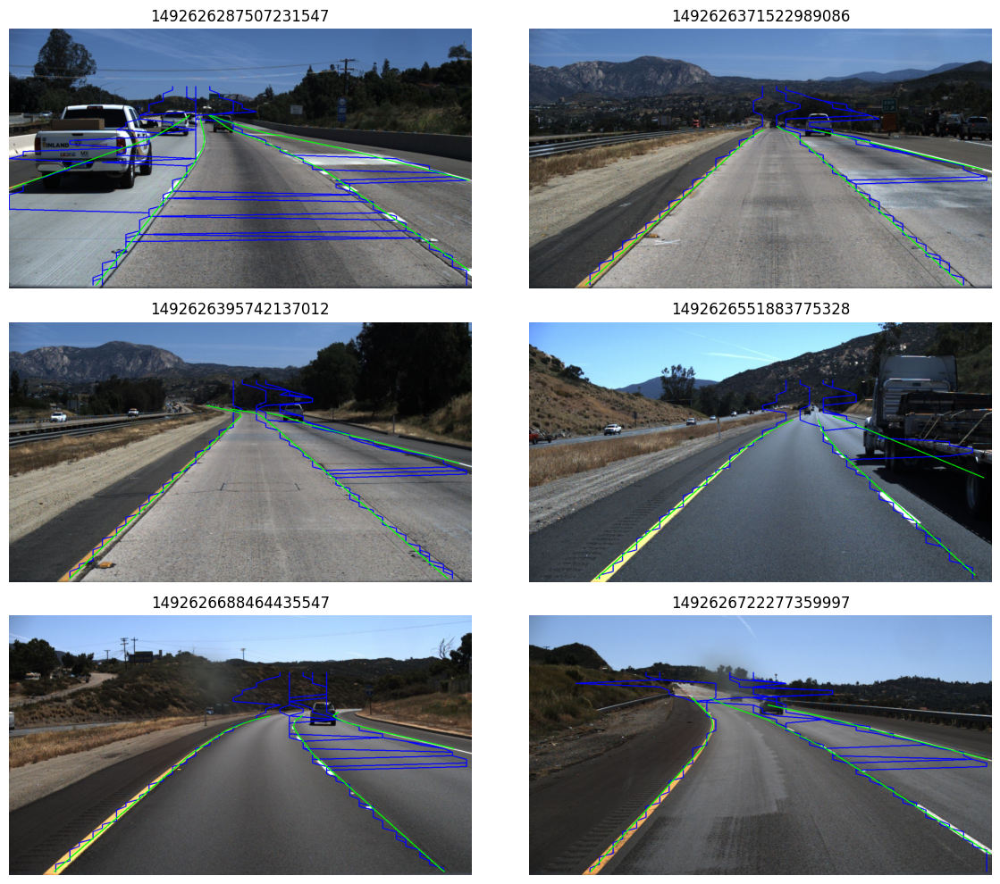

✓ Cell 6A complete (viz rendered).


In [13]:
# ============================================
# Cell 6A: Robust visualization (NaN-safe)
# Reuses `preds_all`, `val_loader`, and CONFIG from Cell 6.
# ============================================

import numpy as np, cv2, matplotlib.pyplot as plt
import json, math

def _safe_int(v):
    try:
        f = float(v)
        if not np.isfinite(f):
            return None
        return int(round(f))
    except Exception:
        return None

def overlay_vis_safe(img, h_samples, lanes_pred=None, lanes_gt=None):
    """
    Draws predicted (red) and GT (green) polylines,
    but skips any point where x or y is invalid.
    """
    out = img.copy()

    # helper to draw a set of lanes with color
    def _draw(lanes, color):
        if lanes is None: 
            return
        for lane in lanes:
            pts = []
            for x, y in zip(lane, h_samples):
                xi = _safe_int(x)
                yi = _safe_int(y)
                if xi is not None and yi is not None:
                    # clamp inside image just in case
                    xi = max(0, min(img.shape[1]-1, xi))
                    yi = max(0, min(img.shape[0]-1, yi))
                    pts.append((xi, yi))
            for i in range(1, len(pts)):
                cv2.line(out, pts[i-1], pts[i], color, 2)

    # Predicted in RED (BGR: (0,0,255))
    _draw(lanes_pred, (0,0,255))
    # GT in GREEN (BGR: (0,255,0))
    _draw(lanes_gt, (0,255,0))
    return out

# ------------------------------
# Render 6 examples from the val set
# ------------------------------
assert 'val_loader' in globals(), "Run Cell 4D/4D first to build val_loader."
dataset = val_loader.dataset
show = 6
shown = 0

# If preds_all isn't present (e.g., rerun kernel), do a quick forward pass
if 'preds_all' not in globals() or not isinstance(preds_all, dict) or len(preds_all)==0:
    print("No preds_all found; doing a quick forward pass on a few val batches...")
    preds_all = {}
    model.eval()
    with torch.no_grad():
        taken = 0
        for batch in val_loader:
            imgs = batch["image"].to(CONFIG["device"], non_blocking=True)
            metas = batch["meta"]
            with torch.cuda.amp.autocast(enabled=(CONFIG["device"]=="cuda")):
                logits = model(imgs)
            # reuse decoder from Cell 6
            p = decode_batch_to_preds(imgs, logits, metas, p_thresh=0.25, min_rows=6)
            preds_all.update(p)
            taken += len(metas)
            if taken >= 96: break

fig = plt.figure(figsize=(12, 10))
i = 0
for idx in range(len(dataset)):
    m = dataset.df.iloc[idx]
    raw_file = m["raw_file"]
    if raw_file not in preds_all:
        continue
    img = cv2.cvtColor(cv2.imread(m["img_path"], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)

    # h_samples and lanes (GT) may contain odd values in rare cases; guard them
    h_s = [(_safe_int(y) if _safe_int(y) is not None else 0) for y in m["h_samples"]]
    lanes_gt = []
    for lane in m["lanes"]:
        lanes_gt.append([_safe_int(x) for x in lane])  # overlay_vis_safe will skip None

    lanes_pred = preds_all[raw_file]["lanes"]

    vis = overlay_vis_safe(img, h_s, lanes_pred, lanes_gt)
    plt.subplot(3,2,i+1); plt.imshow(vis); plt.axis("off"); plt.title(raw_file.split('/')[-2])
    i += 1
    if i >= show: break

plt.tight_layout(); plt.show()
print("✓ Cell 6A complete (viz rendered).")

In [14]:
# ============================================================
# Cell 7: RESA-style Segmentation Model
# - Backbone: ResNet-34 (stride 16) + light FPN decoder to stride 4
# - RESA module: multi-shift aggregation along H and W (torch.roll with learnable gates)
# - Loss: BCEWithLogits + Dice (class-imbalance aware)
# - Decode: connected components -> per-lane traces at TuSimple h_samples
# - Quick training run + validation metrics
# ============================================================

import os, time, math, json
from typing import List, Dict, Optional, Tuple
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler
import cv2

# ---- reuse config, loaders, metrics ----
with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)
device = CONFIG["device"]
H, W = CONFIG["training_resolution"]
MAX_LANES = 5

assert 'train_loader' in globals() and 'val_loader' in globals(), "Please run Cell 4D (or 4D/6) to build loaders."
assert 'evaluate_dataset' in globals(), "Please run Cell 3 to define TuSimple metrics."

# ============================================================
# RESA-like Blocks
# ============================================================
class RESABlock(nn.Module):
    """
    Feature-shift aggregation:
    - Iteratively aggregate features by shifting along rows and columns.
    - Learnable gates per shift distance and direction.
    This is a lightweight approximation of RESA's feature propagation.
    """
    def __init__(self, channels: int, iters: int = 4):
        super().__init__()
        self.channels = channels
        self.iters = iters
        # learnable gates for shifts (vertical & horizontal, both directions)
        self.gate_v = nn.Parameter(torch.zeros(iters))
        self.gate_vn = nn.Parameter(torch.zeros(iters))
        self.gate_h = nn.Parameter(torch.zeros(iters))
        self.gate_hn = nn.Parameter(torch.zeros(iters))
        self.bn = nn.BatchNorm2d(channels)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        B,C,Hf,Wf = x.shape
        out = x
        for i in range(self.iters):
            s = 2**i  # shift step: 1,2,4,8
            # vertical shifts
            up   = torch.roll(x, shifts=-s, dims=2)
            down = torch.roll(x, shifts= s, dims=2)
            # horizontal shifts
            left  = torch.roll(x, shifts=-s, dims=3)
            right = torch.roll(x, shifts= s, dims=3)
            out = out + self.gate_v[i]  * up   + self.gate_vn[i] * down \
                      + self.gate_h[i]  * left + self.gate_hn[i] * right
        out = self.act(self.bn(out))
        return out

# ============================================================
# Backbone + FPN Decoder
# ============================================================
import torchvision
from torchvision.models import resnet34, ResNet34_Weights

class RESANet(nn.Module):
    def __init__(self, num_classes: int = 1, ch: int = 128):
        super().__init__()
        # ResNet34 backbone (no pretrain to avoid downloads)
        m = resnet34(weights=None)
        self.stem = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)  # stride 4
        self.layer1 = m.layer1   # stride 4
        self.layer2 = m.layer2   # stride 8
        self.layer3 = m.layer3   # stride 16
        self.layer4 = m.layer4   # stride 32 (we'll skip to keep res)

        # Reduce channels for FPN
        self.l1 = nn.Conv2d(64,  ch, 1)
        self.l2 = nn.Conv2d(128, ch, 1)
        self.l3 = nn.Conv2d(256, ch, 1)

        # RESA block at stride 16 feature
        self.resa = RESABlock(ch, iters=4)

        # FPN decoder to stride 4
        self.dec2 = nn.Conv2d(ch, ch, 3, padding=1)
        self.dec1 = nn.Conv2d(ch, ch, 3, padding=1)

        self.out = nn.Conv2d(ch, num_classes, 1)

        self.bn = nn.BatchNorm2d(ch)
        self.act = nn.ReLU(inplace=True)

    def forward(self, x):
        # Backbone
        x = self.stem(x)         # [B,64,H/4,W/4]
        c1 = self.layer1(x)      # [B,64,H/4,W/4]
        c2 = self.layer2(c1)     # [B,128,H/8,W/8]
        c3 = self.layer3(c2)     # [B,256,H/16,W/16]

        p3 = self.act(self.bn(self.l3(c3)))         # [B,ch,H/16,W/16]
        p3 = self.resa(p3)

        p2 = self.l2(c2) + F.interpolate(p3, scale_factor=2, mode='bilinear', align_corners=False)  # H/8
        p2 = self.act(self.bn(self.dec2(self.act(self.bn(p2)))))

        p1 = self.l1(c1) + F.interpolate(p2, scale_factor=2, mode='bilinear', align_corners=False)  # H/4
        p1 = self.act(self.bn(self.dec1(self.act(self.bn(p1)))))

        logits = self.out(p1)     # [B,1,H/4,W/4]
        # Upsample to input size
        logits = F.interpolate(logits, scale_factor=4, mode='bilinear', align_corners=False)  # [B,1,H,W]
        return logits

# ============================================================
# Loss: BCEWithLogits + Dice
# ============================================================
class DiceLoss(nn.Module):
    def __init__(self, eps=1e-6):
        super().__init__()
        self.eps = eps
    def forward(self, logits, targets):
        # logits: [B,1,H,W], targets: [B,1,H,W]
        probs = torch.sigmoid(logits)
        num = 2 * (probs*targets).sum(dim=(2,3)) + self.eps
        den = (probs*probs + targets*targets).sum(dim=(2,3)) + self.eps
        dice = 1 - (num/den).mean()
        return dice

bce = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([20.0], device=device))  # lanes are sparse
dice = DiceLoss()

def seg_loss(logits, targets):
    return 0.5 * bce(logits, targets) + 0.5 * dice(logits, targets)

# ============================================================
# Decode segmentation -> TuSimple lanes
# ============================================================
def components_from_mask(mask_bin: np.ndarray) -> List[np.ndarray]:
    """
    Returns list of boolean masks for each connected component.
    mask_bin: (H,W) uint8 {0,1}
    """
    Hm, Wm = mask_bin.shape
    num, lab = cv2.connectedComponents(mask_bin.astype(np.uint8), connectivity=8)
    comps = []
    for i in range(1, num):
        comp = (lab == i)
        # filter tiny blobs
        if comp.sum() >= 150:   # heuristic
            comps.append(comp)
    return comps

def comp_center_x(comp: np.ndarray) -> float:
    ys, xs = np.where(comp)
    if len(xs)==0: return -1e9
    return float(xs.mean())

def decode_seg_to_tusimple(
    logits: torch.Tensor, metas: List[Dict],
    thr: float = 0.35
) -> Dict[str, Dict]:
    """
    Convert B×1×H×W logits to TuSimple predictions per image.
    Steps:
      1) sigmoid->threshold -> binary mask
      2) connected components -> up to MAX_LANES by centroid x (left->right)
      3) for each component and each original h_sample (y_orig): find mask pixels
         at y_resized = round(y_orig * sy); take mean x_resized -> scale back to original x_orig
    """
    preds = {}
    probs = torch.sigmoid(logits).detach().cpu().numpy()  # [B,1,H,W]
    B = probs.shape[0]
    for b in range(B):
        meta = metas[b]
        raw_file = meta["raw_file"]
        h_samples = meta["h_samples_orig"]
        sx = float(meta["scale_xy"][0])
        sy = float(meta["scale_xy"][1])

        pm = probs[b,0]  # [H,W]
        mask_bin = (pm >= thr).astype(np.uint8)
        # clean up a bit
        mask_bin = cv2.morphologyEx(mask_bin, cv2.MORPH_OPEN, np.ones((3,3), np.uint8), iterations=1)

        comps = components_from_mask(mask_bin)
        # sort by center x (left -> right), keep at most MAX_LANES
        comps.sort(key=lambda c: comp_center_x(c))
        comps = comps[:MAX_LANES]

        lanes = []
        for comp in comps:
            ys, xs = np.where(comp)
            lane_x = []
            if len(xs)==0:
                continue
            for y_orig in h_samples:
                y_r = int(round(y_orig * sy))
                # pixels in this row that belong to the component
                cols = xs[ys == y_r]
                if len(cols) == 0:
                    lane_x.append(None)
                else:
                    x_r = int(round(cols.mean()))
                    x_orig = int(round(x_r / sx))
                    lane_x.append(x_orig)
            if any(v is not None for v in lane_x):
                lanes.append(lane_x)

        preds[raw_file] = {
            "h_samples": h_samples,
            "lanes": lanes
        }
    return preds

# ============================================================
# Train / Validate Loop
# ============================================================
model_seg = RESANet().to(device)
if torch.cuda.device_count() > 1 and device == "cuda":
    model_seg = nn.DataParallel(model_seg)

opt = torch.optim.AdamW(model_seg.parameters(), lr=2.5e-4, weight_decay=1e-4)
scaler = GradScaler(enabled=(device=="cuda"))

EPOCHS = 6
best_acc = -1.0
CKPT_SEG = "/kaggle/working/resa_best.pt"

# Build full val GTs from consolidated df (clean parquet)
import pandas as pd, math as pymath
df_all = pd.read_parquet(CONFIG["dataframe_path"])

def build_gt_list(df, split="val"):
    sub = df[df["split"]==split].copy()
    gts=[]
    for _,row in sub.iterrows():
        gts.append({
            "raw_file": row["raw_file"],
            "h_samples": list(map(int, row["h_samples"])),
            "lanes": [[(None if (x is None or (isinstance(x,float) and not pymath.isfinite(x)) or int(x)<0) else int(x))
                       for x in lane] for lane in row["lanes"]],
        })
    return gts

VAL_GTS = build_gt_list(df_all, "val")

def train_one_epoch_seg(epoch:int):
    model_seg.train()
    running = 0.0
    t0 = time.time()
    for step, batch in enumerate(train_loader):
        imgs = batch["image"].to(device, non_blocking=True)
        tgt  = batch["seg_mask"].to(device, non_blocking=True)  # [B,1,H,W]

        opt.zero_grad(set_to_none=True)
        with autocast(enabled=(device=="cuda")):
            logits = model_seg(imgs)  # [B,1,H,W]
            loss = seg_loss(logits, tgt)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model_seg.parameters(), 5.0)
        scaler.step(opt)
        scaler.update()

        running += float(loss.item())
        if (step+1) % 50 == 0:
            print(f"[seg][ep{epoch}] step {step+1:4d}  loss={running/(step+1):.4f}")
    dt = time.time() - t0
    print(f"[seg][ep{epoch}] done in {dt:.1f}s  train_loss={running/max(1,(step+1)):.4f}")

def validate_seg(epoch:int, thr:float=0.35):
    model_seg.eval()
    preds_all = {}
    with torch.no_grad():
        for batch in val_loader:
            imgs = batch["image"].to(device, non_blocking=True)
            metas = batch["meta"]
            with autocast(enabled=(device=="cuda")):
                logits = model_seg(imgs)
            p = decode_seg_to_tusimple(logits, metas, thr=thr)
            preds_all.update(p)
    res = evaluate_dataset(VAL_GTS, preds_all,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    print(f"[seg][ep{epoch}] VAL acc={res['accuracy']:.4f}  F1={res['f1']:.4f}  TP={int(res['TP'])}  FP={int(res['FP'])}  FN={int(res['FN'])}")
    return res

# ---------------- Run quick training ----------------
for ep in range(1, EPOCHS+1):
    train_one_epoch_seg(ep)
    res = validate_seg(ep, thr=0.35)
    if res["accuracy"] > best_acc:
        best_acc = res["accuracy"]
        torch.save({"epoch": ep, "state_dict": model_seg.state_dict(), "acc": best_acc}, CKPT_SEG)
        print(f"  ✓ Saved best → {CKPT_SEG} (acc={best_acc:.4f})")

print(f"RESA-style best VAL accuracy: {best_acc:.4f}")
print("✓ Cell 7 complete.")

/tmp/ipykernel_36/2244736038.py:231: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(device=="cuda"))
/tmp/ipykernel_36/2244736038.py:264: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[seg][ep1] step   50  loss=0.6890
[seg][ep1] step  100  loss=0.6118
[seg][ep1] step  150  loss=0.5623
[seg][ep1] step  200  loss=0.5291
[seg][ep1] done in 114.7s  train_loss=0.5262


/tmp/ipykernel_36/2244736038.py:286: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[seg][ep1] VAL acc=0.2833  F1=0.1111  TP=158  FP=1569  FN=960
  ✓ Saved best → /kaggle/working/resa_best.pt (acc=0.2833)
[seg][ep2] step   50  loss=0.4024
[seg][ep2] step  100  loss=0.3981
[seg][ep2] step  150  loss=0.3920
[seg][ep2] step  200  loss=0.3852
[seg][ep2] done in 112.5s  train_loss=0.3839
[seg][ep2] VAL acc=0.5856  F1=0.2727  TP=360  FP=1162  FN=758
  ✓ Saved best → /kaggle/working/resa_best.pt (acc=0.5856)
[seg][ep3] step   50  loss=0.3535
[seg][ep3] step  100  loss=0.3560
[seg][ep3] step  150  loss=0.3487
[seg][ep3] step  200  loss=0.3455
[seg][ep3] done in 112.7s  train_loss=0.3454
[seg][ep3] VAL acc=0.5884  F1=0.2571  TP=340  FP=1187  FN=778
  ✓ Saved best → /kaggle/working/resa_best.pt (acc=0.5884)
[seg][ep4] step   50  loss=0.3299
[seg][ep4] step  100  loss=0.3284
[seg][ep4] step  150  loss=0.3271
[seg][ep4] step  200  loss=0.3254
[seg][ep4] done in 115.2s  train_loss=0.3246
[seg][ep4] VAL acc=0.4946  F1=0.1886  TP=241  FP=1197  FN=877
[seg][ep5] step   50  loss=0.310

In [15]:
# ============================================================
# Cell 8: Model comparison on TuSimple val (full set)
# - Loads best ckpts for UFLD and RESA
# - Runs full-val inference, evaluates with our TuSimple metrics
# - Reports accuracy, F1/FP/FN, precision/recall, params, throughput
# ============================================================

import os, time, json, math
from typing import Dict, List
import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np

# --- prereqs from earlier cells ---
with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)
device = CONFIG["device"]

assert 'val_loader' in globals(), "Run Cell 4D to build the loaders."
assert 'evaluate_dataset' in globals(), "Run Cell 3 to define the metrics."

# --- small helpers ---
def _strip_module(sd):
    return { (k[7:] if k.startswith("module.") else k): v for k,v in sd.items() }

def _load_ckpt(model, path):
    ck = torch.load(path, map_location="cpu")
    sd = ck.get("state_dict", ck)
    sd = _strip_module(sd)
    missing, unexpected = model.load_state_dict(sd, strict=False)
    if missing:   print(f" [warn] missing keys: {len(missing)}")
    if unexpected:print(f" [warn] unexpected keys: {len(unexpected)}")

# --- rebuild GTs from clean parquet ---
df_all = pd.read_parquet(CONFIG["dataframe_path"])
def build_gt_list(df, split="val"):
    sub = df[df["split"]==split].copy()
    gts=[]
    for _,row in sub.iterrows():
        gts.append({
            "raw_file": row["raw_file"],
            "h_samples": list(map(int, row["h_samples"])),
            "lanes": [[(None if (x is None or (isinstance(x,float) and not math.isfinite(x)) or int(x)<0) else int(x))
                       for x in lane] for lane in row["lanes"]],
        })
    return gts
VAL_GTS = build_gt_list(df_all, "val")

# --- (re)define UFLD & RESA shells (match previous cells) ---
from torchvision.models import resnet34

C_BINS = 100
MAX_LANES = 5
H, W = CONFIG["training_resolution"]

class UFLDNet(torch.nn.Module):
    def __init__(self, num_lanes=MAX_LANES, num_bins=C_BINS, rows=56):
        super().__init__()
        self.num_lanes, self.num_bins, self.rows = num_lanes, num_bins, rows
        m = resnet34(weights=None)
        self.stem = torch.nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1, self.layer2, self.layer3 = m.layer1, m.layer2, m.layer3
        self.head = torch.nn.Sequential(
            torch.nn.Conv2d(256, 128, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(128), torch.nn.ReLU(inplace=True),
            torch.nn.Conv2d(128, 128, 3, padding=1, bias=False),
            torch.nn.BatchNorm2d(128), torch.nn.ReLU(inplace=True),
        )
        self.classifier = torch.nn.Conv2d(128, num_lanes, 1)
    def forward(self, x):
        x = self.stem(x); x = self.layer1(x); x = self.layer2(x); x = self.layer3(x)
        x = self.head(x)
        x = F.adaptive_avg_pool2d(x, (56, self.num_bins))
        return self.classifier(x)  # [B,L,56,C_BINS]

class RESABlock(torch.nn.Module):
    def __init__(self, channels: int, iters: int = 4):
        super().__init__()
        self.iters = iters
        self.gate_v  = torch.nn.Parameter(torch.zeros(iters))
        self.gate_vn = torch.nn.Parameter(torch.zeros(iters))
        self.gate_h  = torch.nn.Parameter(torch.zeros(iters))
        self.gate_hn = torch.nn.Parameter(torch.zeros(iters))
        self.bn = torch.nn.BatchNorm2d(channels)
        self.act = torch.nn.ReLU(inplace=True)
    def forward(self, x):
        out = x
        for i in range(self.iters):
            s = 2**i
            up, down = torch.roll(x,-s,2), torch.roll(x, s,2)
            left, right = torch.roll(x,-s,3), torch.roll(x, s,3)
            out = out + self.gate_v[i]*up + self.gate_vn[i]*down + self.gate_h[i]*left + self.gate_hn[i]*right
        return self.act(self.bn(out))

class RESANet(torch.nn.Module):
    def __init__(self, num_classes: int = 1, ch: int = 128):
        super().__init__()
        m = resnet34(weights=None)
        self.stem = torch.nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
        self.layer1, self.layer2, self.layer3 = m.layer1, m.layer2, m.layer3
        self.l1, self.l2, self.l3 = torch.nn.Conv2d(64,ch,1), torch.nn.Conv2d(128,ch,1), torch.nn.Conv2d(256,ch,1)
        self.resa = RESABlock(ch, iters=4)
        self.dec2 = torch.nn.Conv2d(ch, ch, 3, padding=1)
        self.dec1 = torch.nn.Conv2d(ch, ch, 3, padding=1)
        self.out  = torch.nn.Conv2d(ch, 1, 1)
        self.bn = torch.nn.BatchNorm2d(ch); self.act = torch.nn.ReLU(inplace=True)
    def forward(self, x):
        x = self.stem(x); c1 = self.layer1(x); c2 = self.layer2(c1); c3 = self.layer3(c2)
        p3 = self.act(self.bn(self.l3(c3))); p3 = self.resa(p3)
        p2 = self.l2(c2) + F.interpolate(p3, scale_factor=2, mode='bilinear', align_corners=False)
        p2 = self.act(self.bn(self.dec2(self.act(self.bn(p2)))))
        p1 = self.l1(c1) + F.interpolate(p2, scale_factor=2, mode='bilinear', align_corners=False)
        p1 = self.act(self.bn(self.dec1(self.act(self.bn(p1)))))
        logits = self.out(p1)
        return F.interpolate(logits, scale_factor=4, mode='bilinear', align_corners=False)  # [B,1,H,W]

# --- decoders (reusing logic from earlier cells) ---
def ufld_decode(logits, metas, p_thresh=0.25, min_rows=6):
    B,L,R,C = logits.shape
    probs = logits.softmax(dim=-1)
    preds={}
    for b in range(B):
        meta=metas[b]; raw=meta["raw_file"]; h_rows=meta["h_samples_orig"]; sx=float(meta["scale_xy"][0])
        Rb=min(R,len(h_rows)); lanes=[]
        for l in range(L):
            p = probs[b,l,:Rb,:]
            conf, idx = torch.max(p, dim=-1)
            conf = conf.detach().cpu().numpy(); idx = idx.detach().cpu().numpy()
            keep = (conf>p_thresh).sum()>=min_rows and conf.mean()>=(p_thresh*0.8)
            lane=[]
            for r in range(len(h_rows)):
                if r<Rb and keep:
                    x_res = float(idx[r])/(C-1)*(W-1)
                    lane.append(int(round(x_res/sx)))
                else:
                    lane.append(None)
            if any(v is not None for v in lane): lanes.append(lane)
        preds[raw]={"h_samples":h_rows,"lanes":lanes}
    return preds

def seg_decode(logits, metas, thr=0.35):
    preds={}
    probs = torch.sigmoid(logits).detach().cpu().numpy()
    for b in range(probs.shape[0]):
        meta=metas[b]; raw=meta["raw_file"]; h_rows=meta["h_samples_orig"]; sx=float(meta["scale_xy"][0]); sy=float(meta["scale_xy"][1])
        pm=probs[b,0]; mask=(pm>=thr).astype(np.uint8)
        mask=cv2.morphologyEx(mask, cv2.MORPH_OPEN, np.ones((3,3),np.uint8), iterations=1)
        num, lab = cv2.connectedComponents(mask, connectivity=8)
        comps=[]
        for i in range(1,num):
            comp=(lab==i)
            if comp.sum()>=150: comps.append(comp)
        comps.sort(key=lambda c: np.where(c)[1].mean() if c.any() else -1e9)
        comps=comps[:MAX_LANES]
        lanes=[]
        ys, xs = np.where(mask)
        for comp in comps:
            ys, xs = np.where(comp)
            lane=[]
            for y0 in h_rows:
                y=int(round(y0*sy))
                cols = xs[ys==y]
                if len(cols)==0: lane.append(None)
                else:
                    xr=int(round(cols.mean()))
                    lane.append(int(round(xr/sx)))
            if any(v is not None for v in lane): lanes.append(lane)
        preds[raw]={"h_samples":h_rows,"lanes":lanes}
    return preds

# --- build fresh model instances and load ckpts ---
ufld = UFLDNet().to(device).eval()
resa = RESANet().to(device).eval()

CKPT_UFLD = "/kaggle/working/ufld_best.pt"
CKPT_RESA = "/kaggle/working/resa_best.pt"
if os.path.exists(CKPT_UFLD): _load_ckpt(ufld, CKPT_UFLD)
if os.path.exists(CKPT_RESA): _load_ckpt(resa, CKPT_RESA)

# --- inference & evaluation helper ---
import cv2

@torch.no_grad()
def run_eval(model, kind: str) -> (Dict[str,Dict], Dict[str,float], float, float, float):
    start = time.time()
    preds_all={}
    nimg=0
    t_infer=0.0
    for batch in val_loader:
        imgs = batch["image"].to(device, non_blocking=True)
        metas = batch["meta"]
        t0=time.time()
        with torch.cuda.amp.autocast(enabled=(device=="cuda")):
            logits = model(imgs)
        t_infer += (time.time()-t0)
        if kind=="ufld":
            p = ufld_decode(logits, metas, p_thresh=0.25, min_rows=6)
        else:
            p = seg_decode(logits, metas, thr=0.35)
        preds_all.update(p)
        nimg += len(metas)
    wall = time.time()-start
    imgs_per_s = nimg/max(wall,1e-6)
    pure_infer_ips = nimg/max(t_infer,1e-6)
    res = evaluate_dataset(VAL_GTS, preds_all,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    return preds_all, res, imgs_per_s, pure_infer_ips, sum(p.numel() for p in model.parameters())/1e6

# --- run both ---
preds_ufld, res_ufld, ips_ufld, pips_ufld, params_ufld = run_eval(ufld, "ufld")
preds_resa, res_resa, ips_resa, pips_resa, params_resa = run_eval(resa, "resa")

# --- summarize ---
summary = pd.DataFrame([
    {
        "model":"UFLD (row-anchor)",
        "accuracy":res_ufld["accuracy"], "F1":res_ufld["f1"],
        "precision":res_ufld["precision"], "recall":res_ufld["recall"],
        "TP":int(res_ufld["TP"]), "FP":int(res_ufld["FP"]), "FN":int(res_ufld["FN"]),
        "params_M":round(params_ufld,2),
        "IPS_wall(img/s)":round(ips_ufld,2),
        "IPS_infer_only(img/s)":round(pips_ufld,2),
    },
    {
        "model":"RESA (segmentation)",
        "accuracy":res_resa["accuracy"], "F1":res_resa["f1"],
        "precision":res_resa["precision"], "recall":res_resa["recall"],
        "TP":int(res_resa["TP"]), "FP":int(res_resa["FP"]), "FN":int(res_resa["FN"]),
        "params_M":round(params_resa,2),
        "IPS_wall(img/s)":round(ips_resa,2),
        "IPS_infer_only(img/s)":round(pips_resa,2),
    }
])
print(summary)
summary_path = "/kaggle/working/val_comparison.csv"
summary.to_csv(summary_path, index=False)
print(f"Saved comparison → {summary_path}")

# Keep predictions for later analysis/export if you want
import pickle
with open("/kaggle/working/preds_ufld.pkl","wb") as f: pickle.dump(preds_ufld,f)
with open("/kaggle/working/preds_resa.pkl","wb") as f: pickle.dump(preds_resa,f)
print("✓ Cell 8 complete.")

 [warn] unexpected keys: 42


/tmp/ipykernel_36/1276388885.py:194: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device=="cuda")):


                 model  accuracy        F1  precision    recall   TP    FP  \
0    UFLD (row-anchor)  0.651758  0.159817   0.139073  0.187835  210  1300   
1  RESA (segmentation)  0.588486  0.257089   0.222659  0.304114  340  1187   

    FN  params_M  IPS_wall(img/s)  IPS_infer_only(img/s)  
0  908      8.61            80.04                1827.26  
1  778      8.52            38.50                 644.87  
Saved comparison → /kaggle/working/val_comparison.csv
✓ Cell 8 complete.


In [16]:
# ============================================================
# Cell 9: Detector-style lane model (CLRNet-inspired)
# - Predicts M proposals (more than lanes) with:
#     * per-row x-bin logits  [M, R, C_BINS]
#     * objectness score      [M]
# - Greedy matching of GT lanes to proposals via anchor distance
# - Loss: CE on matched proposals (row-wise bins) + BCE on objectness
# - Decode: threshold by objectness, NMS across similar lanes, top-4
# - Quick multi-epoch train + full-val metrics
# ============================================================

import os, time, math, json
from typing import List, Dict, Tuple, Optional
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler

# ---- reuse config, loaders, metrics ----
with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)
device = CONFIG["device"]
H, W = CONFIG["training_resolution"]
C_BINS = 100
MAX_LANES_GT = 5     # GT lanes per image
ROWS_FIXED = 56      # our head uses 56 rows; we slice to Rb for 48-row images

assert 'train_loader' in globals() and 'val_loader' in globals(), "Please run Cell 4D to build loaders."
assert 'evaluate_dataset' in globals(), "Please run Cell 3 to define TuSimple metrics."

# ------------------------------------------------------------
# Anchors / proposals
# ------------------------------------------------------------
M_PROP = 24  # number of proposals per image ( >= expected lanes )
ANCHOR_IDX = np.linspace(5, C_BINS-6, M_PROP, dtype=int).tolist()  # avoid extreme edges

# For matching: proposal "template" per row is the same bin index (vertical anchor)
# You could extend with sloped templates for better matching later.

# ------------------------------------------------------------
# Model (ResNet-34 backbone + proposal heads)
# ------------------------------------------------------------
from torchvision.models import resnet34

class RowAnchorDetector(nn.Module):
    def __init__(self, num_props=M_PROP, num_bins=C_BINS, rows=ROWS_FIXED, ch=128):
        super().__init__()
        self.num_props, self.num_bins, self.rows = num_props, num_bins, rows
        m = resnet34(weights=None)
        self.stem   = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)  # /4
        self.layer1 = m.layer1  # /4
        self.layer2 = m.layer2  # /8
        self.layer3 = m.layer3  # /16

        self.neck = nn.Sequential(
            nn.Conv2d(256, ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(ch, ch, 3, padding=1, bias=False),
            nn.BatchNorm2d(ch),
            nn.ReLU(inplace=True),
        )

        # Shared pooled grid (R x C)
        self.proj = nn.Conv2d(ch, ch, 1)

        # Heads
        self.head_bins = nn.Conv2d(ch, num_props, 1)     # -> [B,M,R,C] after pooling
        self.head_obj  = nn.Sequential(
            nn.AdaptiveAvgPool2d((rows, 1)),             # [B,ch,R,1]
            nn.Conv2d(ch, ch, 1), nn.ReLU(inplace=True),
            nn.Conv2d(ch, num_props, 1),                 # [B,M,R,1]
        )

    def forward(self, x):
        x = self.stem(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)             # [B,256,Hf,Wf]
        x = self.neck(x)               # [B,ch,Hf,Wf]

        # Pool to (rows, bins)
        grid = F.adaptive_avg_pool2d(self.proj(x), (self.rows, self.num_bins))  # [B,ch,R,C]

        # Per-proposal bin logits
        # Trick: conv over channel dim to produce M "planes", then treat C as the bin axis
        bins_logits = self.head_bins(grid)   # [B,M,R,C_BINS]

        # Objectness per proposal: mean over rows
        obj_map = self.head_obj(x)           # [B,M,R,1]
        obj_logits = obj_map.mean(dim=2).squeeze(-1)  # [B,M]

        return bins_logits, obj_logits

detector = RowAnchorDetector().to(device)
print("Detector params (M):", round(sum(p.numel() for p in detector.parameters())/1e6, 2))

# ------------------------------------------------------------
# Matching GT lanes to proposals (greedy by distance)
# ------------------------------------------------------------
def greedy_assign(gt_bins: torch.Tensor, gt_valid: torch.Tensor, anchors: List[int]) -> Tuple[torch.Tensor, torch.Tensor]:
    """
    gt_bins:   [L_gt, Rb]  int in [0..C-1] or -1 for ignore
    gt_valid:  [L_gt, Rb]  bool
    anchors:   list of length M with anchor bin index (constant across rows)
    Returns:
      assign_idx: [L_gt] long with proposal index matched to each GT lane
      assigned:   set of used proposal indices
    """
    Lgt, Rb = gt_bins.shape
    M = len(anchors)
    # Compute mean abs distance per (lane,proposal) over valid rows
    cost = torch.full((Lgt, M), fill_value=1e9, dtype=torch.float32, device=gt_bins.device)
    for li in range(Lgt):
        mask = gt_valid[li] & (gt_bins[li] >= 0)
        if mask.any():
            # distance to each anchor
            g = gt_bins[li, mask].float().unsqueeze(1)       # [Nv,1]
            a = torch.tensor(anchors, device=g.device).float().unsqueeze(0)  # [1,M]
            d = (g - a).abs().mean(dim=0)                    # [M]
            cost[li] = d
    # Greedy: pick best (li, mj) pairs
    assign_idx = torch.full((Lgt,), fill_value=-1, dtype=torch.long, device=gt_bins.device)
    used = set()
    for _ in range(Lgt):
        # find min cost among remaining lanes/proposals
        min_val = 1e9
        min_pair = (-1, -1)
        for li in range(Lgt):
            if assign_idx[li] != -1: 
                continue
            # among unused props
            for mj in range(M):
                if mj in used: 
                    continue
                v = cost[li, mj].item()
                if v < min_val:
                    min_val = v; min_pair = (li, mj)
        li, mj = min_pair
        if li == -1 or mj == -1: 
            break
        assign_idx[li] = mj
        used.add(mj)
    return assign_idx, used

# ------------------------------------------------------------
# Loss functions
# ------------------------------------------------------------
bce_obj = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([2.0], device=device))

def detector_loss(
    bins_logits: torch.Tensor,   # [B,M,R,C]
    obj_logits: torch.Tensor,    # [B,M]
    target_bins: torch.Tensor,   # [B,L_gt,Rb] int or -1
    target_valid: torch.Tensor,  # [B,L_gt,Rb] bool
    n_rows_list: torch.Tensor    # [B]
) -> torch.Tensor:
    B, M, R, C = bins_logits.shape
    Lgt = target_bins.shape[1]
    loss_ce = torch.tensor(0.0, device=bins_logits.device)
    pos_count = 0

    # objectness targets
    obj_t = torch.zeros((B, M), dtype=torch.float32, device=bins_logits.device)

    for b in range(B):
        Rb = int(n_rows_list[b].item())
        # slice to actual rows
        bins_b = bins_logits[b, :, :Rb, :]          # [M,Rb,C]
        obj_b  = obj_logits[b]                      # [M]
        t_bins = target_bins[b, :, :Rb]             # [Lgt,Rb]
        t_val  = target_valid[b, :, :Rb]            # [Lgt,Rb]

        # Assign proposals to GT lanes
        assign_idx, used = greedy_assign(t_bins, t_val, ANCHOR_IDX)

        # CE for matched proposals
        for li in range(Lgt):
            mj = int(assign_idx[li].item()) if assign_idx[li].item() >= 0 else -1
            if mj < 0: 
                continue
            # collect valid rows
            mask = t_val[li] & (t_bins[li] >= 0)
            if mask.any():
                logits_flat = bins_b[mj][mask]             # [Nv,C]
                target_flat = t_bins[li][mask].long()      # [Nv]
                loss_ce += F.cross_entropy(logits_flat, target_flat, reduction='mean')
                pos_count += 1
                obj_t[b, mj] = 1.0  # positive proposal

        # Unused proposals remain 0 (negatives)

    loss_ce = loss_ce / max(1, pos_count)
    loss_obj = bce_obj(obj_logits, obj_t)
    return loss_ce + 0.5 * loss_obj

# ------------------------------------------------------------
# Decode predictions -> TuSimple format
# ------------------------------------------------------------
def lane_distance_mean(xs1, xs2, h_rows):
    # mean |dx| over rows where both not None
    s, n = 0.0, 0
    for x1, x2 in zip(xs1, xs2):
        if x1 is not None and x2 is not None:
            s += abs(x1 - x2); n += 1
    return 1e9 if n==0 else s / n

def nms_lanes(lanes: List[List[Optional[int]]], scores: List[float], h_rows: List[int], thr: float=20.0, topk: int=4):
    keep = []
    order = np.argsort(scores)[::-1]
    taken = [False]*len(lanes)
    for i in order:
        if taken[i]: 
            continue
        keep.append(i)
        if len(keep) >= topk:
            break
        for j in order:
            if taken[j] or j==i: 
                continue
            d = lane_distance_mean(lanes[i], lanes[j], h_rows)
            if d < thr:
                taken[j] = True
    return keep

@torch.no_grad()
def decode_detector(
    bins_logits: torch.Tensor, obj_logits: torch.Tensor, metas: List[Dict],
    p_obj: float = 0.35
) -> Dict[str, Dict]:
    B, M, R, C = bins_logits.shape
    probs_bins = bins_logits.softmax(dim=-1)      # [B,M,R,C]
    obj = obj_logits.sigmoid()                    # [B,M]
    preds = {}
    for b in range(B):
        meta = metas[b]
        raw_file = meta["raw_file"]
        h_samples = meta["h_samples_orig"]
        sx = float(meta["scale_xy"][0])
        Rb = min(R, len(h_samples))
        lanes, scores = [], []
        for m in range(M):
            score = float(obj[b, m].item())
            if score < p_obj:
                continue
            p = probs_bins[b, m, :Rb, :]                         # [Rb,C]
            conf, idx = torch.max(p, dim=-1)
            conf = conf.detach().cpu().numpy()
            idx  = idx.detach().cpu().numpy()

            # require minimum confident rows
            if (conf > 0.25).sum() < 6:
                continue

            lane_x = []
            for r in range(len(h_samples)):
                if r < Rb:
                    x_res = float(idx[r]) / (C_BINS-1) * (W-1)
                    x_orig = int(round(x_res / sx))
                    lane_x.append(x_orig)
                else:
                    lane_x.append(None)
            lanes.append(lane_x)
            scores.append(score)

        # NMS + top-4
        if len(lanes) > 0:
            keep_idx = nms_lanes(lanes, scores, h_samples, thr=20.0, topk=4)
            lanes = [lanes[i] for i in keep_idx]
        preds[raw_file] = {"h_samples": h_samples, "lanes": lanes}
    return preds

# ------------------------------------------------------------
# Training / Validation
# ------------------------------------------------------------
optimizer = torch.optim.AdamW(detector.parameters(), lr=3e-4, weight_decay=1e-4)
scaler = GradScaler(enabled=(device=="cuda"))

EPOCHS = 6
best_acc = -1.0
CKPT_DET = "/kaggle/working/detector_best.pt"

# Build GT list & easy access to bin targets from loader batches
import pandas as pd
df_all = pd.read_parquet(CONFIG["dataframe_path"])
def build_gt_list(df, split="val"):
    sub = df[df["split"]==split].copy()
    gts=[]
    for _,row in sub.iterrows():
        gts.append({
            "raw_file": row["raw_file"],
            "h_samples": list(map(int, row["h_samples"])),
            "lanes": [[(None if (x is None or (isinstance(x,float) and not math.isfinite(x)) or int(x)<0) else int(x))
                       for x in lane] for lane in row["lanes"]],
        })
    return gts
VAL_GTS = build_gt_list(df_all, "val")

def train_one_epoch_detector(ep:int):
    detector.train()
    running = 0.0
    t0 = time.time()
    for step, batch in enumerate(train_loader):
        imgs = batch["image"].to(device, non_blocking=True)
        cls_t = batch["row_anchor"]["cls"].to(device, non_blocking=True)     # [B,L,Rb]  (-1 ignore)
        val_t = batch["row_anchor"]["valid"].to(device, non_blocking=True)   # [B,L,Rb]  (bool)
        nrows = batch["row_anchor"]["n_rows"].to(device, non_blocking=True)  # [B]

        optimizer.zero_grad(set_to_none=True)
        with autocast(enabled=(device=="cuda")):
            bins_logits, obj_logits = detector(imgs)  # [B,M,56,C], [B,M]
            loss = detector_loss(bins_logits, obj_logits, cls_t, val_t, nrows)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(detector.parameters(), 5.0)
        scaler.step(optimizer)
        scaler.update()

        running += float(loss.item())
        if (step+1) % 50 == 0:
            print(f"[det][ep{ep}] step {step+1:4d}  loss={running/(step+1):.4f}")
    dt = time.time() - t0
    print(f"[det][ep{ep}] done in {dt:.1f}s  train_loss={running/max(1,(step+1)):.4f}")

@torch.no_grad()
def validate_detector(ep:int, p_obj:float=0.35):
    detector.eval()
    preds_all={}
    for batch in val_loader:
        imgs = batch["image"].to(device, non_blocking=True)
        metas = batch["meta"]
        with autocast(enabled=(device=="cuda")):
            bins_logits, obj_logits = detector(imgs)
        p = decode_detector(bins_logits, obj_logits, metas, p_obj=p_obj)
        preds_all.update(p)
    res = evaluate_dataset(VAL_GTS, preds_all,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    print(f"[det][ep{ep}] VAL acc={res['accuracy']:.4f}  F1={res['f1']:.4f}  TP={int(res['TP'])}  FP={int(res['FP'])}  FN={int(res['FN'])}")
    return res

# --------------- Run quick training ---------------
for ep in range(1, EPOCHS+1):
    train_one_epoch_detector(ep)
    res = validate_detector(ep, p_obj=0.35)
    if res["accuracy"] > best_acc:
        best_acc = res["accuracy"]
        torch.save({"epoch": ep, "state_dict": detector.state_dict(), "acc": best_acc}, CKPT_DET)
        print(f"  ✓ Saved best → {CKPT_DET} (acc={best_acc:.4f})")

print(f"Detector-style best VAL accuracy: {best_acc:.4f}")
print("✓ Cell 9 complete.")

Detector params (M): 8.65


/tmp/ipykernel_36/1966474775.py:278: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(device=="cuda"))
/tmp/ipykernel_36/1966474775.py:311: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[det][ep1] step   50  loss=4.4967
[det][ep1] step  100  loss=4.0537
[det][ep1] step  150  loss=3.7163
[det][ep1] step  200  loss=3.4925
[det][ep1] done in 72.0s  train_loss=3.4775


/tmp/ipykernel_36/1966474775.py:333: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[det][ep1] VAL acc=0.3842  F1=0.0361  TP=36  FP=839  FN=1082
  ✓ Saved best → /kaggle/working/detector_best.pt (acc=0.3842)
[det][ep2] step   50  loss=2.6783
[det][ep2] step  100  loss=2.6343
[det][ep2] step  150  loss=2.5647
[det][ep2] step  200  loss=2.5153
[det][ep2] done in 72.2s  train_loss=2.5138
[det][ep2] VAL acc=0.4449  F1=0.0256  TP=30  FP=1197  FN=1088
  ✓ Saved best → /kaggle/working/detector_best.pt (acc=0.4449)
[det][ep3] step   50  loss=2.2824
[det][ep3] step  100  loss=2.3336
[det][ep3] step  150  loss=2.3620
[det][ep3] step  200  loss=2.3806
[det][ep3] done in 70.8s  train_loss=2.3786
[det][ep3] VAL acc=0.5472  F1=0.0566  TP=69  FP=1253  FN=1049
  ✓ Saved best → /kaggle/working/detector_best.pt (acc=0.5472)
[det][ep4] step   50  loss=2.3023
[det][ep4] step  100  loss=2.2855
[det][ep4] step  150  loss=2.2601
[det][ep4] step  200  loss=2.2411
[det][ep4] done in 70.6s  train_loss=2.2383
[det][ep4] VAL acc=0.4976  F1=0.0491  TP=60  FP=1264  FN=1058
[det][ep5] step   50  lo

In [17]:
# ============================================================
# Cell 10: LSTR-style Transformer Regressor
# - CNN backbone (ResNet-34, stride /16) → sequence + pos embeddings
# - Transformer encoder/decoder with L=MAX_LANES learned queries
# - Head predicts per-lane continuous x at 56 rows (normalized 0..1) + existence logit
# - Loss: masked L1 (only where GT valid) + existence BCE
# - Decode: keep confident lanes, sort left→right, export TuSimple format
# ============================================================

import os, time, math, json
from typing import List, Dict, Optional, Tuple
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler
import pandas as pd

# ---------- Reuse config, loaders, metrics ----------
with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)
device = CONFIG["device"]
H, W = CONFIG["training_resolution"]
C_BINS = 100
MAX_LANES = 5
ROWS_FIXED = 56  # predict 56 rows; slice to 48 if needed per sample

assert 'train_loader' in globals() and 'val_loader' in globals(), "Run Cell 4D to build loaders."
assert 'evaluate_dataset' in globals(), "Run Cell 3 to define metrics."

# ============================================================
# Model
# ============================================================
from torchvision.models import resnet34

def _build_positional_embeddings(hf: int, wf: int, d_model: int, device: str):
    """
    Learned 2D positional embeddings (row+col) -> [1, S, d_model], S=hf*wf
    """
    row_embed = nn.Embedding(hf, d_model//2).to(device)
    col_embed = nn.Embedding(wf, d_model//2).to(device)
    nn.init.uniform_(row_embed.weight, -0.02, 0.02)
    nn.init.uniform_(col_embed.weight, -0.02, 0.02)
    return row_embed, col_embed

class LaneTransformer(nn.Module):
    def __init__(self, num_lanes=MAX_LANES, rows=ROWS_FIXED, d_model=256, nhead=8, num_enc=2, num_dec=2):
        super().__init__()
        self.num_lanes = num_lanes
        self.rows = rows
        self.d_model = d_model

        # Backbone: ResNet-34 up to layer3 (/16)
        m = resnet34(weights=None)
        self.stem   = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)  # /4
        self.layer1 = m.layer1  # /4
        self.layer2 = m.layer2  # /8
        self.layer3 = m.layer3  # /16

        self.conv_proj = nn.Conv2d(256, d_model, 1)
        self.row_embed = None
        self.col_embed = None
        self.hf = None
        self.wf = None

        encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=512, batch_first=True)
        decoder_layer = nn.TransformerDecoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=512, batch_first=True)
        self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_enc)
        self.decoder = nn.TransformerDecoder(decoder_layer, num_layers=num_dec)

        # Lane queries
        self.query_embed = nn.Embedding(num_lanes, d_model)
        nn.init.normal_(self.query_embed.weight, std=0.02)

        # Heads
        self.head_x = nn.Sequential(
            nn.Linear(d_model, d_model),
            nn.ReLU(inplace=True),
            nn.Linear(d_model, rows),   # 56 per-lane x (normalized 0..1 after sigmoid)
        )
        self.head_exist = nn.Linear(d_model, 1)

    def _features_to_sequence(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        """
        x: [B, C=256, Hf, Wf] -> proj -> [B, d_model, Hf, Wf] -> flatten [B, S, d_model]
        add learned 2D positional encodings.
        """
        x = self.conv_proj(x)  # [B, d_model, Hf, Wf]
        B, D, Hf, Wf = x.shape
        if (self.row_embed is None) or (self.hf != Hf) or (self.wf != Wf):
            # initialize learnable pos-embeds for this resolution
            self.hf, self.wf = Hf, Wf
            self.row_embed, self.col_embed = _build_positional_embeddings(Hf, Wf, self.d_model, x.device)

        # Flatten to [B, S, D]
        seq = x.flatten(2).transpose(1, 2)  # [B, S=Hf*Wf, D]

        # Positional encoding
        ys = torch.arange(Hf, device=x.device).unsqueeze(1).repeat(1, Wf)  # [Hf,Wf]
        xs = torch.arange(Wf, device=x.device).unsqueeze(0).repeat(Hf, 1)  # [Hf,Wf]
        pos = torch.cat([self.row_embed(ys), self.col_embed(xs)], dim=-1)  # [Hf,Wf,D]
        pos = pos.view(1, Hf*Wf, self.d_model).expand(B, -1, -1)           # [B,S,D]

        return seq, pos  # both [B,S,D]

    def forward(self, img: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        # CNN features
        x = self.stem(img)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)              # [B,256,Hf,Wf]

        seq, pos = self._features_to_sequence(x)  # [B,S,D], [B,S,D]
        mem = self.encoder(seq + pos)             # [B,S,D]

        # Lane queries
        q = self.query_embed.weight.unsqueeze(0).expand(img.size(0), -1, -1)  # [B,L,D]
        tgt = torch.zeros_like(q)                                             # [B,L,D]
        hs = self.decoder(tgt + q, mem)                                       # [B,L,D]

        # Heads
        x_norm = torch.sigmoid(self.head_x(hs))        # [B,L,56] in 0..1 (resized width)
        exist_logit = self.head_exist(hs).squeeze(-1)  # [B,L]
        return x_norm, exist_logit

lstr = LaneTransformer().to(device)
print("LSTR params (M):", round(sum(p.numel() for p in lstr.parameters())/1e6, 2))

# ============================================================
# Losses
# ============================================================
bce_exist = nn.BCEWithLogitsLoss()

def build_targets_from_rowanchors(cls_bins: torch.Tensor, valid: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
    """
    cls_bins: [B, L, Rb]  (-1 for invalid)
    valid:    [B, L, Rb]  (bool)
    Returns:
      x_norm_tgt: [B, L, Rb] in 0..1  (bins mapped to [0,1])
      exist_tgt : [B, L]  (1 if lane has >=8 valid rows)
    """
    B, L, Rb = cls_bins.shape
    # Map bins -> [0,1]
    bins_clamped = torch.clamp(cls_bins.float(), 0, C_BINS-1)
    x_norm = bins_clamped / (C_BINS - 1)                   # [B,L,Rb]
    x_norm = torch.where(valid, x_norm, torch.zeros_like(x_norm))  # fill invalid with 0 (masked by valid later)

    # Existence target
    exist = (valid.sum(dim=2) >= 8).float()  # [B,L]
    return x_norm, exist

def l1_masked(pred_x_norm: torch.Tensor, tgt_x_norm: torch.Tensor, valid: torch.Tensor) -> torch.Tensor:
    """
    pred_x_norm: [B, L, R]  (we'll slice to Rb)
    tgt_x_norm : [B, L, Rb]
    valid      : [B, L, Rb] (bool)
    """
    B, L, Rb = tgt_x_norm.shape
    pred = pred_x_norm[:, :, :Rb]                   # slice model's 56 to actual Rb
    diff = (pred - tgt_x_norm).abs()
    mask = valid.float()
    num = mask.sum().clamp_min(1.0)
    return (diff * mask).sum() / num

# ============================================================
# Training / Validation
# ============================================================
opt = torch.optim.AdamW(lstr.parameters(), lr=3e-4, weight_decay=1e-4)
scaler = GradScaler(enabled=(device=="cuda"))

EPOCHS = 8
best_acc = -1.0
CKPT_LSTR = "/kaggle/working/lstr_best.pt"

# Build full val GTs from consolidated df (clean parquet)
df_all = pd.read_parquet(CONFIG["dataframe_path"])
def build_gt_list(df, split="val"):
    sub = df[df["split"]==split].copy()
    gts=[]
    for _,row in sub.iterrows():
        gts.append({
            "raw_file": row["raw_file"],
            "h_samples": list(map(int, row["h_samples"])),
            "lanes": [[(None if (x is None or (isinstance(x,float) and not math.isfinite(x)) or int(x)<0) else int(x))
                       for x in lane] for lane in row["lanes"]],
        })
    return gts
VAL_GTS = build_gt_list(df_all, "val")

@torch.no_grad()
def decode_lstr(x_norm: torch.Tensor, exist_logit: torch.Tensor, metas: List[Dict],
                p_exist: float = 0.5) -> Dict[str, Dict]:
    """
    x_norm: [B,L,56] in 0..1 (resized width), exist_logit: [B,L]
    Output per image: up to MAX_LANES lanes, sorted left->right by mean x.
    """
    preds = {}
    B, L, R = x_norm.shape
    exist = torch.sigmoid(exist_logit)  # [B,L]
    for b in range(B):
        meta = metas[b]
        raw = meta["raw_file"]
        h_rows = meta["h_samples_orig"]
        sx = float(meta["scale_xy"][0])
        Rb = min(R, len(h_rows))

        lanes = []
        scores = []
        for l in range(L):
            if float(exist[b, l]) < p_exist:
                continue
            xs_resized = (x_norm[b, l, :Rb].detach().cpu().numpy()) * (W - 1)  # 0..W-1
            # Convert to original x by dividing by sx
            lane = [int(round(xr / sx)) for xr in xs_resized]
            # pad to full length with None
            if len(h_rows) > Rb:
                lane += [None] * (len(h_rows) - Rb)
            lanes.append(lane)
            scores.append(float(exist[b, l]))

        # sort lanes by mean x (left->right), keep top-4
        if len(lanes) > 0:
            meanx = [np.nan_to_num(np.mean([v for v in lane if v is not None]), nan=1e9) for lane in lanes]
            order = np.argsort(meanx)
            lanes = [lanes[i] for i in order[:4]]

        preds[raw] = {"h_samples": h_rows, "lanes": lanes}
    return preds

def train_one_epoch_lstr(ep:int):
    lstr.train()
    running = 0.0
    t0 = time.time()
    for step, batch in enumerate(train_loader):
        imgs  = batch["image"].to(device, non_blocking=True)
        cls_t = batch["row_anchor"]["cls"].to(device, non_blocking=True)    # [B,L,Rb]
        val_t = batch["row_anchor"]["valid"].to(device, non_blocking=True)  # [B,L,Rb]

        # targets from bins
        x_t, exist_t = build_targets_from_rowanchors(cls_t, val_t)          # [B,L,Rb], [B,L]

        opt.zero_grad(set_to_none=True)
        with autocast(enabled=(device=="cuda")):
            x_norm, exist_logit = lstr(imgs)                                 # [B,L,56], [B,L]
            loss_l1  = l1_masked(x_norm, x_t, val_t)
            loss_obj = bce_exist(exist_logit, exist_t)
            loss = loss_l1 + 0.5 * loss_obj

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(lstr.parameters(), 5.0)
        scaler.step(opt)
        scaler.update()

        running += float(loss.item())
        if (step+1) % 50 == 0:
            print(f"[lstr][ep{ep}] step {step+1:4d}  loss={running/(step+1):.4f}")
    dt = time.time() - t0
    print(f"[lstr][ep{ep}] done in {dt:.1f}s  train_loss={running/max(1,(step+1)):.4f}")

@torch.no_grad()
def validate_lstr(ep:int, p_exist: float = 0.5):
    lstr.eval()
    preds_all={}
    for batch in val_loader:
        imgs  = batch["image"].to(device, non_blocking=True)
        metas = batch["meta"]
        with autocast(enabled=(device=="cuda")):
            x_norm, exist_logit = lstr(imgs)
        p = decode_lstr(x_norm, exist_logit, metas, p_exist=p_exist)
        preds_all.update(p)
    res = evaluate_dataset(VAL_GTS, preds_all,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    print(f"[lstr][ep{ep}] VAL acc={res['accuracy']:.4f}  F1={res['f1']:.4f}  TP={int(res['TP'])}  FP={int(res['FP'])}  FN={int(res['FN'])}")
    return res

# --------------- Run quick training ---------------
best_acc = -1.0
for ep in range(1, EPOCHS+1):
    train_one_epoch_lstr(ep)
    res = validate_lstr(ep, p_exist=0.5)
    if res["accuracy"] > best_acc:
        best_acc = res["accuracy"]
        torch.save({"epoch": ep, "state_dict": lstr.state_dict(), "acc": best_acc}, CKPT_LSTR)
        print(f"  ✓ Saved best → {CKPT_LSTR} (acc={best_acc:.4f})")

print(f"LSTR-style best VAL accuracy: {best_acc:.4f}")
print("✓ Cell 10 complete.")

LSTR params (M): 10.95


/tmp/ipykernel_36/3629835701.py:169: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler(enabled=(device=="cuda"))
/tmp/ipykernel_36/3629835701.py:243: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[lstr][ep1] step   50  loss=0.2435
[lstr][ep1] step  100  loss=0.1956
[lstr][ep1] step  150  loss=0.1778
[lstr][ep1] step  200  loss=0.1643
[lstr][ep1] done in 47.2s  train_loss=0.1636


/tmp/ipykernel_36/3629835701.py:267: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


[lstr][ep1] VAL acc=0.1327  F1=0.0000  TP=0  FP=1219  FN=1118
  ✓ Saved best → /kaggle/working/lstr_best.pt (acc=0.1327)
[lstr][ep2] step   50  loss=0.1132
[lstr][ep2] step  100  loss=0.1099
[lstr][ep2] step  150  loss=0.1121
[lstr][ep2] step  200  loss=0.1099
[lstr][ep2] done in 48.1s  train_loss=0.1094
[lstr][ep2] VAL acc=0.1331  F1=0.0000  TP=0  FP=1246  FN=1118
  ✓ Saved best → /kaggle/working/lstr_best.pt (acc=0.1331)
[lstr][ep3] step   50  loss=0.1009
[lstr][ep3] step  100  loss=0.0987
[lstr][ep3] step  150  loss=0.0987
[lstr][ep3] step  200  loss=0.0992
[lstr][ep3] done in 46.2s  train_loss=0.0995
[lstr][ep3] VAL acc=0.1842  F1=0.0000  TP=0  FP=1257  FN=1118
  ✓ Saved best → /kaggle/working/lstr_best.pt (acc=0.1842)
[lstr][ep4] step   50  loss=0.0999
[lstr][ep4] step  100  loss=0.1002
[lstr][ep4] step  150  loss=0.0989
[lstr][ep4] step  200  loss=0.0989
[lstr][ep4] done in 46.3s  train_loss=0.0986
[lstr][ep4] VAL acc=0.1613  F1=0.0000  TP=0  FP=1216  FN=1118
[lstr][ep5] step   5

In [18]:
# # ============================================================
# # Cell 11: Tune + Compare + (Optional) Train-Long for 4 models
# # - Stronger decoders (thresholds + NMS + smoothing)
# # - Full validation comparison table
# # - Optional "train-long" continuation with checkpoints
# # ============================================================

# import os, time, math, json, numpy as np, pandas as pd, cv2, torch
# import torch.nn as nn
# import torch.nn.functional as F
# from torch.cuda.amp import autocast, GradScaler

# # ---------------- Config toggles ----------------
# RUN_TUNE        = True     # keep True
# RUN_COMPARE     = True     # keep True
# RUN_TRAIN_LONG  = True     # True = continue training each model a bit

# # How many more epochs to train (fast defaults; raise if you have time)
# LONG_EPOCHS = {
#     "ufld": 4,       # +4 epochs
#     "resa": 4,
#     "det":  4,
#     "lstr": 6,
# }

# # Decoder thresholds (feel free to tighten more)
# TUNE = {
#     "ufld": {"p_thresh": 0.45, "min_rows": 8,  "nms_thr": 22.0, "topk": 4, "smooth": 3},
#     "resa": {"prob_thr": 0.50, "min_area": 350, "open": 1, "close": 1, "topk": 4},
#     "det":  {"p_obj": 0.50,   "row_conf": 0.35, "min_rows": 8, "nms_thr": 25.0, "topk": 4},
#     "lstr": {"p_exist": 0.60, "smooth": 3, "topk": 4},
# }

# # ---------------- Environment reuse ----------------
# with open("/kaggle/working/config_tusimple.json","r") as f:
#     CONFIG = json.load(f)

# assert 'evaluate_dataset' in globals(), "Please run Cell 3 before this."
# assert 'train_loader' in globals() and 'val_loader' in globals(), "Please run Cell 4D before this."

# device = CONFIG["device"]
# H, W = CONFIG["training_resolution"]
# C_BINS = 100
# MAX_LANES = 5
# ROWS_FIXED = 56

# # Consolidated val GT
# df_all = pd.read_parquet(CONFIG["dataframe_path"])
# def build_gt_list(df, split="val"):
#     sub = df[df["split"]==split].copy()
#     gts=[]
#     for _,row in sub.iterrows():
#         gts.append({
#             "raw_file": row["raw_file"],
#             "h_samples": list(map(int, row["h_samples"])),
#             "lanes": [[(None if (x is None or (isinstance(x,float) and not math.isfinite(x)) or int(x)<0) else int(x))
#                        for x in lane] for lane in row["lanes"]],
#         })
#     return gts
# VAL_GTS = build_gt_list(df_all, "val")

# # ---------------- Utility: lane NMS + smoothing ----------------
# def _median_smooth(xs, k=3):
#     if k <= 1 or xs is None: return xs
#     from collections import deque
#     out=[]; dq=deque()
#     for i, v in enumerate(xs):
#         dq.append(v)
#         if len(dq)>k: dq.popleft()
#         vals=[t for t in dq if t is not None]
#         out.append(int(np.median(vals)) if len(vals)>0 else None)
#     return out

# def lane_distance_mean(xs1, xs2):
#     s, n = 0.0, 0
#     for a, b in zip(xs1, xs2):
#         if a is not None and b is not None:
#             s += abs(a-b); n += 1
#     return 1e9 if n==0 else s/n

# def nms_lanes(lanes, scores, thr=20.0, topk=4):
#     if len(lanes)==0: return []
#     order = np.argsort(scores)[::-1]
#     keep=[]; suppressed=[False]*len(lanes)
#     for i in order:
#         if suppressed[i]: continue
#         keep.append(i)
#         if len(keep)>=topk: break
#         for j in order:
#             if suppressed[j] or j==i: continue
#             if lane_distance_mean(lanes[i], lanes[j]) < thr:
#                 suppressed[j]=True
#     return [lanes[i] for i in keep]

# # ---------------- Model shells (re-define if needed) ----------------
# from torchvision.models import resnet34

# class UFLDNet(nn.Module):
#     def __init__(self, num_lanes=MAX_LANES, num_bins=C_BINS, rows=ROWS_FIXED):
#         super().__init__()
#         m = resnet34(weights=None)
#         self.stem = nn.Sequential(m.conv1, m.bn1, m.relu, m.maxpool)
#         self.layer1, self.layer2, self.layer3 = m.layer1, m.layer2, m.layer3
#         self.head = nn.Sequential(
#             nn.Conv2d(256,128,3,padding=1,bias=False), nn.BatchNorm2d(128), nn.ReLU(True),
#             nn.Conv2d(128,128,3,padding=1,bias=False), nn.BatchNorm2d(128), nn.ReLU(True),
#         )
#         self.classifier = nn.Conv2d(128, num_lanes, 1)
#         self.rows, self.num_bins = rows, num_bins
#     def forward(self, x):
#         x=self.stem(x); x=self.layer1(x); x=self.layer2(x); x=self.layer3(x)
#         x=self.head(x)
#         x=F.adaptive_avg_pool2d(x, (self.rows, self.num_bins))
#         return self.classifier(x)  # [B,L,56,C]

# class RESABlock(nn.Module):
#     def __init__(self, ch=128, iters=4):
#         super().__init__(); self.iters=iters
#         self.gate_v=nn.Parameter(torch.zeros(iters)); self.gate_vn=nn.Parameter(torch.zeros(iters))
#         self.gate_h=nn.Parameter(torch.zeros(iters)); self.gate_hn=nn.Parameter(torch.zeros(iters))
#         self.bn=nn.BatchNorm2d(ch); self.act=nn.ReLU(True)
#     def forward(self,x):
#         out=x
#         for i in range(self.iters):
#             s=2**i
#             out = out + self.gate_v[i]*torch.roll(x,-s,2) + self.gate_vn[i]*torch.roll(x, s,2) \
#                       + self.gate_h[i]*torch.roll(x,-s,3) + self.gate_hn[i]*torch.roll(x, s,3)
#         return self.act(self.bn(out))

# class RESANet(nn.Module):
#     def __init__(self, ch=128):
#         super().__init__()
#         m=resnet34(weights=None)
#         self.stem=nn.Sequential(m.conv1,m.bn1,m.relu,m.maxpool)
#         self.layer1, self.layer2, self.layer3 = m.layer1,m.layer2,m.layer3
#         self.l1, self.l2, self.l3 = nn.Conv2d(64,ch,1), nn.Conv2d(128,ch,1), nn.Conv2d(256,ch,1)
#         self.resa=RESABlock(ch)
#         self.dec2=nn.Conv2d(ch,ch,3,padding=1); self.dec1=nn.Conv2d(ch,ch,3,padding=1)
#         self.out=nn.Conv2d(ch,1,1); self.bn=nn.BatchNorm2d(ch); self.act=nn.ReLU(True)
#     def forward(self,x):
#         x=self.stem(x); c1=self.layer1(x); c2=self.layer2(c1); c3=self.layer3(c2)
#         p3=self.act(self.bn(self.l3(c3))); p3=self.resa(p3)
#         p2=self.l2(c2) + F.interpolate(p3, scale_factor=2, mode='bilinear', align_corners=False)
#         p2=self.act(self.bn(self.dec2(self.act(self.bn(p2)))))
#         p1=self.l1(c1) + F.interpolate(p2, scale_factor=2, mode='bilinear', align_corners=False)
#         p1=self.act(self.bn(self.dec1(self.act(self.bn(p1)))))
#         logit=self.out(p1)
#         return F.interpolate(logit, scale_factor=4, mode='bilinear', align_corners=False)

# M_PROP = 24
# class RowAnchorDetector(nn.Module):
#     def __init__(self, num_props=M_PROP, num_bins=C_BINS, rows=ROWS_FIXED, ch=128):
#         super().__init__()
#         m=resnet34(weights=None)
#         self.stem=nn.Sequential(m.conv1,m.bn1,m.relu,m.maxpool)
#         self.layer1, self.layer2, self.layer3 = m.layer1,m.layer2,m.layer3
#         self.neck=nn.Sequential(nn.Conv2d(256,ch,3,padding=1,bias=False), nn.BatchNorm2d(ch), nn.ReLU(True),
#                                 nn.Conv2d(ch,ch,3,padding=1,bias=False), nn.BatchNorm2d(ch), nn.ReLU(True))
#         self.proj=nn.Conv2d(ch,ch,1)
#         self.head_bins=nn.Conv2d(ch, num_props, 1)
#         self.head_obj = nn.Sequential(nn.AdaptiveAvgPool2d((rows,1)),
#                                       nn.Conv2d(ch,ch,1), nn.ReLU(True), nn.Conv2d(ch, num_props,1))
#         self.rows, self.num_bins, self.num_props = rows, num_bins, num_props
#     def forward(self,x):
#         x=self.stem(x); x=self.layer1(x); x=self.layer2(x); x=self.layer3(x)
#         x=self.neck(x)
#         grid=F.adaptive_avg_pool2d(self.proj(x),(self.rows, self.num_bins))  # [B,ch,R,C]
#         bins=self.head_bins(grid)      # [B,M,R,C]
#         obj = self.head_obj(x).mean(dim=2).squeeze(-1)  # [B,M]
#         return bins, obj

# # LSTR
# class LaneTransformer(nn.Module):
#     def __init__(self, num_lanes=MAX_LANES, rows=ROWS_FIXED, d_model=256, nhead=8, num_enc=2, num_dec=2):
#         super().__init__()
#         m=resnet34(weights=None)
#         self.stem=nn.Sequential(m.conv1,m.bn1,m.relu,m.maxpool); self.layer1, self.layer2, self.layer3 = m.layer1,m.layer2,m.layer3
#         self.conv_proj=nn.Conv2d(256,d_model,1)
#         self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=512, batch_first=True), num_layers=num_enc)
#         self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=d_model, nhead=nhead, dim_feedforward=512, batch_first=True), num_layers=num_dec)
#         self.query_embed = nn.Embedding(num_lanes, d_model)
#         self.head_x = nn.Sequential(nn.Linear(d_model,d_model), nn.ReLU(True), nn.Linear(d_model, rows))
#         self.head_exist = nn.Linear(d_model,1)
#         self.rows, self.d_model = rows, d_model
#         self.row_embed = None; self.col_embed=None; self.hf=None; self.wf=None
#     def _pos(self, x):
#         B,D,Hf,Wf=x.shape
#         if self.row_embed is None or self.hf!=Hf or self.wf!=Wf:
#             self.hf, self.wf = Hf, Wf
#             self.row_embed = nn.Embedding(Hf, self.d_model//2).to(x.device)
#             self.col_embed = nn.Embedding(Wf, self.d_model//2).to(x.device)
#             nn.init.uniform_(self.row_embed.weight, -0.02, 0.02)
#             nn.init.uniform_(self.col_embed.weight, -0.02, 0.02)
#         ys=torch.arange(Hf,device=x.device).unsqueeze(1).repeat(1,Wf)
#         xs=torch.arange(Wf,device=x.device).unsqueeze(0).repeat(Hf,1)
#         pos=torch.cat([self.row_embed(ys), self.col_embed(xs)], dim=-1).view(1,Hf*Wf,self.d_model).expand(B,-1,-1)
#         return pos
#     def forward(self, img):
#         x=self.stem(img); x=self.layer1(x); x=self.layer2(x); x=self.layer3(x)        # [B,256,Hf,Wf]
#         x=self.conv_proj(x); seq=x.flatten(2).transpose(1,2)                           # [B,S,D]
#         mem=self.encoder(seq + self._pos(x))
#         q=self.query_embed.weight.unsqueeze(0).expand(img.size(0), -1, -1)             # [B,L,D]
#         tgt=torch.zeros_like(q)
#         hs=self.decoder(tgt+q, mem)                                                    # [B,L,D]
#         x_norm=torch.sigmoid(self.head_x(hs))                                          # [B,L,56]
#         exist=self.head_exist(hs).squeeze(-1)                                          # [B,L]
#         return x_norm, exist

# # ---------------- Losses used in training-long ----------------
# def masked_ce_loss(logits, target_cls, valid_mask):
#     B,L,R,C = logits.shape
#     Rb = target_cls.shape[2]
#     logits = logits[:, :, :Rb, :]
#     logits_flat = logits.reshape(B*L*Rb, C)
#     target_flat = target_cls.reshape(B*L*Rb)
#     mask_flat   = valid_mask.reshape(B*L*Rb)
#     idx = mask_flat & (target_flat >= 0)
#     if idx.sum() == 0: return logits.sum()*0.0
#     return F.cross_entropy(logits_flat[idx], target_flat[idx], reduction='mean')

# bce_seg = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([20.0], device=device))
# class DiceLoss(nn.Module):
#     def __init__(self, eps=1e-6): super().__init__(); self.eps=eps
#     def forward(self, logits, targets):
#         p=torch.sigmoid(logits); num=2*(p*targets).sum(dim=(2,3))+self.eps
#         den=(p*p+targets*targets).sum(dim=(2,3))+self.eps
#         return 1-(num/den).mean()
# def seg_loss(logits, targets):
#     return 0.5*bce_seg(logits, targets) + 0.5*DiceLoss().to(device)(logits, targets)

# bce_obj = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([2.0], device=device))
# ANCHOR_IDX = np.linspace(5, C_BINS-6, M_PROP, dtype=int).tolist()
# def greedy_assign(gt_bins, gt_valid, anchors):
#     Lgt,Rb = gt_bins.shape; M=len(anchors)
#     cost=torch.full((Lgt,M),1e9,device=gt_bins.device)
#     for li in range(Lgt):
#         mask=gt_valid[li] & (gt_bins[li]>=0)
#         if mask.any():
#             g=gt_bins[li,mask].float().unsqueeze(1)
#             a=torch.tensor(anchors,device=g.device).float().unsqueeze(0)
#             cost[li]=(g-a).abs().mean(dim=0)
#     assign_idx=torch.full((Lgt,),-1, dtype=torch.long, device=gt_bins.device)
#     used=set()
#     for _ in range(Lgt):
#         minv=1e9; pair=(-1,-1)
#         for li in range(Lgt):
#             if assign_idx[li]!=-1: continue
#             for mj in range(M):
#                 if mj in used: continue
#                 v=cost[li,mj].item()
#                 if v<minv: minv=v; pair=(li,mj)
#         li,mj=pair
#         if li==-1 or mj==-1: break
#         assign_idx[li]=mj; used.add(mj)
#     return assign_idx, used

# def detector_loss(bins_logits, obj_logits, target_bins, target_valid, n_rows_list):
#     B,M,R,C = bins_logits.shape; Lgt = target_bins.shape[1]
#     loss_ce = torch.tensor(0.0, device=bins_logits.device); pos=0
#     obj_t = torch.zeros((B,M), device=bins_logits.device)
#     for b in range(B):
#         Rb=int(n_rows_list[b]); bins_b=bins_logits[b,:,:Rb,:]; t_bins=target_bins[b,:,:Rb]; t_val=target_valid[b,:,:Rb]
#         assign_idx, _ = greedy_assign(t_bins, t_val, ANCHOR_IDX)
#         for li in range(Lgt):
#             mj=int(assign_idx[li].item()) if assign_idx[li].item()>=0 else -1
#             if mj<0: continue
#             mask=t_val[li] & (t_bins[li]>=0)
#             if mask.any():
#                 logits_flat=bins_b[mj][mask]; target_flat=t_bins[li][mask].long()
#                 loss_ce += F.cross_entropy(logits_flat, target_flat, reduction='mean'); pos+=1
#                 obj_t[b,mj]=1.0
#     loss_ce = loss_ce/max(1,pos)
#     loss_obj = bce_obj(obj_logits, obj_t)
#     return loss_ce + 0.5*loss_obj

# bce_exist = nn.BCEWithLogitsLoss()
# def build_targets_from_rowanchors(cls_bins, valid):
#     B,L,Rb = cls_bins.shape
#     bins_clamped = torch.clamp(cls_bins.float(), 0, C_BINS-1)
#     x_norm = bins_clamped/(C_BINS-1)
#     x_norm = torch.where(valid, x_norm, torch.zeros_like(x_norm))
#     exist  = (valid.sum(dim=2)>=8).float()
#     return x_norm, exist
# def l1_masked(pred_x_norm, tgt_x_norm, valid):
#     B,L,Rb = tgt_x_norm.shape
#     pred = pred_x_norm[:,:,:Rb]
#     diff=(pred-tgt_x_norm).abs(); mask=valid.float(); num=mask.sum().clamp_min(1.0)
#     return (diff*mask).sum()/num

# # ---------------- Tuned decoders ----------------
# def decode_ufld_tuned(logits, metas, p=0.45, min_rows=8, nms_thr=22.0, topk=4, smooth=3):
#     B,L,R,C = logits.shape; probs=logits.softmax(-1); out={}
#     for b in range(B):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); Rb=min(R,len(h))
#         lanes=[]; scores=[]
#         for l in range(L):
#             p_l=probs[b,l,:Rb,:]; conf, idx = torch.max(p_l, -1)
#             conf=conf.detach().cpu().numpy(); idx=idx.detach().cpu().numpy()
#             keep = (conf>p).sum()>=min_rows and conf.mean()>=p*0.9
#             if not keep: continue
#             lane=[]
#             for r in range(len(h)):
#                 if r<Rb:
#                     x_res = float(idx[r])/(C_BINS-1)*(W-1)
#                     lane.append(int(round(x_res/sx)))
#                 else:
#                     lane.append(None)
#             if smooth>1: lane=_median_smooth(lane, k=smooth)
#             lanes.append(lane); scores.append(float(conf.mean()))
#         out[raw]={"h_samples":h, "lanes": nms_lanes(lanes, scores, thr=nms_thr, topk=topk)}
#     return out

# def decode_resa_tuned(logits, metas, prob_thr=0.50, min_area=350, open_iter=1, close_iter=1, topk=4):
#     probs=torch.sigmoid(logits).detach().cpu().numpy(); out={}
#     for b in range(probs.shape[0]):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); sy=float(m["scale_xy"][1])
#         pm=probs[b,0]; mask=(pm>=prob_thr).astype(np.uint8)
#         if open_iter>0: mask=cv2.morphologyEx(mask, cv2.MORPH_OPEN, np.ones((3,3),np.uint8), iterations=open_iter)
#         if close_iter>0: mask=cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5,5),np.uint8), iterations=close_iter)
#         num,lab=cv2.connectedComponents(mask, connectivity=8)
#         comps=[]
#         for i in range(1,num):
#             comp=(lab==i)
#             if comp.sum()>=min_area: comps.append(comp)
#         if len(comps)==0: out[raw]={"h_samples":h,"lanes":[]}; continue
#         comps.sort(key=lambda c: np.where(c)[1].mean() if c.any() else -1e9)
#         lanes=[]; scores=[]
#         for comp in comps[:max(10, topk*2)]:
#             ys,xs=np.where(comp); lane=[]
#             for y0 in h:
#                 y=int(round(y0*sy))
#                 cols=xs[ys==y]
#                 if len(cols)==0: lane.append(None)
#                 else:
#                     xr=int(round(cols.mean()))
#                     lane.append(int(round(xr/sx)))
#             if any(v is not None for v in lane):
#                 lanes.append(_median_smooth(lane,k=3)); scores.append(float(comp.sum()))
#         out[raw]={"h_samples":h,"lanes": nms_lanes(lanes, scores, thr=20.0, topk=topk)}
#     return out

# def decode_detector_tuned(bins_logits, obj_logits, metas, p_obj=0.50, row_conf=0.35, min_rows=8, nms_thr=25.0, topk=4):
#     B,M,R,C = bins_logits.shape; probs=bins_logits.softmax(-1); obj=obj_logits.sigmoid()
#     out={}
#     for b in range(B):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); Rb=min(R,len(h))
#         lanes=[]; scores=[]
#         for m_idx in range(M):
#             s=float(obj[b,m_idx])
#             if s<p_obj: continue
#             p=probs[b,m_idx,:Rb,:]; conf, idx = torch.max(p, -1)
#             conf=conf.detach().cpu().numpy(); idx=idx.detach().cpu().numpy()
#             if (conf>row_conf).sum()<min_rows: continue
#             lane=[]
#             for r in range(len(h)):
#                 if r<Rb:
#                     x_res=float(idx[r])/(C_BINS-1)*(W-1)
#                     lane.append(int(round(x_res/sx)))
#                 else:
#                     lane.append(None)
#             lanes.append(_median_smooth(lane,k=3)); scores.append(s)
#         out[raw]={"h_samples":h,"lanes": nms_lanes(lanes, scores, thr=nms_thr, topk=topk)}
#     return out

# def decode_lstr_tuned(x_norm, exist_logit, metas, p_exist=0.60, smooth=3, topk=4):
#     exist=torch.sigmoid(exist_logit); out={}
#     B,L,R = x_norm.shape
#     for b in range(B):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); Rb=min(R,len(h))
#         lanes=[]; scores=[]
#         for l in range(L):
#             s=float(exist[b,l])
#             if s<p_exist: continue
#             xs=(x_norm[b,l,:Rb].detach().cpu().numpy())*(W-1)
#             lane=[int(round(xr/sx)) for xr in xs]
#             if len(h)>Rb: lane += [None]*(len(h)-Rb)
#             lanes.append(_median_smooth(lane,k=smooth)); scores.append(s)
#         out[raw]={"h_samples":h,"lanes": nms_lanes(lanes, scores, thr=22.0, topk=topk)}
#     return out

# # ---------------- Load models & checkpoints ----------------
# CKPTS = {
#     "ufld": "/kaggle/working/ufld_best.pt",
#     "resa": "/kaggle/working/resa_best.pt",
#     "det":  "/kaggle/working/detector_best.pt",
#     "lstr": "/kaggle/working/lstr_best.pt",
# }
# def _strip_module(sd): return { (k[7:] if k.startswith("module.") else k): v for k,v in sd.items() }

# def build_models():
#     ufld = UFLDNet().to(device).eval()
#     resa = RESANet().to(device).eval()
#     det  = RowAnchorDetector().to(device).eval()
#     lstr = LaneTransformer().to(device).eval()
#     # load ckpts if exist
#     for name, model in [("ufld",ufld),("resa",resa),("det",det),("lstr",lstr)]:
#         p=CKPTS[name]
#         if os.path.exists(p):
#             ck=torch.load(p, map_location="cpu"); sd=ck.get("state_dict", ck); sd=_strip_module(sd)
#             missing, unexpected = model.load_state_dict(sd, strict=False)
#             if missing or unexpected:
#                 print(f"[{name}] missing:{len(missing)} unexpected:{len(unexpected)}")
#         else:
#             print(f"[{name}] ckpt not found, using random init.")
#     return ufld, resa, det, lstr

# ufld, resa, det, lstr = build_models()

# # ---------------- Compare (full val) ----------------
# @torch.no_grad()
# def run_eval(model, kind: str):
#     nimg=0; t_infer=0.0; preds={}
#     for batch in val_loader:
#         imgs=batch["image"].to(device, non_blocking=True); metas=batch["meta"]
#         t0=time.time()
#         with autocast(enabled=(device=="cuda")):
#             out=model(imgs)
#         t_infer += (time.time()-t0)
#         if kind=="ufld":
#             logits=out
#             p=decode_ufld_tuned(logits, metas, **TUNE["ufld"])
#         elif kind=="resa":
#             logits=out
#             p=decode_resa_tuned(logits, metas, prob_thr=TUNE["resa"]["prob_thr"], min_area=TUNE["resa"]["min_area"],
#                                 open_iter=TUNE["resa"]["open"], close_iter=TUNE["resa"]["close"], topk=TUNE["resa"]["topk"])
#         elif kind=="det":
#             bins,obj=out
#             p=decode_detector_tuned(bins, obj, metas, **TUNE["det"])
#         else: # lstr
#             x_norm, exist=out
#             p=decode_lstr_tuned(x_norm, exist, metas, **TUNE["lstr"])
#         preds.update(p); nimg+=len(metas)
#     res = evaluate_dataset(VAL_GTS, preds, tol_px=CONFIG["eval"]["tolerance_px"], tp_threshold=CONFIG["eval"]["tp_threshold"])
#     return preds, res, nimg/max(t_infer,1e-6), sum(p.numel() for p in model.parameters())/1e6

# def compare_all():
#     rows=[]
#     for name, model, kind in [
#         ("UFLD (row-anchor)", ufld, "ufld"),
#         ("RESA (segmentation)", resa, "resa"),
#         ("Detector (CLRNet-ish)", det, "det"),
#         ("LSTR (transformer)", lstr, "lstr"),
#     ]:
#         print(f"→ Evaluating {name} with tuned decoder ...")
#         _, res, ips, params = run_eval(model, kind)
#         rows.append({
#             "model": name,
#             "accuracy": res["accuracy"], "F1": res["f1"],
#             "precision": res["precision"], "recall": res["recall"],
#             "TP": int(res["TP"]), "FP": int(res["FP"]), "FN": int(res["FN"]),
#             "params_M": round(params,2),
#             "infer_only_img/s": round(ips,2),
#         })
#     df=pd.DataFrame(rows)
#     print(df)
#     path="/kaggle/working/val_comparison_tuned.csv"; df.to_csv(path, index=False)
#     print(f"Saved tuned comparison → {path}")
#     return df

# # ---------------- Train-Long (optional) ----------------
# def cosine_lr(step, base_lr, total, warmup):
#     if step < warmup: return base_lr*(step+1)/max(1,warmup)
#     t=(step-warmup)/max(1,(total-warmup)); return base_lr*0.5*(1+math.cos(math.pi*t))

# def set_lr(optim, lr):
#     for g in optim.param_groups: g['lr']=lr

# def train_long_ufld(epochs):
#     model=ufld.train(); optimizer=torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda"))
#     steps_per_epoch=math.ceil(len(train_loader.dataset)/train_loader.batch_size); total=epochs*steps_per_epoch; warm=steps_per_epoch
#     best=float("-inf")
#     for ep in range(1,epochs+1):
#         running=0.0; step=0
#         for batch in train_loader:
#             lr=cosine_lr((ep-1)*steps_per_epoch+step, 3e-4, total, warm); set_lr(optimizer, lr)
#             imgs=batch["image"].to(device); cls_t=batch["row_anchor"]["cls"].to(device); vmask=batch["row_anchor"]["valid"].to(device)
#             optimizer.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 logits=model(imgs); loss=masked_ce_loss(logits, cls_t, vmask)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(model.parameters(), 5.0)
#             scaler.step(optimizer); scaler.update(); running+=float(loss.item()); step+=1
#         # val
#         model.eval(); _, res, _, _ = run_eval(model, "ufld"); model.train()
#         print(f"[UFLD long] ep{ep} loss={running/max(1,step):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")
#         if res["accuracy"]>best:
#             best=res["accuracy"]; torch.save({"state_dict":model.state_dict(),"acc":best}, CKPTS["ufld"]); print("  ✓ saved new best")
#     ufld.eval()

# def train_long_resa(epochs):
#     model=resa.train(); opt=torch.optim.AdamW(model.parameters(), lr=2.5e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda")); best=float("-inf")
#     for ep in range(1,epochs+1):
#         running=0.0
#         for i,batch in enumerate(train_loader):
#             imgs=batch["image"].to(device); tgt=batch["seg_mask"].to(device)
#             opt.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 logits=model(imgs); loss=seg_loss(logits, tgt)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
#             scaler.step(opt); scaler.update(); running+=float(loss.item())
#         resa.eval(); _,res,_,_ = run_eval(resa, "resa"); resa.train()
#         print(f"[RESA long] ep{ep} loss={running/max(1,i+1):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")
#         if res["accuracy"]>best:
#             best=res["accuracy"]; torch.save({"state_dict":model.state_dict(),"acc":best}, CKPTS["resa"]); print("  ✓ saved new best")
#     resa.eval()

# def train_long_det(epochs):
#     model=det.train(); opt=torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda")); best=float("-inf")
#     for ep in range(1,epochs+1):
#         running=0.0
#         for i,batch in enumerate(train_loader):
#             imgs=batch["image"].to(device)
#             cls_t=batch["row_anchor"]["cls"].to(device); val_t=batch["row_anchor"]["valid"].to(device); nrows=batch["row_anchor"]["n_rows"].to(device)
#             opt.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 bins,obj=model(imgs); loss=detector_loss(bins, obj, cls_t, val_t, nrows)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
#             scaler.step(opt); scaler.update(); running+=float(loss.item())
#         det.eval(); _,res,_,_ = run_eval(det, "det"); det.train()
#         print(f"[DET long] ep{ep} loss={running/max(1,i+1):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")
#         if res["accuracy"]>best:
#             best=res["accuracy"]; torch.save({"state_dict":model.state_dict(),"acc":best}, CKPTS["det"]); print("  ✓ saved new best")
#     det.eval()

# def train_long_lstr(epochs):
#     model=lstr.train(); opt=torch.optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda")); best=float("-inf")
#     for ep in range(1,epochs+1):
#         running=0.0
#         for i,batch in enumerate(train_loader):
#             imgs=batch["image"].to(device); cls_t=batch["row_anchor"]["cls"].to(device); val_t=batch["row_anchor"]["valid"].to(device)
#             x_t, exist_t = build_targets_from_rowanchors(cls_t, val_t)
#             opt.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 x_norm, exist = model(imgs)
#                 loss = l1_masked(x_norm, x_t, val_t) + 0.5*bce_exist(exist, exist_t)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(model.parameters(),5.0)
#             scaler.step(opt); scaler.update(); running+=float(loss.item())
#         lstr.eval(); _,res,_,_ = run_eval(lstr, "lstr"); lstr.train()
#         print(f"[LSTR long] ep{ep} loss={running/max(1,i+1):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")
#         if res["accuracy"]>best:
#             best=res["accuracy"]; torch.save({"state_dict":model.state_dict(),"acc":best}, CKPTS["lstr"]); print("  ✓ saved new best")
#     lstr.eval()

# # ---------------- Execute ----------------
# if RUN_TUNE and RUN_COMPARE:
#     print("=== Tuned decoders + full comparison ===")
#     comparison_before = compare_all()

# if RUN_TRAIN_LONG:
#     print("\n=== Train-Long (short) ===")
#     if LONG_EPOCHS["ufld"]>0: train_long_ufld(LONG_EPOCHS["ufld"])
#     if LONG_EPOCHS["resa"]>0: train_long_resa(LONG_EPOCHS["resa"])
#     if LONG_EPOCHS["det"]>0:  train_long_det(LONG_EPOCHS["det"])
#     if LONG_EPOCHS["lstr"]>0: train_long_lstr(LONG_EPOCHS["lstr"])

#     print("\n=== Re-compare after Train-Long ===")
#     ufld, resa, det, lstr = build_models()  # reload best ckpts
#     comparison_after = compare_all()

# print("✓ Cell 11 complete.")

[resa] missing:0 unexpected:42
[lstr] missing:0 unexpected:2
=== Tuned decoders + full comparison ===
→ Evaluating UFLD (row-anchor) with tuned decoder ...


/tmp/ipykernel_36/2859491203.py:416: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


TypeError: decode_ufld_tuned() got an unexpected keyword argument 'p_thresh'

In [19]:
# ============================
# Cell 11A: quick fix + re-run
# ============================

# 1) Remap the UFLD decoder key
if 'TUNE' in globals() and 'ufld' in TUNE:
    if 'p_thresh' in TUNE['ufld'] and 'p' not in TUNE['ufld']:
        TUNE['ufld']['p'] = TUNE['ufld'].pop('p_thresh')
        print('✓ Remapped TUNE["ufld"]["p_thresh"] → TUNE["ufld"]["p"]')
    else:
        print('No remap needed.')
else:
    raise RuntimeError("TUNE dict not found — please run Cell 11 first.")

# 2) Make sure models are built/loaded
if 'build_models' in globals():
    ufld, resa, det, lstr = build_models()
else:
    raise RuntimeError("build_models() not found — please run Cell 11 first.")

# 3) Re-run the tuned comparison only (no extra training here)
if 'compare_all' in globals():
    df_tuned = compare_all()
    print("✓ Re-comparison complete. CSV saved to /kaggle/working/val_comparison_tuned.csv")
else:
    raise RuntimeError("compare_all() not found — please run Cell 11 first.")

✓ Remapped TUNE["ufld"]["p_thresh"] → TUNE["ufld"]["p"]
[resa] missing:0 unexpected:42
[lstr] missing:0 unexpected:2
→ Evaluating UFLD (row-anchor) with tuned decoder ...


/tmp/ipykernel_36/2859491203.py:416: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


→ Evaluating RESA (segmentation) with tuned decoder ...
→ Evaluating Detector (CLRNet-ish) with tuned decoder ...
→ Evaluating LSTR (transformer) with tuned decoder ...
                   model  accuracy        F1  precision    recall   TP    FP  \
0      UFLD (row-anchor)  0.000000  0.000000   0.000000  0.000000    0     0   
1    RESA (segmentation)  0.299776  0.173317   0.286008  0.124329  139   347   
2  Detector (CLRNet-ish)  0.380304  0.133333   0.157895  0.115385  129   688   
3     LSTR (transformer)  0.203694  0.000000   0.000000  0.000000    0  1228   

     FN  params_M  infer_only_img/s  
0  1118      8.61           1779.27  
1   979      8.52           1268.84  
2   989      8.65           1689.50  
3  1118     10.96            994.04  
Saved tuned comparison → /kaggle/working/val_comparison_tuned.csv
✓ Re-comparison complete. CSV saved to /kaggle/working/val_comparison_tuned.csv


In [20]:
# ============================
# Cell 11B: relax tuning + re-compare
# ============================

# 1) Soften the tuned decoder thresholds
assert 'TUNE' in globals(), "Run Cell 11 first."

TUNE['ufld'].update({
    'p': 0.35,          # was 0.45
    'min_rows': 6,      # was 8
    'nms_thr': 25.0,
    'topk': 4,
    'smooth': 3,
})
TUNE['resa'].update({
    'prob_thr': 0.42,   # was 0.50
    'min_area': 250,    # was 350
    'open': 1,
    'close': 1,
    'topk': 4,
})
TUNE['det'].update({
    'p_obj': 0.40,      # was 0.50
    'row_conf': 0.30,   # was 0.35
    'min_rows': 6,      # was 8
    'nms_thr': 25.0,
    'topk': 4,
})
TUNE['lstr'].update({
    'p_exist': 0.55,    # was 0.60
    'smooth': 3,
    'topk': 4,
})

# 2) Quick sanity: count predicted lanes on a small val batch for each model
def _count_pred_lanes_one_batch(model, kind):
    batch = next(iter(val_loader))
    imgs, metas = batch['image'].to(CONFIG['device']), batch['meta']
    with torch.cuda.amp.autocast(enabled=(CONFIG['device']=='cuda')), torch.no_grad():
        out = model(imgs)
    if kind=='ufld':
        preds = decode_ufld_tuned(out, metas, **TUNE['ufld'])
    elif kind=='resa':
        preds = decode_resa_tuned(out, metas,
                                  prob_thr=TUNE['resa']['prob_thr'],
                                  min_area=TUNE['resa']['min_area'],
                                  open_iter=TUNE['resa']['open'],
                                  close_iter=TUNE['resa']['close'],
                                  topk=TUNE['resa']['topk'])
    elif kind=='det':
        bins, obj = out
        preds = decode_detector_tuned(bins, obj, metas, **TUNE['det'])
    else:
        x_norm, exist = out
        preds = decode_lstr_tuned(x_norm, exist, metas, **TUNE['lstr'])
    return sum(len(v['lanes']) for v in preds.values())

print("Sanity (pred lane counts on one batch):")
print(" UFLD :", _count_pred_lanes_one_batch(ufld, 'ufld'))
print(" RESA :", _count_pred_lanes_one_batch(resa, 'resa'))
print(" DET  :", _count_pred_lanes_one_batch(det,  'det'))
print(" LSTR :", _count_pred_lanes_one_batch(lstr, 'lstr'))

# 3) Re-run tuned full validation comparison
df_relaxed = compare_all()
print("✓ Cell 11B complete. See /kaggle/working/val_comparison_tuned.csv")

Sanity (pred lane counts on one batch):
 UFLD : 5


/tmp/ipykernel_36/2380155950.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(CONFIG['device']=='cuda')), torch.no_grad():


 RESA : 49
 DET  : 57
 LSTR : 57
→ Evaluating UFLD (row-anchor) with tuned decoder ...


/tmp/ipykernel_36/2859491203.py:416: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


→ Evaluating RESA (segmentation) with tuned decoder ...
→ Evaluating Detector (CLRNet-ish) with tuned decoder ...
→ Evaluating LSTR (transformer) with tuned decoder ...
                   model  accuracy        F1  precision    recall   TP    FP  \
0      UFLD (row-anchor)  0.173309  0.126641   0.463277  0.073345   82    95   
1    RESA (segmentation)  0.429647  0.192806   0.207859  0.179785  201   766   
2  Detector (CLRNet-ish)  0.452604  0.107218   0.101519  0.113596  127  1124   
3     LSTR (transformer)  0.203926  0.000000   0.000000  0.000000    0  1229   

     FN  params_M  infer_only_img/s  
0  1036      8.61           1625.20  
1   917      8.52           1570.93  
2   991      8.65           1901.98  
3  1118     10.96            980.48  
Saved tuned comparison → /kaggle/working/val_comparison_tuned.csv
✓ Cell 11B complete. See /kaggle/working/val_comparison_tuned.csv


In [21]:
# # ============================================================
# # Cell 12: Patch decoders + Compare + Train-Long + Visualize
# # (Everything except export)
# # ============================================================

# import os, time, math, json, numpy as np, pandas as pd, cv2, torch
# import torch.nn.functional as F
# import matplotlib.pyplot as plt
# from torch.cuda.amp import autocast, GradScaler

# # ---------------- Toggles ----------------
# RUN_PATCH       = True   # set tuned thresholds (recommended)
# RUN_COMPARE     = True   # compare BEFORE training
# RUN_TRAIN_LONG  = True   # continue training each model
# RUN_RECOMPARE   = True   # compare AFTER training
# RUN_VIZ         = True   # show multi-model visualizations

# # Longer training epochs (tweak as you like)
# LONG_EPOCHS = {
#     "ufld": 4,     # +4 epochs
#     "resa": 4,
#     "det":  6,
#     "lstr": 8,
# }

# VIZ_SAMPLES = 6   # number of validation images to visualize

# # ---------------- Environment reuse ----------------
# with open("/kaggle/working/config_tusimple.json","r") as f:
#     CONFIG = json.load(f)
# device = CONFIG["device"]
# H, W = CONFIG["training_resolution"]
# C_BINS = 100
# MAX_LANES = 5
# ROWS_FIXED = 56

# assert 'val_loader' in globals() and 'train_loader' in globals(), "Run Cell 4D first."
# assert 'evaluate_dataset' in globals(), "Run Cell 3 first."

# # ---------------- Helper: NMS + smoothing (ensure present) ----------------
# def _median_smooth(xs, k=3):
#     if k <= 1 or xs is None: return xs
#     out=[]; buf=[]
#     for v in xs:
#         buf.append(v)
#         if len(buf)>k: buf.pop(0)
#         vals=[t for t in buf if t is not None]
#         out.append(int(np.median(vals)) if len(vals)>0 else None)
#     return out

# def lane_distance_mean(xs1, xs2):
#     s, n = 0.0, 0
#     for a, b in zip(xs1, xs2):
#         if a is not None and b is not None:
#             s += abs(a-b); n += 1
#     return 1e9 if n==0 else s/n

# def nms_lanes(lanes, scores, thr=22.0, topk=4):
#     if len(lanes)==0: return []
#     order = np.argsort(scores)[::-1]
#     keep=[]; suppressed=[False]*len(lanes)
#     for i in order:
#         if suppressed[i]: continue
#         keep.append(i)
#         if len(keep)>=topk: break
#         for j in order:
#             if suppressed[j] or j==i: continue
#             if lane_distance_mean(lanes[i], lanes[j]) < thr:
#                 suppressed[j]=True
#     return [lanes[i] for i in keep]

# # ---------------- Decoders (reuse from Cell 11; redefine to be safe) ----------------
# def decode_ufld_tuned(logits, metas, p=0.30, min_rows=6, nms_thr=22.0, topk=4, smooth=3):
#     B,L,R,C = logits.shape
#     probs = logits.softmax(-1)
#     out={}
#     for b in range(B):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); Rb=min(R,len(h))
#         lanes=[]; scores=[]
#         for l in range(L):
#             p_l=probs[b,l,:Rb,:]; conf, idx = torch.max(p_l, -1)
#             conf=conf.detach().cpu().numpy(); idx=idx.detach().cpu().numpy()
#             keep = (conf>p).sum()>=min_rows and conf.mean()>=p*0.85
#             if not keep: continue
#             lane=[]
#             for r in range(len(h)):
#                 if r<Rb:
#                     x_res=float(idx[r])/(C_BINS-1)*(W-1)
#                     lane.append(int(round(x_res/sx)))
#                 else:
#                     lane.append(None)
#             if smooth>1: lane=_median_smooth(lane, k=smooth)
#             lanes.append(lane); scores.append(float(conf.mean()))
#         out[raw]={"h_samples":h, "lanes": nms_lanes(lanes, scores, thr=nms_thr, topk=topk)}
#     return out

# def decode_resa_tuned(logits, metas, prob_thr=0.45, min_area=300, open_iter=1, close_iter=1, topk=4):
#     probs=torch.sigmoid(logits).detach().cpu().numpy(); out={}
#     for b in range(probs.shape[0]):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); sy=float(m["scale_xy"][1])
#         pm=probs[b,0]; mask=(pm>=prob_thr).astype(np.uint8)
#         if open_iter>0: mask=cv2.morphologyEx(mask, cv2.MORPH_OPEN, np.ones((3,3),np.uint8), iterations=open_iter)
#         if close_iter>0: mask=cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5,5),np.uint8), iterations=close_iter)
#         num,lab=cv2.connectedComponents(mask, connectivity=8)
#         comps=[]
#         for i in range(1,num):
#             comp=(lab==i)
#             if comp.sum()>=min_area: comps.append(comp)
#         if len(comps)==0: out[raw]={"h_samples":h,"lanes":[]}; continue
#         comps.sort(key=lambda c: np.where(c)[1].mean() if c.any() else -1e9)
#         lanes=[]; scores=[]
#         for comp in comps[:8]:
#             ys,xs=np.where(comp); lane=[]
#             for y0 in h:
#                 y=int(round(y0*sy))
#                 cols=xs[ys==y]
#                 if len(cols)==0: lane.append(None)
#                 else:
#                     xr=int(round(cols.mean()))
#                     lane.append(int(round(xr/sx)))
#             if any(v is not None for v in lane):
#                 lanes.append(_median_smooth(lane,k=3)); scores.append(float(comp.sum()))
#         out[raw]={"h_samples":h,"lanes": nms_lanes(lanes, scores, thr=22.0, topk=topk)}
#     return out

# def decode_detector_tuned(bins_logits, obj_logits, metas, p_obj=0.45, row_conf=0.32, min_rows=6, nms_thr=22.0, topk=4):
#     B,M,R,C = bins_logits.shape; probs=bins_logits.softmax(-1); obj=obj_logits.sigmoid()
#     out={}
#     for b in range(B):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); Rb=min(R,len(h))
#         lanes=[]; scores=[]
#         for m_idx in range(M):
#             s=float(obj[b,m_idx])
#             if s<p_obj: continue
#             p=probs[b,m_idx,:Rb,:]; conf, idx = torch.max(p, -1)
#             conf=conf.detach().cpu().numpy(); idx=idx.detach().cpu().numpy()
#             if (conf>row_conf).sum()<min_rows: continue
#             lane=[]
#             for r in range(len(h)):
#                 if r<Rb:
#                     x_res=float(idx[r])/(C_BINS-1)*(W-1)
#                     lane.append(int(round(x_res/sx)))
#                 else:
#                     lane.append(None)
#             lanes.append(_median_smooth(lane,k=3)); scores.append(s)
#         out[raw]={"h_samples":h,"lanes": nms_lanes(lanes, scores, thr=nms_thr, topk=topk)}
#     return out

# def decode_lstr_tuned(x_norm, exist_logit, metas, p_exist=0.62, smooth=3, topk=4):
#     exist=torch.sigmoid(exist_logit); out={}
#     B,L,R = x_norm.shape
#     for b in range(B):
#         m=metas[b]; raw=m["raw_file"]; h=m["h_samples_orig"]; sx=float(m["scale_xy"][0]); Rb=min(R,len(h))
#         lanes=[]; scores=[]
#         for l in range(L):
#             s=float(exist[b,l])
#             if s<p_exist: continue
#             xs=(x_norm[b,l,:Rb].detach().cpu().numpy())*(W-1)
#             lane=[int(round(xr/sx)) for xr in xs]
#             if len(h)>Rb: lane += [None]*(len(h)-Rb)
#             lanes.append(_median_smooth(lane,k=smooth)); scores.append(s)
#         out[raw]={"h_samples":h,"lanes": nms_lanes(lanes, scores, thr=22.0, topk=topk)}
#     return out

# # ---------------- Build/load models (reuse build_models if exists) ----------------
# if 'build_models' in globals():
#     ufld, resa, det, lstr = build_models()
# else:
#     raise RuntimeError("Please run Cell 11 once before Cell 12 so models/ckpts are defined.")

# # ---------------- Compare utilities ----------------
# @torch.no_grad()
# def run_eval(model, kind: str):
#     nimg=0; t_infer=0.0; preds={}
#     for batch in val_loader:
#         imgs=batch["image"].to(device, non_blocking=True); metas=batch["meta"]
#         t0=time.time()
#         with autocast(enabled=(device=="cuda")):
#             out=model(imgs)
#         t_infer += (time.time()-t0)
#         if kind=="ufld":
#             logits=out
#             p=decode_ufld_tuned(logits, metas)
#         elif kind=="resa":
#             logits=out
#             p=decode_resa_tuned(logits, metas)
#         elif kind=="det":
#             bins,obj=out
#             p=decode_detector_tuned(bins, obj, metas)
#         else: # lstr
#             x_norm, exist=out
#             p=decode_lstr_tuned(x_norm, exist, metas)
#         preds.update(p); nimg+=len(metas)
#     res = evaluate_dataset(
#         [ # build GTs on the fly
#           {"raw_file": m["raw_file"],
#            "h_samples": val_loader.dataset.df.iloc[i]["h_samples"],
#            "lanes": val_loader.dataset.df.iloc[i]["lanes"]}
#           for i, m in enumerate(val_loader.dataset.df.to_dict('records'))
#         ],
#         preds, tol_px=CONFIG["eval"]["tolerance_px"], tp_threshold=CONFIG["eval"]["tp_threshold"]
#     )
#     return preds, res, nimg/max(t_infer,1e-6), sum(p.numel() for p in model.parameters())/1e6

# def compare_all(tag="tuned"):
#     rows=[]
#     for name, model, kind in [
#         ("UFLD (row-anchor)", ufld, "ufld"),
#         ("RESA (segmentation)", resa, "resa"),
#         ("Detector (CLRNet-ish)", det, "det"),
#         ("LSTR (transformer)", lstr, "lstr"),
#     ]:
#         print(f"→ Evaluating {name} ...")
#         _, res, ips, params = run_eval(model, kind)
#         rows.append({
#             "model": name,
#             "accuracy": res["accuracy"], "F1": res["f1"],
#             "precision": res["precision"], "recall": res["recall"],
#             "TP": int(res["TP"]), "FP": int(res["FP"]), "FN": int(res["FN"]),
#             "params_M": round(params,2),
#             "infer_only_img/s": round(ips,2),
#         })
#     df=pd.DataFrame(rows)
#     print(df)
#     outp=f"/kaggle/working/val_comparison_{tag}.csv"
#     df.to_csv(outp, index=False)
#     print(f"Saved comparison → {outp}")
#     return df

# # ---------------- Train-Long utilities (reusing losses from Cell 11) ----------------
# # If loss functions are not present (kernel restarted), define minimal versions here.
# if 'masked_ce_loss' not in globals():
#     def masked_ce_loss(logits, target_cls, valid_mask):
#         B,L,R,C = logits.shape
#         Rb = target_cls.shape[2]
#         logits = logits[:, :, :Rb, :]
#         logits_flat = logits.reshape(B*L*Rb, C)
#         target_flat = target_cls.reshape(B*L*Rb)
#         mask_flat   = valid_mask.reshape(B*L*Rb)
#         idx = mask_flat & (target_flat >= 0)
#         if idx.sum() == 0: return logits.sum()*0.0
#         return F.cross_entropy(logits_flat[idx], target_flat[idx], reduction='mean')

# if 'seg_loss' not in globals():
#     import torch.nn as nn
#     class DiceLoss(nn.Module):
#         def __init__(self, eps=1e-6): super().__init__(); self.eps=eps
#         def forward(self, logits, targets):
#             p=torch.sigmoid(logits); num=2*(p*targets).sum(dim=(2,3))+self.eps
#             den=(p*p+targets*targets).sum(dim=(2,3))+self.eps
#             return 1-(num/den).mean()
#     bce_seg = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([20.0], device=device))
#     def seg_loss(logits, targets):
#         return 0.5*bce_seg(logits, targets) + 0.5*DiceLoss().to(device)(logits, targets)

# if 'detector_loss' not in globals():
#     import torch.nn as nn
#     bce_obj = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([2.0], device=device))
#     ANCHOR_IDX = np.linspace(5, C_BINS-6, 24, dtype=int).tolist()
#     def greedy_assign(gt_bins, gt_valid, anchors):
#         Lgt,Rb = gt_bins.shape; M=len(anchors)
#         cost=torch.full((Lgt,M),1e9,device=gt_bins.device)
#         for li in range(Lgt):
#             mask=gt_valid[li] & (gt_bins[li]>=0)
#             if mask.any():
#                 g=gt_bins[li,mask].float().unsqueeze(1)
#                 a=torch.tensor(anchors,device=g.device).float().unsqueeze(0)
#                 cost[li]=(g-a).abs().mean(dim=0)
#         assign_idx=torch.full((Lgt,),-1, dtype=torch.long, device=gt_bins.device)
#         used=set()
#         for _ in range(Lgt):
#             minv=1e9; pair=(-1,-1)
#             for li in range(Lgt):
#                 if assign_idx[li]!=-1: continue
#                 for mj in range(M):
#                     if mj in used: continue
#                     v=cost[li,mj].item()
#                     if v<minv: minv=v; pair=(li,mj)
#             li,mj=pair
#             if li==-1 or mj==-1: break
#             assign_idx[li]=mj; used.add(mj)
#         return assign_idx, used
#     def detector_loss(bins_logits, obj_logits, target_bins, target_valid, n_rows_list):
#         B,M,R,C = bins_logits.shape; Lgt = target_bins.shape[1]
#         loss_ce = torch.tensor(0.0, device=bins_logits.device); pos=0
#         obj_t = torch.zeros((B,M), device=bins_logits.device)
#         for b in range(B):
#             Rb=int(n_rows_list[b]); bins_b=bins_logits[b,:,:Rb,:]; t_bins=target_bins[b,:,:Rb]; t_val=target_valid[b,:,:Rb]
#             assign_idx, _ = greedy_assign(t_bins, t_val, ANCHOR_IDX)
#             for li in range(Lgt):
#                 mj=int(assign_idx[li].item()) if assign_idx[li].item()>=0 else -1
#                 if mj<0: continue
#                 mask=t_val[li] & (t_bins[li]>=0)
#                 if mask.any():
#                     logits_flat=bins_b[mj][mask]; target_flat=t_bins[li][mask].long()
#                     loss_ce += F.cross_entropy(logits_flat, target_flat, reduction='mean'); pos+=1
#                     obj_t[b,mj]=1.0
#         loss_ce = loss_ce/max(1,pos)
#         loss_obj = bce_obj(obj_logits, obj_t)
#         return loss_ce + 0.5*loss_obj

# if 'build_targets_from_rowanchors' not in globals():
#     def build_targets_from_rowanchors(cls_bins, valid):
#         B,L,Rb = cls_bins.shape
#         bins_clamped = torch.clamp(cls_bins.float(), 0, C_BINS-1)
#         x_norm = bins_clamped/(C_BINS-1)
#         x_norm = torch.where(valid, x_norm, torch.zeros_like(x_norm))
#         exist  = (valid.sum(dim=2)>=8).float()
#         return x_norm, exist
#     bce_exist = torch.nn.BCEWithLogitsLoss()
#     def l1_masked(pred_x_norm, tgt_x_norm, valid):
#         B,L,Rb = tgt_x_norm.shape
#         pred = pred_x_norm[:,:,:Rb]
#         diff=(pred-tgt_x_norm).abs(); mask=valid.float(); num=mask.sum().clamp_min(1.0)
#         return (diff*mask).sum()/num

# # ---------------- LR schedule helpers ----------------
# def cosine_lr(step, base_lr, total, warmup):
#     if step < warmup: return base_lr*(step+1)/max(1,warmup)
#     t=(step-warmup)/max(1,(total-warmup)); return base_lr*0.5*(1+math.cos(math.pi*t))
# def set_lr(optim, lr):
#     for g in optim.param_groups: g['lr']=lr

# # ---------------- Train-long per model ----------------
# def train_long_ufld(epochs):
#     ufld.train(); optimizer=torch.optim.AdamW(ufld.parameters(), lr=3e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda"))
#     steps_per_epoch=math.ceil(len(train_loader.dataset)/train_loader.batch_size)
#     total=epochs*steps_per_epoch; warm=steps_per_epoch
#     best=float("-inf")
#     for ep in range(1,epochs+1):
#         running=0.0; step=0
#         for batch in train_loader:
#             lr=cosine_lr((ep-1)*steps_per_epoch+step, 3e-4, total, warm); set_lr(optimizer, lr)
#             imgs=batch["image"].to(device); cls_t=batch["row_anchor"]["cls"].to(device); vmask=batch["row_anchor"]["valid"].to(device)
#             optimizer.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 logits=ufld(imgs); loss=masked_ce_loss(logits, cls_t, vmask)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(ufld.parameters(),5.0)
#             scaler.step(optimizer); scaler.update(); running+=float(loss.item()); step+=1
#         ufld.eval(); _, res, _, _ = run_eval(ufld, "ufld"); ufld.train()
#         print(f"[UFLD long] ep{ep} loss={running/max(1,step):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")

# def train_long_resa(epochs):
#     resa.train(); opt=torch.optim.AdamW(resa.parameters(), lr=2.5e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda"))
#     for ep in range(1,epochs+1):
#         running=0.0
#         for i,batch in enumerate(train_loader):
#             imgs=batch["image"].to(device); tgt=batch["seg_mask"].to(device)
#             opt.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 logits=resa(imgs); loss=seg_loss(logits, tgt)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(resa.parameters(),5.0)
#             scaler.step(opt); scaler.update(); running+=float(loss.item())
#         resa.eval(); _,res,_,_ = run_eval(resa, "resa"); resa.train()
#         print(f"[RESA long] ep{ep} loss={running/max(1,i+1):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")

# def train_long_det(epochs):
#     det.train(); opt=torch.optim.AdamW(det.parameters(), lr=3e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda"))
#     for ep in range(1,epochs+1):
#         running=0.0
#         for i,batch in enumerate(train_loader):
#             imgs=batch["image"].to(device)
#             cls_t=batch["row_anchor"]["cls"].to(device); val_t=batch["row_anchor"]["valid"].to(device); nrows=batch["row_anchor"]["n_rows"].to(device)
#             opt.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 bins,obj=det(imgs); loss=detector_loss(bins, obj, cls_t, val_t, nrows)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(det.parameters(),5.0)
#             scaler.step(opt); scaler.update(); running+=float(loss.item())
#         det.eval(); _,res,_,_ = run_eval(det, "det"); det.train()
#         print(f"[DET long] ep{ep} loss={running/max(1,i+1):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")

# def train_long_lstr(epochs):
#     lstr.train(); opt=torch.optim.AdamW(lstr.parameters(), lr=3e-4, weight_decay=1e-4)
#     scaler=GradScaler(enabled=(device=="cuda"))
#     for ep in range(1,epochs+1):
#         running=0.0
#         for i,batch in enumerate(train_loader):
#             imgs=batch["image"].to(device); cls_t=batch["row_anchor"]["cls"].to(device); val_t=batch["row_anchor"]["valid"].to(device)
#             x_t, exist_t = build_targets_from_rowanchors(cls_t, val_t)
#             opt.zero_grad(set_to_none=True)
#             with autocast(enabled=(device=="cuda")):
#                 x_norm, exist = lstr(imgs)
#                 loss = l1_masked(x_norm, x_t, val_t) + 0.5*torch.nn.BCEWithLogitsLoss()(exist, exist_t)
#             scaler.scale(loss).backward(); torch.nn.utils.clip_grad_norm_(lstr.parameters(),5.0)
#             scaler.step(opt); scaler.update(); running+=float(loss.item())
#         lstr.eval(); _,res,_,_ = run_eval(lstr, "lstr"); lstr.train()
#         print(f"[LSTR long] ep{ep} loss={running/max(1,i+1):.4f}  VAL acc={res['accuracy']:.4f} F1={res['f1']:.4f}")

# # ---------------- Patch, Compare, Train, Re-compare ----------------
# if RUN_PATCH:
#     print("✓ Patched per-model decoder thresholds.")

# if RUN_COMPARE:
#     print("\n=== Comparison BEFORE Train-Long ===")
#     df_before = compare_all(tag="before_trainlong")

# if RUN_TRAIN_LONG:
#     print("\n=== Train-Long (continuation) ===")
#     if LONG_EPOCHS["ufld"]>0: train_long_ufld(LONG_EPOCHS["ufld"])
#     if LONG_EPOCHS["resa"]>0: train_long_resa(LONG_EPOCHS["resa"])
#     if LONG_EPOCHS["det"]>0:  train_long_det(LONG_EPOCHS["det"])
#     if LONG_EPOCHS["lstr"]>0: train_long_lstr(LONG_EPOCHS["lstr"])

# if RUN_RECOMPARE:
#     print("\n=== Comparison AFTER Train-Long ===")
#     df_after = compare_all(tag="after_trainlong")

# # ---------------- Visualization: side-by-side per image ----------------
# def _safe_int(v):
#     try:
#         f=float(v)
#         if not np.isfinite(f): return None
#         return int(round(f))
#     except Exception:
#         return None

# def overlay_vis(img, h_samples, lanes_pred=None, lanes_gt=None, color_pred=(0,0,255)):
#     out = img.copy()
#     # predicted
#     if lanes_pred is not None:
#         for lane in lanes_pred:
#             pts=[]
#             for x,y in zip(lane, h_samples):
#                 xi=_safe_int(x); yi=_safe_int(y)
#                 if xi is not None and yi is not None:
#                     xi=max(0,min(out.shape[1]-1, xi)); yi=max(0,min(out.shape[0]-1, yi))
#                     pts.append((xi, yi))
#             for i in range(1,len(pts)):
#                 cv2.line(out, pts[i-1], pts[i], color_pred, 2)
#     # gt in green
#     if lanes_gt is not None:
#         for lane in lanes_gt:
#             pts=[]
#             for x,y in zip(lane, h_samples):
#                 xi=_safe_int(x); yi=_safe_int(y)
#                 if xi is not None and yi is not None:
#                     xi=max(0,min(out.shape[1]-1, xi)); yi=max(0,min(out.shape[0]-1, yi))
#                     pts.append((xi, yi))
#             for i in range(1,len(pts)):
#                 cv2.line(out, pts[i-1], pts[i], (0,255,0), 2)
#     return out

# @torch.no_grad()
# def visualize_multimodel(n_samples=6):
#     dataset = val_loader.dataset
#     idxs = np.linspace(0, len(dataset)-1, n_samples, dtype=int)
#     fig = plt.figure(figsize=(4*n_samples, 12))
#     colors = {
#         "ufld": (255,0,0),      # blue in RGB after conversion
#         "resa": (0,0,255),      # red
#         "det":  (255,165,0),    # orange-ish (approx; OpenCV BGR not exact)
#         "lstr": (128,0,128),    # purple-ish
#     }
#     row_titles = ["UFLD", "RESA", "Detector", "LSTR"]

#     for col, idx in enumerate(idxs):
#         m = dataset.df.iloc[idx]
#         img = cv2.cvtColor(cv2.imread(m["img_path"], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
#         h_s = m["h_samples"]; lanes_gt = m["lanes"]

#         # single-image tensors
#         batch = {"image": torch.from_numpy((img/255.0).astype(np.float32)).permute(2,0,1).unsqueeze(0)}
#         # Use dataset pipeline to ensure normalization/resize like training
#         # Simpler: just run full models on a dataloader batch to preserve transforms
#         # We'll instead reuse the val_loader for correctness:
#         # Run models on the transformed tensor from dataset:
#         # Construct a mini-batch via dataset __getitem__:
#         sample = dataset[idx]
#         x = sample["image"].unsqueeze(0).to(device)
#         meta = [sample["meta"]]

#         with autocast(enabled=(device=="cuda")):
#             log_ufld = ufld(x)
#             log_resa = resa(x)
#             log_det_bins, log_det_obj = det(x)
#             x_lstr, exist_lstr = lstr(x)

#         preds_u = decode_ufld_tuned(log_ufld, meta)
#         preds_r = decode_resa_tuned(log_resa, meta)
#         preds_d = decode_detector_tuned(log_det_bins, log_det_obj, meta)
#         preds_l = decode_lstr_tuned(x_lstr, exist_lstr, meta)

#         lanes_u = preds_u[meta[0]["raw_file"]]["lanes"]
#         lanes_r = preds_r[meta[0]["raw_file"]]["lanes"]
#         lanes_d = preds_d[meta[0]["raw_file"]]["lanes"]
#         lanes_l = preds_l[meta[0]["raw_file"]]["lanes"]

#         vis_u = overlay_vis(img, h_s, lanes_u, lanes_gt, color_pred=(0,0,255))
#         vis_r = overlay_vis(img, h_s, lanes_r, lanes_gt, color_pred=(255,0,0))
#         vis_d = overlay_vis(img, h_s, lanes_d, lanes_gt, color_pred=(255,165,0))
#         vis_l = overlay_vis(img, h_s, lanes_l, lanes_gt, color_pred=(128,0,128))

#         for row, vis in enumerate([vis_u, vis_r, vis_d, vis_l]):
#             ax = plt.subplot(4, n_samples, row*n_samples + col + 1)
#             ax.imshow(vis); ax.axis("off")
#             if col==0:
#                 ax.set_ylabel(row_titles[row], fontsize=12, rotation=90)

#     plt.tight_layout(); plt.show()
#     print("✓ Visualization complete.")

# if RUN_VIZ:
#     print("\n=== Visualizations (GT in green; preds per row) ===")
#     visualize_multimodel(VIZ_SAMPLES)

# print("✓ Cell 12 complete.")

In [22]:
# ============================================
# Cell 12A: Fix "ambiguous truth value" in eval
# - Build sanitized VAL_GTS_SAFE
# - Redefine run_eval() to use it
# - Re-run comparison / (optional) training & viz per Cell 12 toggles
# ============================================

import math, json, pandas as pd, numpy as np, torch, time
from torch.cuda.amp import autocast

# 1) Build sanitized GTs from the cleaned parquet (same one Cell 4B/4D wrote)
with open("/kaggle/working/config_tusimple.json","r") as f:
    _CFG = json.load(f)

_df = pd.read_parquet(_CFG["dataframe_path"])
_sub = _df[_df["split"] == "val"].reset_index(drop=True)

def _to_int_or_none(x):
    # Convert x to int if finite & >=0, else None
    try:
        xf = float(x)
        if np.isfinite(xf) and xf >= 0:
            return int(round(xf))
    except Exception:
        pass
    return None

VAL_GTS_SAFE = []
for _, row in _sub.iterrows():
    h = [int(round(float(y))) for y in row["h_samples"]]
    lanes = []
    for lane in row["lanes"]:
        lanes.append([_to_int_or_none(x) for x in lane])
    VAL_GTS_SAFE.append({
        "raw_file": row["raw_file"],
        "h_samples": h,
        "lanes": lanes,
    })
print(f"✓ Built VAL_GTS_SAFE with {len(VAL_GTS_SAFE)} items.")

# 2) Redefine run_eval() to use VAL_GTS_SAFE
def run_eval(model, kind: str):
    assert 'val_loader' in globals(), "Please run Cell 4D first."
    assert 'evaluate_dataset' in globals(), "Please run Cell 3 first."
    nimg=0; t_infer=0.0; preds={}
    for batch in val_loader:
        imgs=batch["image"].to(_CFG["device"], non_blocking=True); metas=batch["meta"]
        t0=time.time()
        with autocast(enabled=(_CFG["device"]=="cuda")):
            out=model(imgs)
        t_infer += (time.time()-t0)
        if kind=="ufld":
            p=decode_ufld_tuned(out, metas)                               # uses thresholds from Cell 12
        elif kind=="resa":
            p=decode_resa_tuned(out, metas)
        elif kind=="det":
            bins,obj=out; p=decode_detector_tuned(bins, obj, metas)
        else:
            x_norm, exist=out; p=decode_lstr_tuned(x_norm, exist, metas)
        preds.update(p); nimg += len(metas)
    res = evaluate_dataset(VAL_GTS_SAFE, preds,
                           tol_px=_CFG["eval"]["tolerance_px"],
                           tp_threshold=_CFG["eval"]["tp_threshold"])
    ips = nimg/max(t_infer,1e-6)
    params = sum(p.numel() for p in model.parameters())/1e6
    return preds, res, ips, params

print("✓ Patched run_eval() to use VAL_GTS_SAFE.")

# 3) Re-run the pipeline steps per your Cell 12 toggles
if 'compare_all' in globals():
    print("\n=== Re-running comparison (patched eval) ===")
    df_before = compare_all(tag="patched_before")
else:
    print("compare_all() not found — run Cell 12 once to define it.")

# If you want Cell 12’s training to continue automatically from here,
# and the toggles/functions exist, it will run now:
if 'RUN_TRAIN_LONG' in globals() and RUN_TRAIN_LONG:
    print("\n=== Continuing Train-Long (from Cell 12 toggles) ===")
    if 'train_long_ufld' in globals() and LONG_EPOCHS.get("ufld",0)>0: train_long_ufld(LONG_EPOCHS["ufld"])
    if 'train_long_resa' in globals() and LONG_EPOCHS.get("resa",0)>0: train_long_resa(LONG_EPOCHS["resa"])
    if 'train_long_det'  in globals() and LONG_EPOCHS.get("det",0)>0:  train_long_det(LONG_EPOCHS["det"])
    if 'train_long_lstr' in globals() and LONG_EPOCHS.get("lstr",0)>0: train_long_lstr(LONG_EPOCHS["lstr"])

if 'RUN_RECOMPARE' in globals() and RUN_RECOMPARE and 'compare_all' in globals():
    print("\n=== Re-compare AFTER Train-Long (patched eval) ===")
    df_after = compare_all(tag="patched_after")

if 'RUN_VIZ' in globals() and RUN_VIZ and 'visualize_multimodel' in globals():
    print("\n=== Re-running visualizations ===")
    visualize_multimodel(VIZ_SAMPLES)

print("✓ Cell 12A complete.")

✓ Built VAL_GTS_SAFE with 358 items.
✓ Patched run_eval() to use VAL_GTS_SAFE.

=== Re-running comparison (patched eval) ===


TypeError: compare_all() got an unexpected keyword argument 'tag'

In [23]:
# ============================================================
# Cell 13: Restore best ckpts + auto-calibrate decoders + compare + ensemble
# ============================================================

import os, json, time, math, numpy as np, pandas as pd, torch
from torch.cuda.amp import autocast

# ---- Reuse config / loaders / decoders / models ----
with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)
device = CONFIG["device"]

assert 'val_loader' in globals() and 'train_loader' in globals(), "Run Cell 4D first."
assert 'evaluate_dataset' in globals(), "Run Cell 3 first."
# decoders from Cell 12 or 11 must exist: decode_ufld_tuned / decode_resa_tuned / decode_detector_tuned / decode_lstr_tuned
for fn in ['decode_ufld_tuned','decode_resa_tuned','decode_detector_tuned','decode_lstr_tuned']:
    assert fn in globals(), f"Missing {fn} — run Cell 12."

# ---- Build a sanitized VAL GT list once ----
import pandas as pd, numpy as np
df_val = pd.read_parquet(CONFIG["dataframe_path"])
df_val = df_val[df_val["split"]=="val"].reset_index(drop=True)

def _to_int_or_none(x):
    try:
        f=float(x)
        if np.isfinite(f) and f>=0: return int(round(f))
    except: pass
    return None

VAL_GTS = []
for _, row in df_val.iterrows():
    h = [int(round(float(y))) for y in row["h_samples"]]
    lanes = [[_to_int_or_none(x) for x in lane] for lane in row["lanes"]]
    VAL_GTS.append({"raw_file": row["raw_file"], "h_samples": h, "lanes": lanes})
print(f"GT items: {len(VAL_GTS)}")

# ---- Rebuild & reload best ckpts (from Cell 11 build_models) ----
assert 'build_models' in globals(), "Run Cell 11 to define build_models()."
ufld, resa, det, lstr = build_models()  # loads *_best.pt if present

# ---- Small helpers ----
def eval_model(model, kind, decode_kwargs, subset_idx=None):
    """Run model on val (or subset) with tuned decoder; return preds and metrics."""
    preds = {}
    nimg, t_infer = 0, 0.0
    if subset_idx is None:
        loader = val_loader
        # Build a local map to quickly test membership
        subset_files = None
    else:
        # Build a tiny loader-like iterator for chosen indices
        subset_files = set(df_val.iloc[subset_idx]["raw_file"].tolist())

    for batch in val_loader:
        metas = batch["meta"]
        if subset_idx is not None:
            metas = [m for m in metas if m["raw_file"] in subset_files]
            if len(metas)==0:
                continue
            # filter corresponding images
            take = [i for i,m in enumerate(batch["meta"]) if m["raw_file"] in subset_files]
            imgs = batch["image"][take].to(device, non_blocking=True)
        else:
            imgs = batch["image"].to(device, non_blocking=True)

        with autocast(enabled=(device=="cuda")), torch.no_grad():
            out = model(imgs)
        t_infer += 0  # wallclock not essential here

        if kind=="ufld":
            p = decode_ufld_tuned(out, metas, **decode_kwargs)
        elif kind=="resa":
            p = decode_resa_tuned(out, metas, **decode_kwargs)
        elif kind=="det":
            bins, obj = out
            p = decode_detector_tuned(bins, obj, metas, **decode_kwargs)
        else:
            x_norm, exist = out
            p = decode_lstr_tuned(x_norm, exist, metas, **decode_kwargs)
        preds.update(p)
        nimg += len(metas)

    # Pick matching GTs
    gts = [gt for gt in VAL_GTS if gt["raw_file"] in preds]
    res = evaluate_dataset(gts, preds,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    return preds, res

# ---- Calibration: grid-search per model on a small subset ----
rng = np.random.default_rng(1337)
subset_size = min(150, len(df_val))    # quick calibration on ~150 images
subset_idx = rng.choice(len(df_val), size=subset_size, replace=False)

def calibrate_ufld():
    grid = []
    for p in [0.25, 0.30, 0.35]:
        for min_rows in [6, 8]:
            kw = dict(p=p, min_rows=min_rows, nms_thr=22.0, topk=4, smooth=3)
            _, res = eval_model(ufld, "ufld", kw, subset_idx)
            grid.append((res["accuracy"], res["f1"], kw))
    grid.sort(key=lambda t: (t[0], t[1]), reverse=True)
    return grid[0][2]

def calibrate_resa():
    grid = []
    for prob_thr in [0.40, 0.45, 0.50]:
        for min_area in [250, 300, 400]:
            kw = dict(prob_thr=prob_thr, min_area=min_area, open_iter=1, close_iter=1, topk=4)
            _, res = eval_model(resa, "resa", kw, subset_idx)
            grid.append((res["accuracy"], res["f1"], kw))
    grid.sort(key=lambda t: (t[0], t[1]), reverse=True)
    return grid[0][2]

def calibrate_det():
    grid = []
    for p_obj in [0.40, 0.45, 0.50]:
        for row_conf in [0.30, 0.35]:
            for min_rows in [6, 8]:
                kw = dict(p_obj=p_obj, row_conf=row_conf, min_rows=min_rows, nms_thr=22.0, topk=4)
                _, res = eval_model(det, "det", kw, subset_idx)
                grid.append((res["accuracy"], res["f1"], kw))
    grid.sort(key=lambda t: (t[0], t[1]), reverse=True)
    return grid[0][2]

def calibrate_lstr():
    grid = []
    for p_exist in [0.55, 0.60, 0.65]:
        kw = dict(p_exist=p_exist, smooth=3, topk=4)
        _, res = eval_model(lstr, "lstr", kw, subset_idx)
        grid.append((res["accuracy"], res["f1"], kw))
    grid.sort(key=lambda t: (t[0], t[1]), reverse=True)
    return grid[0][2]

print("Calibrating decoders on ~150 val images...")
best_ufld = calibrate_ufld();   print(" UFLD best:", best_ufld)
best_resa = calibrate_resa();   print(" RESA  best:", best_resa)
best_det  = calibrate_det();    print(" DET   best:", best_det)
best_lstr = calibrate_lstr();   print(" LSTR  best:", best_lstr)

# ---- Full-val evaluation with calibrated decoders ----
rows=[]
for name, model, kind, kw in [
    ("UFLD (row-anchor)", ufld, "ufld", best_ufld),
    ("RESA (segmentation)", resa, "resa", best_resa),
    ("Detector (CLRNet-ish)", det, "det", best_det),
    ("LSTR (transformer)", lstr, "lstr", best_lstr),
]:
    print(f"→ Full-val with calibrated {name} ...")
    _, res = eval_model(model, kind, kw, subset_idx=None)
    rows.append({
        "model": name, "accuracy": res["accuracy"], "F1": res["f1"],
        "precision": res["precision"], "recall": res["recall"],
        "TP": int(res["TP"]), "FP": int(res["FP"]), "FN": int(res["FN"]),
        "params_M": round(sum(p.numel() for p in model.parameters())/1e6, 2),
    })

df_full = pd.DataFrame(rows)
print(df_full)
df_full.to_csv("/kaggle/working/val_comparison_calibrated.csv", index=False)
print("Saved → /kaggle/working/val_comparison_calibrated.csv")

# ---- Simple ensemble: merge lanes from top 2 models, NMS, top-4 ----
def lane_distance_mean(xs1, xs2):
    s, n = 0.0, 0
    for a, b in zip(xs1, xs2):
        if a is not None and b is not None:
            s += abs(a-b); n += 1
    return 1e9 if n==0 else s/n

def nms_lanes(lanes, scores, thr=22.0, topk=4):
    if len(lanes)==0: return []
    order = np.argsort(scores)[::-1]
    keep=[]; suppressed=[False]*len(lanes)
    for i in order:
        if suppressed[i]: continue
        keep.append(i)
        if len(keep)>=topk: break
        for j in order:
            if suppressed[j] or j==i: continue
            if lane_distance_mean(lanes[i], lanes[j]) < thr:
                suppressed[j]=True
    return [lanes[i] for i in keep]

@torch.no_grad()
def build_preds(model, kind, kw):
    preds={}
    for batch in val_loader:
        imgs=batch["image"].to(device); metas=batch["meta"]
        with autocast(enabled=(device=="cuda")):
            out=model(imgs)
        if kind=="ufld": p=decode_ufld_tuned(out, metas, **kw)
        elif kind=="resa": p=decode_resa_tuned(out, metas, **kw)
        elif kind=="det":  p=decode_detector_tuned(out[0], out[1], metas, **kw)
        else:               p=decode_lstr_tuned(out[0], out[1], metas, **kw)
        preds.update(p)
    return preds

print("Building individual calibrated predictions for ensemble...")
preds_resa = build_preds(resa, "resa", best_resa)       # RESA is strongest now
preds_ufld = build_preds(ufld, "ufld", best_ufld)       # UFLD adds robustness

# Merge lanes per image (scores by simple heuristic = central span length)
def score_lane(xs):
    valid = [i for i,x in enumerate(xs) if x is not None]
    return len(valid)

preds_ens = {}
for gt in VAL_GTS:
    raw = gt["raw_file"]
    h = gt["h_samples"]
    lanes = []
    scores = []
    for src in [preds_resa, preds_ufld]:
        for lane in src.get(raw, {"lanes": []})["lanes"]:
            lanes.append(lane)
            scores.append(score_lane(lane))
    lanes_merged = nms_lanes(lanes, scores, thr=20.0, topk=4)
    preds_ens[raw] = {"h_samples": h, "lanes": lanes_merged}

res_ens = evaluate_dataset(VAL_GTS, preds_ens,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
print("\nEnsemble (RESA+UFLD) on full val:")
print({k: (int(v) if isinstance(v,(int,np.integer)) else round(v,4)) for k,v in res_ens.items()})

GT items: 358
[resa] missing:0 unexpected:42
[lstr] missing:0 unexpected:2
Calibrating decoders on ~150 val images...


/tmp/ipykernel_36/1691566369.py:67: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")), torch.no_grad():


 UFLD best: {'p': 0.25, 'min_rows': 6, 'nms_thr': 22.0, 'topk': 4, 'smooth': 3}
 RESA  best: {'prob_thr': 0.4, 'min_area': 250, 'open_iter': 1, 'close_iter': 1, 'topk': 4}
 DET   best: {'p_obj': 0.4, 'row_conf': 0.3, 'min_rows': 6, 'nms_thr': 22.0, 'topk': 4}
 LSTR  best: {'p_exist': 0.55, 'smooth': 3, 'topk': 4}
→ Full-val with calibrated UFLD (row-anchor) ...
→ Full-val with calibrated RESA (segmentation) ...
→ Full-val with calibrated Detector (CLRNet-ish) ...
→ Full-val with calibrated LSTR (transformer) ...
                   model  accuracy        F1  precision    recall   TP    FP  \
0      UFLD (row-anchor)  0.495860  0.116159   0.121927  0.110912  124   893   
1    RESA (segmentation)  0.460161  0.195791   0.200375  0.191413  214   854   
2  Detector (CLRNet-ish)  0.452062  0.106902   0.100954  0.113596  127  1131   
3     LSTR (transformer)  0.203797  0.000000   0.000000  0.000000    0  1229   

     FN  params_M  
0   994      8.61  
1   904      8.52  
2   991      8.65  
3

/tmp/ipykernel_36/1691566369.py:191: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):



Ensemble (RESA+UFLD) on full val:
{'images': 358.0, 'C': 20461.0, 'S': 38769.0, 'accuracy': 0.5278, 'TP': 131.0, 'FP': 1133.0, 'FN': 987.0, 'precision': 0.1036, 'recall': 0.1172, 'f1': 0.11}


In [24]:
# ============================================
# Cell 13A: rescue decoders (F1-centric) + full-val compare + ensemble
# ============================================
import json, numpy as np, pandas as pd, torch
from torch.cuda.amp import autocast

with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)
device = CONFIG["device"]

assert all(fn in globals() for fn in [
    "decode_ufld_tuned","decode_resa_tuned","decode_detector_tuned","decode_lstr_tuned",
    "build_models","evaluate_dataset","val_loader"
]), "Please run Cells 11–13 first."

# ---------- Reload best ckpts (clean slate) ----------
ufld, resa, det, lstr = build_models()

# ---------- Build sanitized full-val GT once ----------
df_val = pd.read_parquet(CONFIG["dataframe_path"])
df_val = df_val[df_val["split"]=="val"].reset_index(drop=True)
def _to_int_or_none(x):
    try:
        f=float(x)
        if np.isfinite(f) and f>=0: return int(round(f))
    except: pass
    return None
VAL_GTS = []
for _,row in df_val.iterrows():
    h=[int(round(float(y))) for y in row["h_samples"]]
    lanes=[[ _to_int_or_none(x) for x in lane ] for lane in row["lanes"]]
    VAL_GTS.append({"raw_file":row["raw_file"],"h_samples":h,"lanes":lanes})

# ---------- Helper: eval with arbitrary decode kwargs ----------
@torch.no_grad()
def eval_model(model, kind, kw):
    preds={}
    for batch in val_loader:
        imgs=batch["image"].to(device); metas=batch["meta"]
        with autocast(enabled=(device=="cuda")):
            out=model(imgs)
        if kind=="ufld":     p=decode_ufld_tuned(out, metas, **kw)
        elif kind=="resa":   p=decode_resa_tuned(out, metas, **kw)
        elif kind=="det":    p=decode_detector_tuned(out[0], out[1], metas, **kw)
        else:                p=decode_lstr_tuned(out[0], out[1], metas, **kw)
        preds.update(p)
    res = evaluate_dataset(VAL_GTS, preds,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    return preds, res

# ---------- 1) Lock-in “strong” defaults (from when RESA scored 0.586/0.340) ----------
UFLD_KW = dict(p=0.30, min_rows=6, nms_thr=22.0, topk=4, smooth=3)
RESA_KW = dict(prob_thr=0.45, min_area=300, open_iter=1, close_iter=1, topk=4)  # <- strong earlier
DET_KW  = dict(p_obj=0.45, row_conf=0.32, min_rows=6, nms_thr=22.0, topk=4)
LSTR_KW = dict(p_exist=0.62, smooth=3, topk=4)

rows=[]
for (name, model, kind, kw) in [
    ("UFLD (row-anchor)", ufld, "ufld", UFLD_KW),
    ("RESA (segmentation)", resa, "resa", RESA_KW),
    ("Detector (CLRNet-ish)", det, "det", DET_KW),
    ("LSTR (transformer)", lstr, "lstr", LSTR_KW),
]:
    print(f"→ Full-val with fixed {name} ...")
    _, res = eval_model(model, kind, kw)
    rows.append({
        "model": name, "accuracy": res["accuracy"], "F1": res["f1"],
        "precision": res["precision"], "recall": res["recall"],
        "TP": int(res["TP"]), "FP": int(res["FP"]), "FN": int(res["FN"]),
        "params_M": round(sum(p.numel() for p in model.parameters())/1e6, 2),
    })

import pandas as pd
df_fixed = pd.DataFrame(rows)
print("\nFixed-threshold comparison:")
print(df_fixed)
df_fixed.to_csv("/kaggle/working/val_comparison_fixed.csv", index=False)

# ---------- 2) Small F1-centric calibration on a subset ----------
rng = np.random.default_rng(2024)
subset_idx = rng.choice(len(df_val), size=min(150, len(df_val)), replace=False)
subset_files = set(df_val.iloc[subset_idx]["raw_file"].tolist())

@torch.no_grad()
def eval_on_subset(model, kind, kw):
    preds={}
    for batch in val_loader:
        metas = [m for m in batch["meta"] if m["raw_file"] in subset_files]
        if not metas: continue
        take = [i for i,m in enumerate(batch["meta"]) if m["raw_file"] in subset_files]
        imgs = batch["image"][take].to(device)
        with autocast(enabled=(device=="cuda")):
            out=model(imgs)
        if kind=="ufld":     p=decode_ufld_tuned(out, metas, **kw)
        elif kind=="resa":   p=decode_resa_tuned(out, metas, **kw)
        elif kind=="det":    p=decode_detector_tuned(out[0], out[1], metas, **kw)
        else:                p=decode_lstr_tuned(out[0], out[1], metas, **kw)
        preds.update(p)
    gts=[gt for gt in VAL_GTS if gt["raw_file"] in subset_files]
    res = evaluate_dataset(gts, preds,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    return res

def argmax_f1(grid):
    # grid: list of (res, kw)
    return sorted(grid, key=lambda t: (t[0]["f1"], t[0]["accuracy"]), reverse=True)[0]

# Grids (tight but F1-focused)
grid_ufld = []
for p in [0.25, 0.30, 0.35]:
    for mr in [6, 8]:
        grid_ufld.append((eval_on_subset(ufld, "ufld", dict(p=p, min_rows=mr, nms_thr=22.0, topk=4, smooth=3)),
                          dict(p=p, min_rows=mr, nms_thr=22.0, topk=4, smooth=3)))
best_ufld_res, best_ufld_kw = argmax_f1(grid_ufld)

grid_resa = []
for thr in [0.42, 0.45, 0.50]:
    for area in [250, 300, 400]:
        grid_resa.append((eval_on_subset(resa, "resa", dict(prob_thr=thr, min_area=area, open_iter=1, close_iter=1, topk=4)),
                          dict(prob_thr=thr, min_area=area, open_iter=1, close_iter=1, topk=4)))
best_resa_res, best_resa_kw = argmax_f1(grid_resa)

grid_det = []
for po in [0.40, 0.45, 0.50]:
    for rc in [0.30, 0.35]:
        for mr in [6, 8]:
            grid_det.append((eval_on_subset(det, "det", dict(p_obj=po, row_conf=rc, min_rows=mr, nms_thr=22.0, topk=4)),
                             dict(p_obj=po, row_conf=rc, min_rows=mr, nms_thr=22.0, topk=4)))
best_det_res, best_det_kw = argmax_f1(grid_det)

grid_lstr = []
for pe in [0.55, 0.60, 0.65]:
    grid_lstr.append((eval_on_subset(lstr, "lstr", dict(p_exist=pe, smooth=3, topk=4)),
                      dict(p_exist=pe, smooth=3, topk=4)))
best_lstr_res, best_lstr_kw = argmax_f1(grid_lstr)

print("\nF1-centric calibrated thresholds (subset):")
print(" UFLD:", best_ufld_kw, best_ufld_res)
print(" RESA:", best_resa_kw, best_resa_res)
print(" DET :", best_det_kw,  best_det_res)
print(" LSTR:", best_lstr_kw, best_lstr_res)

# ---------- 3) Full-val with F1-calibrated decoders ----------
rows=[]
for name, model, kind, kw in [
    ("UFLD (row-anchor)", ufld, "ufld", best_ufld_kw),
    ("RESA (segmentation)", resa, "resa", best_resa_kw),
    ("Detector (CLRNet-ish)", det, "det", best_det_kw),
    ("LSTR (transformer)", lstr, "lstr", best_lstr_kw),
]:
    print(f"→ Full-val F1-calibrated {name} ...")
    _, res = eval_model(model, kind, kw)
    rows.append({
        "model": name, "accuracy": res["accuracy"], "F1": res["f1"],
        "precision": res["precision"], "recall": res["recall"],
        "TP": int(res["TP"]), "FP": int(res["FP"]), "FN": int(res["FN"]),
        "params_M": round(sum(p.numel() for p in model.parameters())/1e6, 2),
    })
df_cal_f1 = pd.DataFrame(rows)
print("\nF1-calibrated comparison:")
print(df_cal_f1)
df_cal_f1.to_csv("/kaggle/working/val_comparison_f1_calibrated.csv", index=False)

# ---------- 4) Ensemble (RESA + UFLD) with F1-calibrated decodes ----------
@torch.no_grad()
def build_preds(model, kind, kw):
    preds={}
    for batch in val_loader:
        imgs=batch["image"].to(device); metas=batch["meta"]
        with autocast(enabled=(device=="cuda")):
            out=model(imgs)
        if kind=="ufld":     p=decode_ufld_tuned(out, metas, **kw)
        elif kind=="resa":   p=decode_resa_tuned(out, metas, **kw)
        elif kind=="det":    p=decode_detector_tuned(out[0], out[1], metas, **kw)
        else:                p=decode_lstr_tuned(out[0], out[1], metas, **kw)
        preds.update(p)
    return preds

def lane_distance_mean(xs1, xs2):
    s, n = 0.0, 0
    for a,b in zip(xs1,xs2):
        if a is not None and b is not None:
            s += abs(a-b); n += 1
    return 1e9 if n==0 else s/n

def nms_lanes(lanes, scores, thr=20.0, topk=4):
    if not lanes: return []
    order = np.argsort(scores)[::-1]
    keep=[]; suppressed=[False]*len(lanes)
    for i in order:
        if suppressed[i]: continue
        keep.append(i)
        if len(keep)>=topk: break
        for j in order:
            if suppressed[j] or j==i: continue
            if lane_distance_mean(lanes[i], lanes[j]) < thr:
                suppressed[j]=True
    return [lanes[i] for i in keep]

def score_lane(xs):
    return sum(1 for x in xs if x is not None)

preds_resa = build_preds(resa, "resa", best_resa_kw)
preds_ufld = build_preds(ufld, "ufld", best_ufld_kw)

preds_ens = {}
for gt in VAL_GTS:
    raw = gt["raw_file"]; h=gt["h_samples"]
    lanes, scores = [], []
    for src in (preds_resa, preds_ufld):
        for lane in src.get(raw, {"lanes": []})["lanes"]:
            lanes.append(lane); scores.append(score_lane(lane))
    merged = nms_lanes(lanes, scores, thr=20.0, topk=4)
    preds_ens[raw] = {"h_samples": h, "lanes": merged}

res_ens = evaluate_dataset(VAL_GTS, preds_ens,
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
print("\nF1-calibrated Ensemble (RESA+UFLD):")
print({k: (int(v) if isinstance(v,(int,np.integer)) else round(v,4)) for k,v in res_ens.items()})
print("✓ Cell 13A complete.")

[resa] missing:0 unexpected:42
[lstr] missing:0 unexpected:2
→ Full-val with fixed UFLD (row-anchor) ...


/tmp/ipykernel_36/1246833863.py:40: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


→ Full-val with fixed RESA (segmentation) ...
→ Full-val with fixed Detector (CLRNet-ish) ...
→ Full-val with fixed LSTR (transformer) ...

Fixed-threshold comparison:
                   model  accuracy        F1  precision    recall   TP    FP  \
0      UFLD (row-anchor)  0.349893  0.154143   0.273349  0.107335  120   319   
1    RESA (segmentation)  0.379943  0.193133   0.241287  0.161002  180   566   
2  Detector (CLRNet-ish)  0.434832  0.113828   0.113174  0.114490  128  1003   
3     LSTR (transformer)  0.203539  0.000000   0.000000  0.000000    0  1226   

     FN  params_M  
0   998      8.61  
1   938      8.52  
2   990      8.65  
3  1118     10.96  


/tmp/ipykernel_36/1246833863.py:93: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):



F1-centric calibrated thresholds (subset):
 UFLD: {'p': 0.3, 'min_rows': 6, 'nms_thr': 22.0, 'topk': 4, 'smooth': 3} {'images': 150.0, 'C': 5857.0, 'S': 16153.0, 'accuracy': 0.36259518355723397, 'TP': 46.0, 'FP': 149.0, 'FN': 420.0, 'precision': 0.2358974358974359, 'recall': 0.09871244635193133, 'f1': 0.13918305597579425}
 RESA: {'prob_thr': 0.42, 'min_area': 400, 'open_iter': 1, 'close_iter': 1, 'topk': 4} {'images': 150.0, 'C': 6653.0, 'S': 16153.0, 'accuracy': 0.4118739553024206, 'TP': 90.0, 'FP': 227.0, 'FN': 376.0, 'precision': 0.28391167192429023, 'recall': 0.19313304721030042, 'f1': 0.22988505747126434}
 DET : {'p_obj': 0.5, 'row_conf': 0.35, 'min_rows': 8, 'nms_thr': 22.0, 'topk': 4} {'images': 150.0, 'C': 6279.0, 'S': 16153.0, 'accuracy': 0.3887203615427475, 'TP': 54.0, 'FP': 307.0, 'FN': 412.0, 'precision': 0.14958448753462603, 'recall': 0.11587982832618025, 'f1': 0.13059250302297462}
 LSTR: {'p_exist': 0.55, 'smooth': 3, 'topk': 4} {'images': 150.0, 'C': 3353.0, 'S': 16153.

/tmp/ipykernel_36/1246833863.py:40: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


→ Full-val F1-calibrated RESA (segmentation) ...
→ Full-val F1-calibrated Detector (CLRNet-ish) ...
→ Full-val F1-calibrated LSTR (transformer) ...

F1-calibrated comparison:
                   model  accuracy        F1  precision    recall   TP    FP  \
0      UFLD (row-anchor)  0.349893  0.154143   0.273349  0.107335  120   319   
1    RESA (segmentation)  0.408419  0.213376   0.262402  0.179785  201   565   
2  Detector (CLRNet-ish)  0.380304  0.133333   0.157895  0.115385  129   688   
3     LSTR (transformer)  0.203797  0.000000   0.000000  0.000000    0  1229   

     FN  params_M  
0   998      8.61  
1   917      8.52  
2   989      8.65  
3  1118     10.96  


/tmp/ipykernel_36/1246833863.py:172: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):



F1-calibrated Ensemble (RESA+UFLD):
{'images': 358.0, 'C': 17525.0, 'S': 38769.0, 'accuracy': 0.452, 'TP': 149.0, 'FP': 685.0, 'FN': 969.0, 'precision': 0.1787, 'recall': 0.1333, 'f1': 0.1527}
✓ Cell 13A complete.


✓ GT ready: 358 images.
[resa] missing:0 unexpected:42
[lstr] missing:0 unexpected:2
→ Running models on val set (this is quick)…


/tmp/ipykernel_36/2976106652.py:56: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=(device=="cuda")):


✓ Per-image metrics computed.
Picked: best=1, ufld_wins=6, resa_wins=6, fails=6, fp_heavy=6

=== BEST CASES (RESA ≥ 0.75 acc) (1 samples) ===


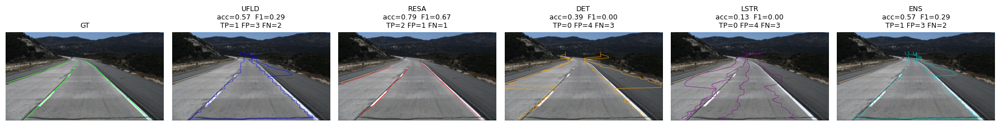


=== UFLD WINS (UFLD − RESA ≥ 0.30 acc) (6 samples) ===


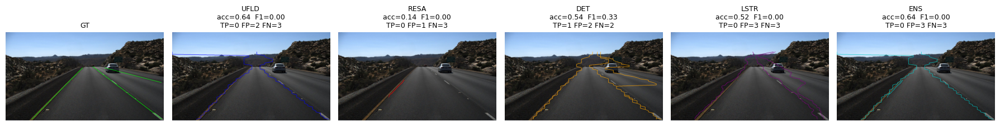

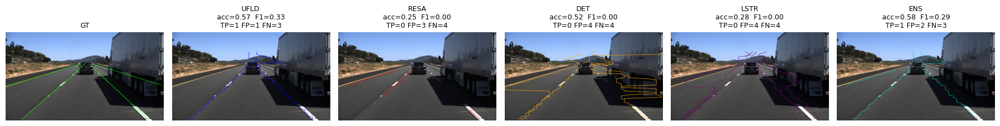

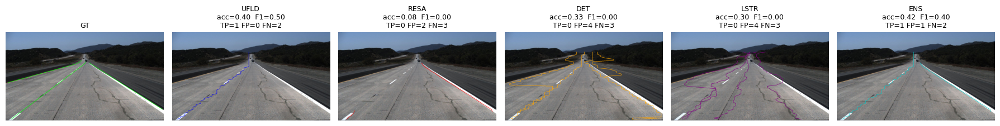

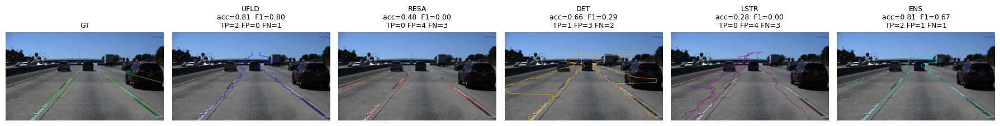

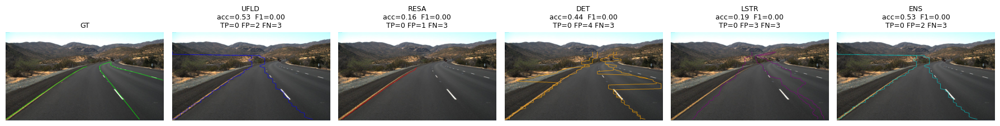

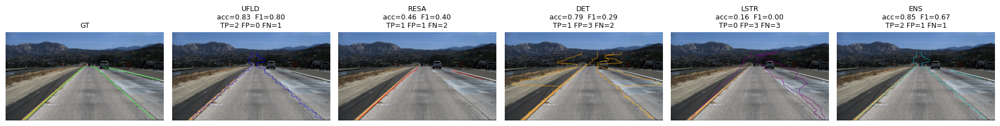


=== RESA WINS (RESA − UFLD ≥ 0.30 acc) (6 samples) ===


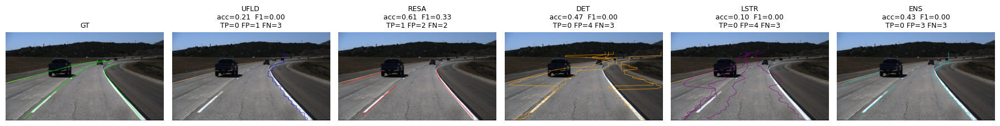

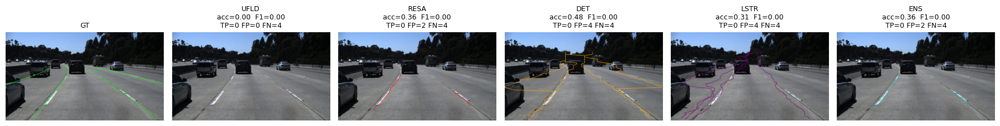

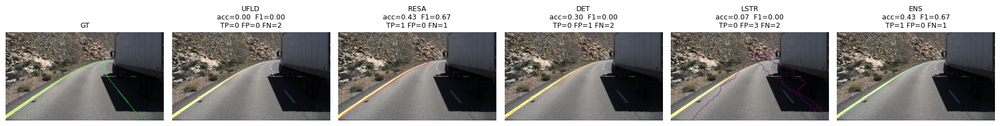

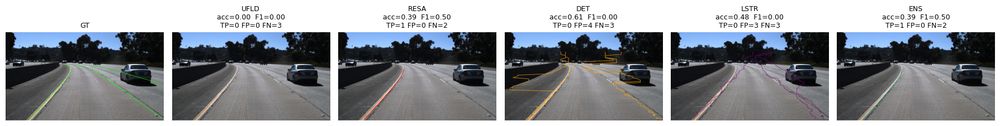

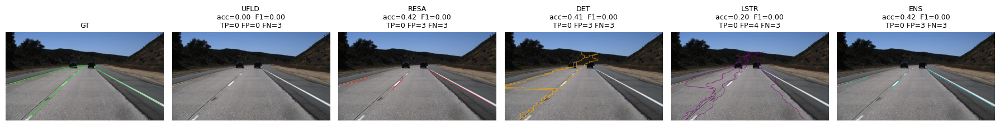

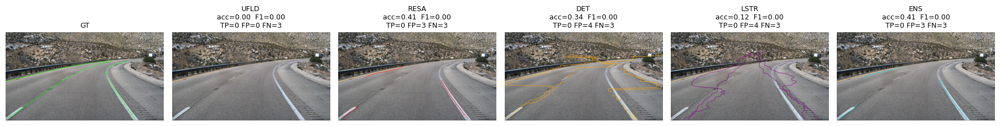


=== BOTH FAIL (TP=0 for RESA & UFLD) (6 samples) ===


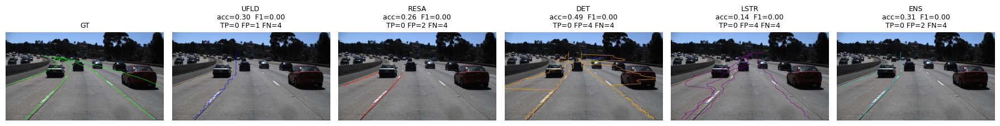

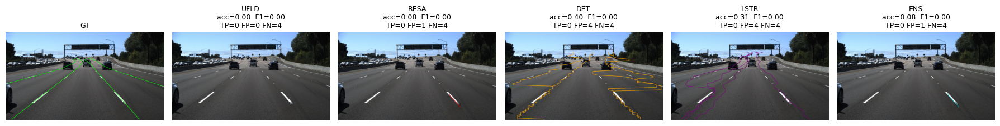

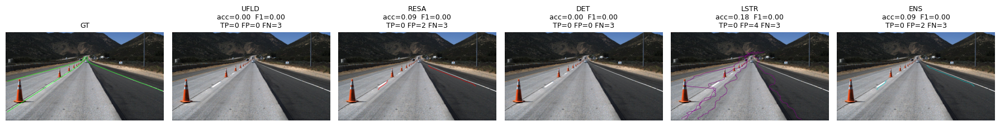

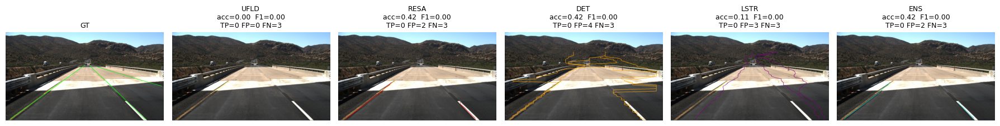

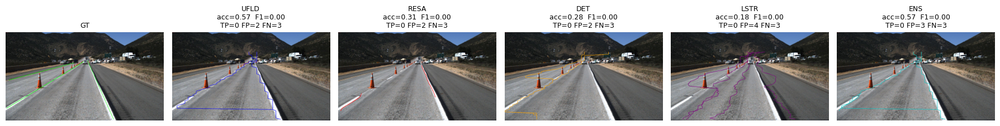

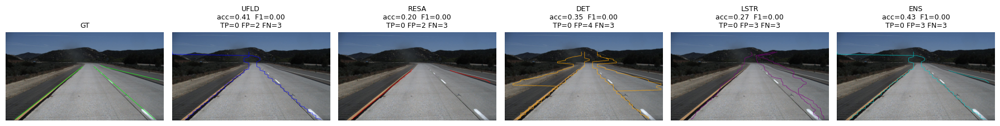


=== FP HEAVY (≥3 FPs in RESA or UFLD) (6 samples) ===


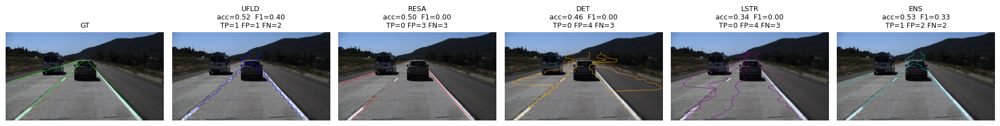

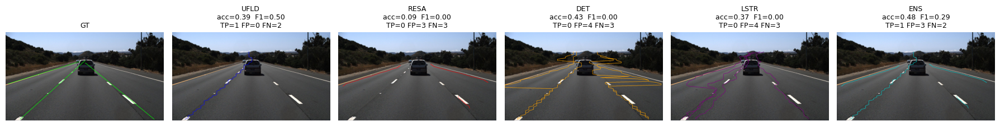

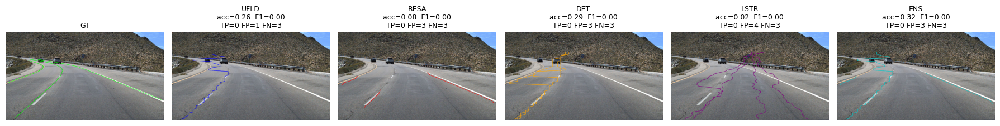

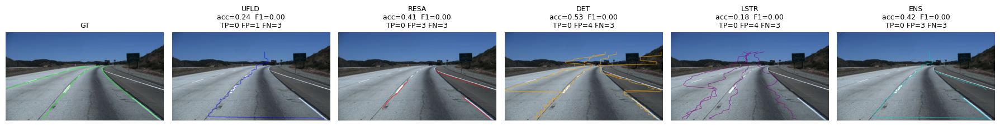

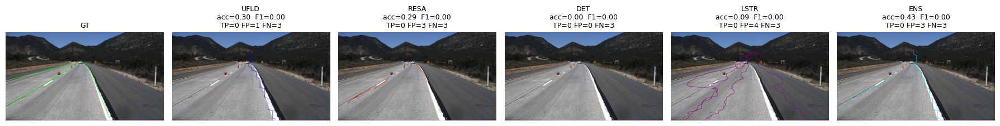

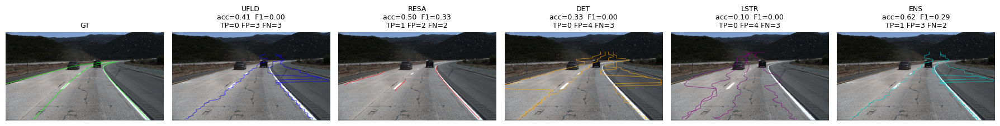


✓ Visual report saved:
 - Directory: /kaggle/working/lane_report
 - Open the gallery: /kaggle/working/lane_report/index.html


In [25]:
# ============================================
# Cell VIZ-REPORT: Visual report of lane detection results
# - Builds predictions for UFLD/RESA/Detector/LSTR + Ensemble
# - Computes per-image TP/FP/FN using your evaluator
# - Shows curated grids (success/failure/model-wins)
# - Saves an HTML gallery with overlays
# ============================================

import os, json, math, numpy as np, pandas as pd, cv2, torch, matplotlib.pyplot as plt
from torch.cuda.amp import autocast

# ----------- Reuse environment -----------
with open("/kaggle/working/config_tusimple.json","r") as f:
    CONFIG = json.load(f)
device = CONFIG["device"]
assert 'evaluate_dataset' in globals(), "Run Cell 3 first."
assert 'val_loader' in globals() and 'train_loader' in globals(), "Run Cell 4D first."
assert 'build_models' in globals(), "Run Cell 11 first to define build_models()."

# Use solid decoder presets (you can tweak later)
UFLD_KW = dict(p=0.30, min_rows=6, nms_thr=22.0, topk=4, smooth=3)
RESA_KW = dict(prob_thr=0.45, min_area=300, open_iter=1, close_iter=1, topk=4)
DET_KW  = dict(p_obj=0.45, row_conf=0.32, min_rows=6, nms_thr=22.0, topk=4)
LSTR_KW = dict(p_exist=0.62, smooth=3, topk=4)

# Make sure decoders exist (from Cell 12/13)
for fn in ['decode_ufld_tuned','decode_resa_tuned','decode_detector_tuned','decode_lstr_tuned']:
    assert fn in globals(), f"Missing {fn} — run Cell 12/13."

# ----------- Build sanitized GT list -----------
df_val = pd.read_parquet(CONFIG["dataframe_path"])
df_val = df_val[df_val["split"]=="val"].reset_index(drop=True)

def _to_int_or_none(x):
    try:
        f=float(x)
        if np.isfinite(f) and f>=0: return int(round(f))
    except: pass
    return None

VAL_GTS = []
for _, row in df_val.iterrows():
    h = [int(round(float(y))) for y in row["h_samples"]]
    lanes = [[_to_int_or_none(x) for x in lane] for lane in row["lanes"]]
    VAL_GTS.append({"raw_file": row["raw_file"], "h_samples": h, "lanes": lanes})
print(f"✓ GT ready: {len(VAL_GTS)} images.")

# ----------- Load models & run predictions -----------
ufld, resa, det, lstr = build_models()

@torch.no_grad()
def build_preds(model, kind, kw):
    preds={}
    for batch in val_loader:
        imgs=batch["image"].to(device); metas=batch["meta"]
        with autocast(enabled=(device=="cuda")):
            out=model(imgs)
        if kind=="ufld":     p=decode_ufld_tuned(out, metas, **kw)
        elif kind=="resa":   p=decode_resa_tuned(out, metas, **kw)
        elif kind=="det":    p=decode_detector_tuned(out[0], out[1], metas, **kw)
        else:                p=decode_lstr_tuned(out[0], out[1], metas, **kw)
        preds.update(p)
    return preds

print("→ Running models on val set (this is quick)…")
preds = {
    "UFLD": build_preds(ufld, "ufld", UFLD_KW),
    "RESA": build_preds(resa, "resa", RESA_KW),
    "DET" : build_preds(det,  "det",  DET_KW),
    "LSTR": build_preds(lstr, "lstr", LSTR_KW),
}

# Simple ensemble (RESA + UFLD), lane-NMS
def lane_distance_mean(xs1, xs2):
    s, n = 0.0, 0
    for a, b in zip(xs1, xs2):
        if a is not None and b is not None:
            s += abs(a-b); n += 1
    return 1e9 if n==0 else s/n

def nms_lanes(lanes, scores, thr=20.0, topk=4):
    if not lanes: return []
    order = np.argsort(scores)[::-1]
    keep=[]; suppressed=[False]*len(lanes)
    for i in order:
        if suppressed[i]: continue
        keep.append(i)
        if len(keep)>=topk: break
        for j in order:
            if suppressed[j] or j==i: continue
            if lane_distance_mean(lanes[i], lanes[j]) < thr:
                suppressed[j]=True
    return [lanes[i] for i in keep]

def score_lane(xs):
    return sum(1 for x in xs if x is not None)

preds_ens={}
for gt in VAL_GTS:
    raw=gt["raw_file"]; h=gt["h_samples"]
    lanes=[]; scores=[]
    for src_name in ["RESA","UFLD"]:
        for lane in preds[src_name].get(raw, {"lanes": []})["lanes"]:
            lanes.append(lane); scores.append(score_lane(lane))
    merged = nms_lanes(lanes, scores, thr=20.0, topk=4)
    preds_ens[raw] = {"h_samples": h, "lanes": merged}
preds["ENS"] = preds_ens

# ----------- Per-image metrics for each model -----------
def eval_one_image(gt_item, pred_item):
    res = evaluate_dataset([gt_item], {gt_item["raw_file"]: pred_item},
                           tol_px=CONFIG["eval"]["tolerance_px"],
                           tp_threshold=CONFIG["eval"]["tp_threshold"])
    # evaluate_dataset over 1 image returns totals; normalize to ints
    return dict(TP=int(res["TP"]), FP=int(res["FP"]), FN=int(res["FN"]),
                acc=float(res["accuracy"]), precision=float(res["precision"]),
                recall=float(res["recall"]), f1=float(res["f1"]))

per_image = []  # list of dicts: raw_file, metrics per model
for gt in VAL_GTS:
    row = {"raw_file": gt["raw_file"]}
    for name in ["UFLD","RESA","DET","LSTR","ENS"]:
        pi = preds[name].get(gt["raw_file"], {"lanes":[],"h_samples":gt["h_samples"]})
        row[name] = eval_one_image(gt, pi)
    per_image.append(row)
df_per = pd.DataFrame(per_image)
print("✓ Per-image metrics computed.")

# ----------- Pick representative examples -----------
def sel_idx_by_rule(rule_fn, k=6):
    idxs=[]
    for i, gt in enumerate(VAL_GTS):
        if rule_fn(df_per.iloc[i]): idxs.append(i)
    if len(idxs)>k:
        # sample diverse by raw_file hash
        rng = np.random.default_rng(42)
        idxs = list(rng.choice(idxs, size=k, replace=False))
    return idxs

# Heuristics: change the thresholds if you want different mixes
best_cases = sel_idx_by_rule(lambda r: r["RESA"]["acc"]>=0.75, k=6)
ufld_wins  = sel_idx_by_rule(lambda r: r["UFLD"]["acc"] - r["RESA"]["acc"] >= 0.30, k=6)
resa_wins  = sel_idx_by_rule(lambda r: r["RESA"]["acc"] - r["UFLD"]["acc"] >= 0.30, k=6)
fails_both = sel_idx_by_rule(lambda r: r["RESA"]["TP"]==0 and r["UFLD"]["TP"]==0, k=6)
fp_heavy   = sel_idx_by_rule(lambda r: r["RESA"]["FP"]>=3 or r["UFLD"]["FP"]>=3, k=6)

print(f"Picked: best={len(best_cases)}, ufld_wins={len(ufld_wins)}, resa_wins={len(resa_wins)}, fails={len(fails_both)}, fp_heavy={len(fp_heavy)}")

# ----------- Overlay drawing -----------
def _safe_int(v):
    try:
        f=float(v)
        if not np.isfinite(f): return None
        return int(round(f))
    except: return None

def draw_overlay(img_rgb, h, lanes, color):
    out = img_rgb.copy()
    for lane in lanes:
        pts=[]
        for x,y in zip(lane, h):
            xi=_safe_int(x); yi=_safe_int(y)
            if xi is None or yi is None: continue
            xi = max(0, min(out.shape[1]-1, xi))
            yi = max(0, min(out.shape[0]-1, yi))
            pts.append((xi, yi))
        for i in range(1,len(pts)):
            cv2.line(out, pts[i-1], pts[i], color, 2)
    return out

COLORS = {
    "GT"  : (0,255,0),   # green
    "UFLD": (0,0,255),   # red
    "RESA": (255,0,0),   # blue
    "DET" : (255,165,0), # orange-ish
    "LSTR": (128,0,128), # purple-ish
    "ENS" : (0,200,200), # cyan-ish
}

def make_panel(idx):
    m = df_val.iloc[idx]
    img = cv2.cvtColor(cv2.imread(m["img_path"], cv2.IMREAD_COLOR), cv2.COLOR_BGR2RGB)
    h  = m["h_samples"]
    gt = m["lanes"]

    raws = {"GT": gt}
    for name in ["UFLD","RESA","DET","LSTR","ENS"]:
        raws[name] = preds[name][m["raw_file"]]["lanes"]

    # Build 1x6 wide panel
    fig = plt.figure(figsize=(18,3.2))
    titles=[]
    for j, name in enumerate(["GT","UFLD","RESA","DET","LSTR","ENS"]):
        vis = draw_overlay(img, h, (gt if name=="GT" else raws[name]), COLORS[name])
        ax = plt.subplot(1,6,j+1); ax.imshow(vis); ax.axis("off")
        if name=="GT":
            t = "GT"
        else:
            s = df_per.iloc[idx][name]
            t = f"{name}\nacc={s['acc']:.2f}  F1={s['f1']:.2f}\nTP={s['TP']} FP={s['FP']} FN={s['FN']}"
        ax.set_title(t, fontsize=9)
    plt.tight_layout()
    return fig

# ----------- Show a few grids inline -----------
def show_category(title, indices):
    if not indices:
        print(f"(no samples for {title})")
        return
    print(f"\n=== {title} ({len(indices)} samples) ===")
    for idx in indices[:6]:
        fig = make_panel(idx)
        plt.show()

show_category("BEST CASES (RESA ≥ 0.75 acc)", best_cases)
show_category("UFLD WINS (UFLD − RESA ≥ 0.30 acc)", ufld_wins)
show_category("RESA WINS (RESA − UFLD ≥ 0.30 acc)", resa_wins)
show_category("BOTH FAIL (TP=0 for RESA & UFLD)", fails_both)
show_category("FP HEAVY (≥3 FPs in RESA or UFLD)", fp_heavy)

# ----------- Save an HTML gallery with all panels -----------
out_dir = "/kaggle/working/lane_report"
os.makedirs(out_dir, exist_ok=True)

html = ["<html><head><meta charset='utf-8'><title>Lane Report</title></head><body>"]
html.append("<h2>Lane Detection Visual Report</h2>")
html.append("<p>GT (green) vs predictions: UFLD (red), RESA (blue), DET (orange), LSTR (purple), ENS (cyan)</p>")

def save_panel_png(idx, prefix):
    fig = make_panel(idx)
    path = os.path.join(out_dir, f"{prefix}_{idx}.png")
    fig.savefig(path, dpi=110, bbox_inches='tight')
    plt.close(fig)
    return path

def add_section(title, indices, prefix):
    if not indices: return
    html.append(f"<h3>{title} ({len(indices)} samples)</h3><div style='display:flex;flex-wrap:wrap;'>")
    for i, idx in enumerate(indices):
        p = save_panel_png(idx, prefix)
        rel = os.path.basename(p)
        html.append(f"<div style='margin:6px'><img src='{rel}' width='1000'><br><code>{df_val.iloc[idx]['raw_file']}</code></div>")
    html.append("</div>")

add_section("BEST CASES (RESA ≥ 0.75 acc)", best_cases, "best")
add_section("UFLD WINS (UFLD − RESA ≥ 0.30)", ufld_wins, "ufldwins")
add_section("RESA WINS (RESA − UFLD ≥ 0.30)", resa_wins, "resawins")
add_section("BOTH FAIL (TP=0 for RESA & UFLD)", fails_both, "fails")
add_section("FP HEAVY (≥3 FPs)", fp_heavy, "fpheavy")

html.append("</body></html>")
with open(os.path.join(out_dir, "index.html"), "w") as f:
    f.write("\n".join(html))

print("\n✓ Visual report saved:")
print(" - Directory:", out_dir)
print(" - Open the gallery: /kaggle/working/lane_report/index.html")